# Separate replicas into files

In [2]:
import os
import pandas as pd
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from IPython.display import display
import numpy as np
import xgboost as xgb
import joblib

In [3]:
def sepReplicas(path):
  trade_cpu = pd.read_csv(f'{path}/trade_cpu.csv')
  # Przekształć tabelę, aby każda replika miała swoją kolumnę
  trade_cpu_pivot = trade_cpu.pivot(index='timestamp', columns='replicaId', values=['cpuUsage', 'memoryUsage'])

  # Zmień nazwy kolumn, aby były bardziej czytelne
  trade_cpu_pivot.columns = [f'{col[0]}_replica_{col[1]}' for col in trade_cpu_pivot.columns]

  # Zamień kolumnę 'timestamp' na typ datetime
  trade_cpu_pivot.index = pd.to_datetime(trade_cpu_pivot.index, format='ISO8601', errors='coerce')

  # Interpoluj dane, aby wypełnić NaN (wypełnienie liniowe oparte na czasie)
  trade_cpu_pivot_interpolated = trade_cpu_pivot.interpolate(method='time')

  # Opcjonalnie możesz również wypełnić pozostałe NaN, które mogą nie być wypełnione przez interpolację
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')

  # Zresetuj indeks, aby timestamp był zwykłą kolumną
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.reset_index()

  # Ścieżka do katalogu
  output_path = path

  # Dla każdej repliki zapisz dane do osobnego pliku
  replica_ids = trade_cpu['replicaId'].unique()
  for replica_id in replica_ids:
      # Wyodrębnij dane dla konkretnej repliki
      replica_data = trade_cpu_pivot_interpolated[['timestamp', f'cpuUsage_replica_{replica_id}', f'memoryUsage_replica_{replica_id}']]
      
      # Nazwij plik
      file_name = f'trade_replica{replica_id}_cpu.csv'
      
      # Zapisz do pliku CSV
      replica_data.to_csv(os.path.join(output_path, file_name), index=False)
      
      print(f'Dane dla repliki {replica_id} zapisane w pliku: {file_name}')


# Merge all data

In [4]:
import os
import pandas as pd

def mergeData(directory):
  # Wczytanie głównych plików
  complete_market_log = pd.read_csv(f'{directory}/complete_market_log_csv.csv')
  market_cpu = pd.read_csv(f'{directory}/market_cpu.csv')
  sum_trade_log = pd.read_csv(f'{directory}/sum_trade_log.csv')
  traffic_cpu = pd.read_csv(f'{directory}/traffic_cpu.csv')

  # Przekształcenie kolumny 'timestamp' na datetime
  complete_market_log['timestamp'] = pd.to_datetime(complete_market_log['timestamp'], format='ISO8601', errors='coerce')
  market_cpu['timestamp'] = pd.to_datetime(market_cpu['timestamp'], format='ISO8601', errors='coerce')
  sum_trade_log['timestamp'] = pd.to_datetime(sum_trade_log['timestamp'], format='ISO8601', errors='coerce')
  traffic_cpu['timestamp'] = pd.to_datetime(traffic_cpu['timestamp'], format='ISO8601', errors='coerce')

  # Usunięcie niepotrzebnych kolumn 'id_x', 'id_y' jeśli istnieją
  complete_market_log = complete_market_log.drop(columns=[col for col in complete_market_log.columns if col.startswith('id')], errors='ignore')
  market_cpu = market_cpu.drop(columns=[col for col in market_cpu.columns if col.startswith('id')], errors='ignore')
  sum_trade_log = sum_trade_log.drop(columns=[col for col in sum_trade_log.columns if col.startswith('id')], errors='ignore')
  traffic_cpu = traffic_cpu.drop(columns=[col for col in traffic_cpu.columns if col.startswith('id')], errors='ignore')


  # Przechodzenie przez wszystkie pliki w katalogu
  trade_replica_dfs = []
  traffic_cpu.columns = [f"{col}_traffic" if col not in ['timestamp'] else col for col in traffic_cpu.columns]

  # Przechodzenie przez wszystkie pliki w katalogu
  for filename in os.listdir(directory):
      if filename.startswith("trade_replica") and filename.endswith("_cpu.csv"):
          file_path = os.path.join(directory, filename)
          # Wczytanie pliku do DataFrame
          df = pd.read_csv(file_path)
          df['timestamp'] = pd.to_datetime(df['timestamp'], format='ISO8601', errors='coerce')
          # Usunięcie kolumn 'id' jeśli istnieją
          df = df.drop(columns=[col for col in df.columns if col.startswith('id')], errors='ignore')
          
          # Zmiana nazw kolumn dla cpuUsage_replica i memoryUsage_replica
          df.columns = [f"{col}_trade" if 'cpuUsage_replica' in col or 'memoryUsage_replica' in col else col for col in df.columns]
          
          trade_replica_dfs.append(df)

  # Połączenie wszystkich DataFrames z listy (merge_asof)
  for df in trade_replica_dfs:
      traffic_cpu = pd.merge_asof(traffic_cpu.sort_values('timestamp'), 
                                  df.sort_values('timestamp'), 
                                  on='timestamp', 
                                  direction='nearest')

  # Zmiana nazw kolumn dla lepszej czytelności (opcjonalnie)
  complete_market_log.columns = [f"{col}_market" if col not in ['timestamp'] else col for col in complete_market_log.columns]
  market_cpu.columns = [f"{col}_cpu" if col not in ['timestamp'] else col for col in market_cpu.columns]
  sum_trade_log.columns = [f"{col}_trade" if col not in ['timestamp'] else col for col in sum_trade_log.columns]


  # Łączenie wszystkich danych bez konfliktów nazw kolumn
  merged_data = pd.merge_asof(complete_market_log.sort_values('timestamp'), 
                              market_cpu.sort_values('timestamp'), 
                              on='timestamp', 
                              direction='nearest')

  merged_data = pd.merge_asof(merged_data.sort_values('timestamp'), 
                              sum_trade_log.sort_values('timestamp'), 
                              on='timestamp', 
                              direction='nearest')

  merged_data = pd.merge_asof(merged_data.sort_values('timestamp'), 
                              traffic_cpu.sort_values('timestamp'), 
                              on='timestamp', 
                              direction='nearest')

  # Ostateczna zmiana nazw kolumn, jeśli chcesz uzyskać bardziej spójne nazwy
  merged_data.columns = [col.replace('_market_traffic', '_market') for col in merged_data.columns]
  merged_data.columns = [col.replace('_market_cpu', '_cpu') for col in merged_data.columns]
  merged_data.columns = [col.replace('_traffic_cpu', '_traffic') for col in merged_data.columns]

  # Zapisz wynikowy DataFrame do pliku CSV
  merged_data.to_csv(f'{directory}/merged_data.csv', index=False)

In [5]:
def association(path):
  df_path = f'{path}/merged_data.csv'  # Ścieżka do pliku CSV
  df = pd.read_csv(df_path)  # Wczytanie pliku do DataFrame
  # Krok 2: Przekształcenie na wartości binarne dla sprzedaży i kupna
  df['sell_offer_processed'] = (df['numberOfSellOffers_trade'] - df['numberOfSellOffers_trade'].shift(1) == 1).astype(bool)
  df['buy_offer_processed'] = (df['numberOfBuyOffers_trade'] - df['numberOfBuyOffers_trade'].shift(1) == 1).astype(bool)

  # Binaryzacja zmiennych numerycznych (np. CPU, pamięć)
  df['high_cpuUsage_market'] = (df['cpuUsage_cpu'] > 70).astype(bool)
  df['high_memoryUsage'] = (df['memoryUsage_cpu'] > 14).astype(bool)

  df['high_cpuUsage_traffic'] = (df['cpuUsage_traffic'] > 70).astype(bool)

  # Binaryzacja czasów operacji: databaseTime_market, apiTime_market, databaseTime_trade
  df['high_databaseTime_market'] = (df['databaseTime_market'] > df['databaseTime_market'].median()).astype(bool)
  df['high_databaseTime_trade'] = (df['databaseTime_trade'] > df['databaseTime_trade'].median()).astype(bool)

  # Krok 3: Wybór zmiennych binarnych do analizy
  df_bin = df[['sell_offer_processed', 'buy_offer_processed', 'high_cpuUsage_market', 'high_memoryUsage', 
              'high_databaseTime_market', 'high_databaseTime_trade', 'high_cpuUsage_traffic']]

  # Krok 4: Zastosowanie algorytmu Apriori do znalezienia częstych zestawów
  frequent_itemsets = apriori(df_bin, min_support=0.1, use_colnames=True)

  # Generowanie reguł asocjacyjnych na podstawie częstych zestawów
  rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)

  # Krok 5: Filtracja reguł, aby wybrać tylko te z lift > 1.2
  important_rules = rules[rules['lift'] > 1.2].copy()

  # Tworzenie czytelnych etykiet dla antecedents i consequents
  # Zaokrąglenie wartości 'support', 'confidence', 'lift' do 2 miejsc po przecinku
  important_rules['support'] = important_rules['support'].round(5)
  important_rules['confidence'] = important_rules['confidence'].round(5)
  important_rules['lift'] = important_rules['lift'].round(5)

  # Tworzenie czytelnych etykiet dla antecedents i consequents
  important_rules['antecedents'] = important_rules['antecedents'].apply(lambda x: ', '.join(list(x)))
  important_rules['consequents'] = important_rules['consequents'].apply(lambda x: ', '.join(list(x)))

  # # Wyświetlenie najważniejszych reguł po filtracji
  # print("Tabelaryczne zestawienie najważniejszych reguł asocjacyjnych:")
  # print(important_rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']])

  display(important_rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']])

  # Krok 7: Tworzenie grafu reguł asocjacyjnych
  G = nx.DiGraph()

  # Dodawanie krawędzi do grafu na podstawie reguł
  for _, row in important_rules.iterrows():
      for antecedent in row['antecedents'].split(', '):
          for consequent in row['consequents'].split(', '):
              G.add_edge(antecedent, consequent, weight=row['lift'])

  # Rysowanie grafu
  plt.figure(figsize=(12, 10))
  pos = nx.spring_layout(G)
  nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=10, font_weight='bold')
  labels = nx.get_edge_attributes(G, 'weight')
  nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
  plt.title('Graf reguł asocjacyjnych (lift > 1.2)')
  plt.show()

In [6]:
def bigCorrelation(path):
    # Wczytanie pliku CSV do DataFrame
    df_path = f'{path}/merged_data.csv'  # Ścieżka do pliku CSV
    df = pd.read_csv(df_path)  # Wczytanie pliku do DataFrame

    # Pominięcie kolumn ze stringami (np. "apiMethod_market" oraz "timestamp")
    df_numeric = df.select_dtypes(include=['float64', 'int64'])

    # Obliczenie macierzy korelacji
    correlation_matrix = df_numeric.corr()

    # Sortowanie macierzy korelacji względem średniej korelacji danej zmiennej z pozostałymi
    mean_corr = correlation_matrix.mean(axis=1)
    sorted_index = mean_corr.sort_values(ascending=False).index

    # Sortowanie zarówno wierszy, jak i kolumn według tego samego porządku
    sorted_corr_matrix = correlation_matrix.loc[sorted_index, sorted_index]

    # Ustawienie maski dla górnej trójkątnej części macierzy
    mask = np.triu(np.ones_like(sorted_corr_matrix, dtype=bool))

    # Wizualizacja posortowanej macierzy korelacji z maską
    plt.figure(figsize=(12, 8))
    sns.heatmap(sorted_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", mask=mask)
    plt.title('Correlation Heatmap')
    plt.show()

In [7]:
def smallCorrelation(path):
  df_path = f'{path}/merged_data.csv'  # Ścieżka do pliku CSV
  df = pd.read_csv(df_path)  # Wczytanie pliku do DataFrame
  # Znalezienie kolumn zaczynających się od 'cpuUsage_replica_' oraz 'memoryUsage_replica_'
  cpu_cols = [col for col in df.columns if col.startswith('cpuUsage_replica_')]
  memory_cols = [col for col in df.columns if col.startswith('memoryUsage_replica_')]

  # Obliczenie średniej dla kolumn CPU i Memory
  df['cpuUsage_trade'] = df[cpu_cols].mean(axis=1)
  df['memoryUsage_trade'] = df[memory_cols].mean(axis=1)

  # Pominięcie kolumn ze stringami oraz kolumn replik, które zostały zastąpione nowymi zbiorczymi kolumnami
  df_numeric = df.select_dtypes(include=['float64', 'int64']).drop(columns=cpu_cols + memory_cols)

  # Obliczenie korelacji
  correlation_matrix = df_numeric.corr()

  # Sortowanie macierzy korelacji względem średniej korelacji danej zmiennej z pozostałymi
  mean_corr = correlation_matrix.mean(axis=1)
  sorted_index = mean_corr.sort_values(ascending=False).index

  # Sortowanie zarówno wierszy, jak i kolumn według tego samego porządku
  sorted_corr_matrix = correlation_matrix.loc[sorted_index, sorted_index]

  # Ustawienie maski dla górnej trójkątnej części macierzy
  mask = np.triu(np.ones_like(sorted_corr_matrix, dtype=bool))

  # Wizualizacja posortowanej macierzy korelacji z maską
  plt.figure(figsize=(12, 8))
  sns.heatmap(sorted_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", mask=mask)
  plt.title('Correlation Heatmap (CPU and Memory Trade Aggregated)')
  plt.show()


In [8]:
def xgbTree(path, param):

  # 2. Wczytaj dane
  model_path = f'{path}/xgboost_gpu_model_{param}.pkl'
  file_path = f'{path}/merged_data.csv'  # Zmień ścieżkę na właściwą
  data = pd.read_csv(file_path)
  
  timestamps = data['timestamp'] 

  # 3. Przygotowanie zmiennych zależnych i objaśniających
  data = data.drop(columns=['timestamp', 'endpointUrl_market', "apiMethod_market"])
  X = data.drop(columns=[param])
  y = data[param]

  X_train, X_test, y_train, y_test, timestamps_train, timestamps_test = train_test_split(X, y, timestamps, test_size=0.2, random_state=42)

  # 4. Konwersja danych do formatu DMatrix (optymalnego dla XGBoost)
  train_data = xgb.DMatrix(X_train, label=y_train)
  test_data = xgb.DMatrix(X_test, label=y_test)

  # 5. Sprawdzanie, czy model już istnieje
  if os.path.exists(model_path):
      print(f"Wczytywanie modelu z {model_path}")
      model = joblib.load(model_path)
  else:
      # Ustawienie parametrów modelu z wykorzystaniem GPU
      params = {
          'tree_method': 'hist',  # Metoda budowy drzew
          'device': 'cuda',       # Użycie GPU (CUDA)
          'objective': 'reg:squarederror',  # Regresja
          'max_depth': 10,  # Głębokość drzewa
          # 'learning_rate': 0.1,  # Szybkość uczenia
      }

      # Trenowanie modelu
      print("Trenowanie nowego modelu...")
      model = xgb.train(params, train_data, num_boost_round=100)

      # Zapisz model do pliku
      joblib.dump(model, model_path)
      print(f"Model zapisany do {model_path}")

  # 6. Prognozowanie na danych testowych
  y_pred = model.predict(test_data)

  # 7. Ocena modelu
  mse = mean_squared_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)
  print(f'Mean Squared Error: {mse}')
  print(f'R² score: {r2}')

  # Przewidywanie na zestawie testowym
  y_pred = model.predict(test_data)

  # Wykres rzeczywistych vs przewidywanych wartości
  plt.figure(figsize=(10, 6))
  sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Linia referencyjna
  plt.xlabel('Rzeczywiste wartości')
  plt.ylabel('Przewidywane wartości')
  plt.title('Rzeczywiste vs Przewidywane wartości')
  plt.show()

  residuals = y_test - y_pred
  plt.figure(figsize=(10, 6))
  sns.scatterplot(x=y_pred, y=residuals, alpha=0.5)
  plt.axhline(0, color='r', linestyle='--')
  plt.xlabel('Przewidywane wartości')
  plt.ylabel('Reszty')
  plt.title('Wykres reszt')
  plt.show()
 


    # 8. Wykres rzeczywistych vs przewidywanych wartości na osi czasu
# Sub-sampling danych, aby wyświetlić np. co 100-ny rekord
# Agregacja danych po godzinie
  data = pd.DataFrame({
      'timestamp': timestamps_test,
      'y_test': y_test,
      'y_pred': y_pred
  })

  data['timestamp'] = pd.to_datetime(data['timestamp'])
  aggregated = data.resample('T', on='timestamp').mean()  # Agregacja po godzinach (można zmienić na inne interwały)

  plt.figure(figsize=(12, 6))
  plt.plot(aggregated.index, aggregated['y_test'], label='Rzeczywiste wartości', color='blue', linestyle='dashed')
  plt.plot(aggregated.index, aggregated['y_pred'], label='Przewidywane wartości', color='red', linestyle='dashed')
  plt.xlabel('Czas (timestamp)')
  plt.ylabel(param)
  plt.title(f'Rzeczywiste vs Przewidywane wartości {param} w czasie (Agregowane 1 min)')
  plt.legend()
  plt.xticks(rotation=45)
  plt.tight_layout()
  plt.show()

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv


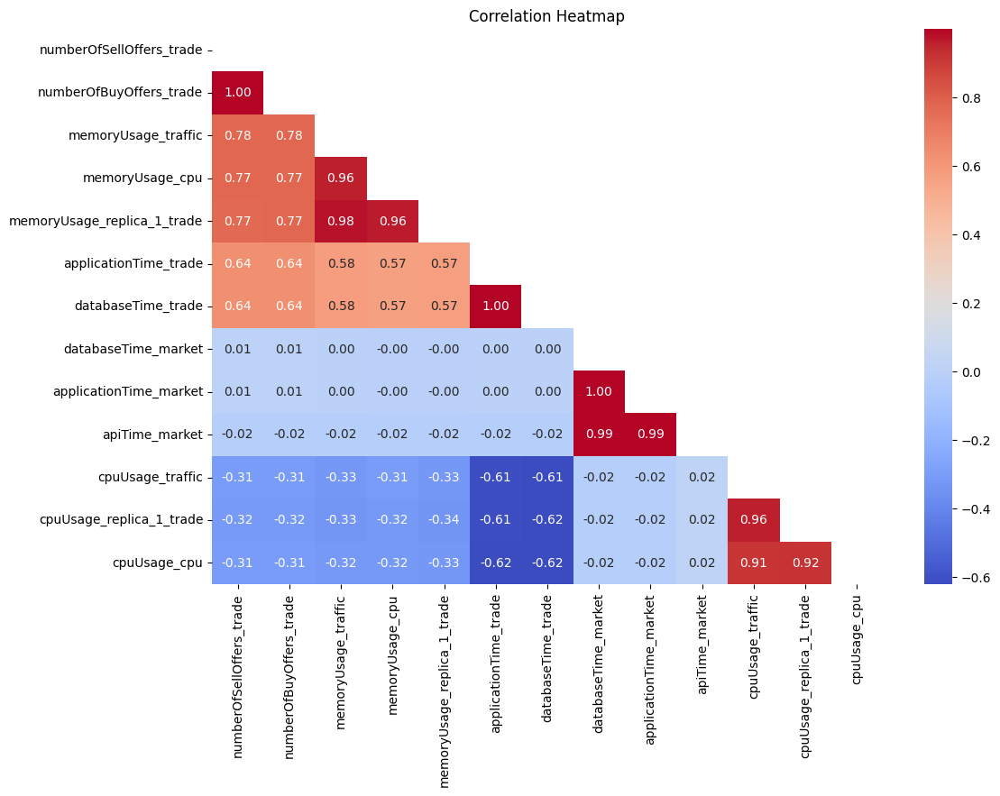

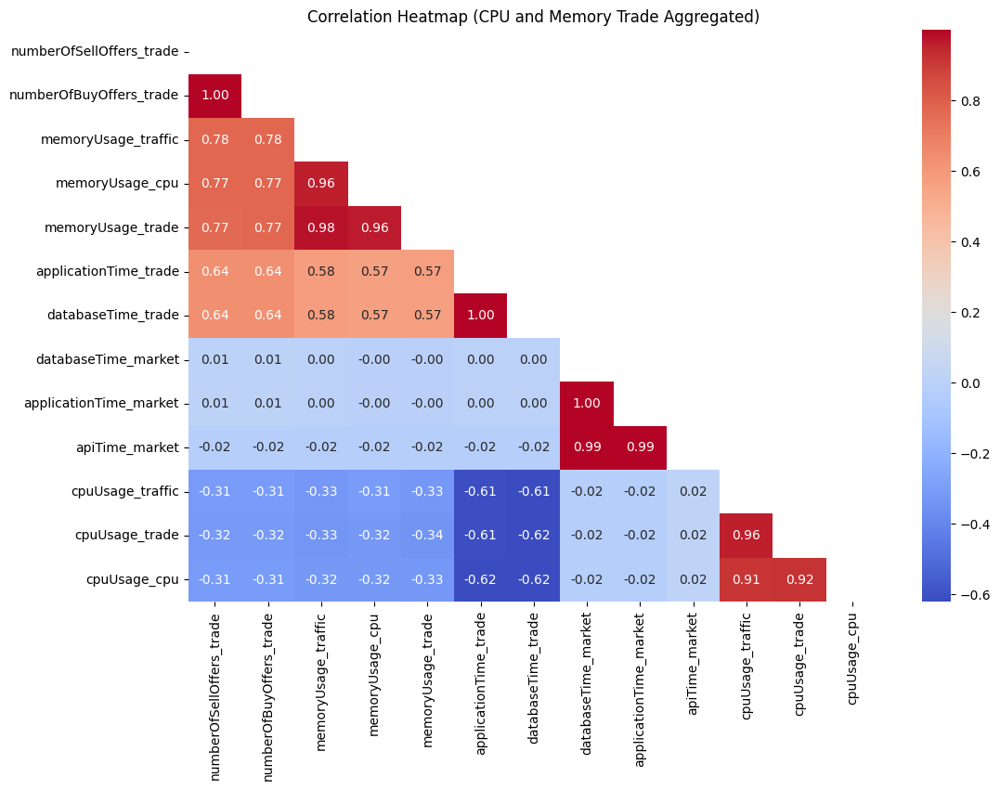

,antecedents,consequents,support,confidence,lift


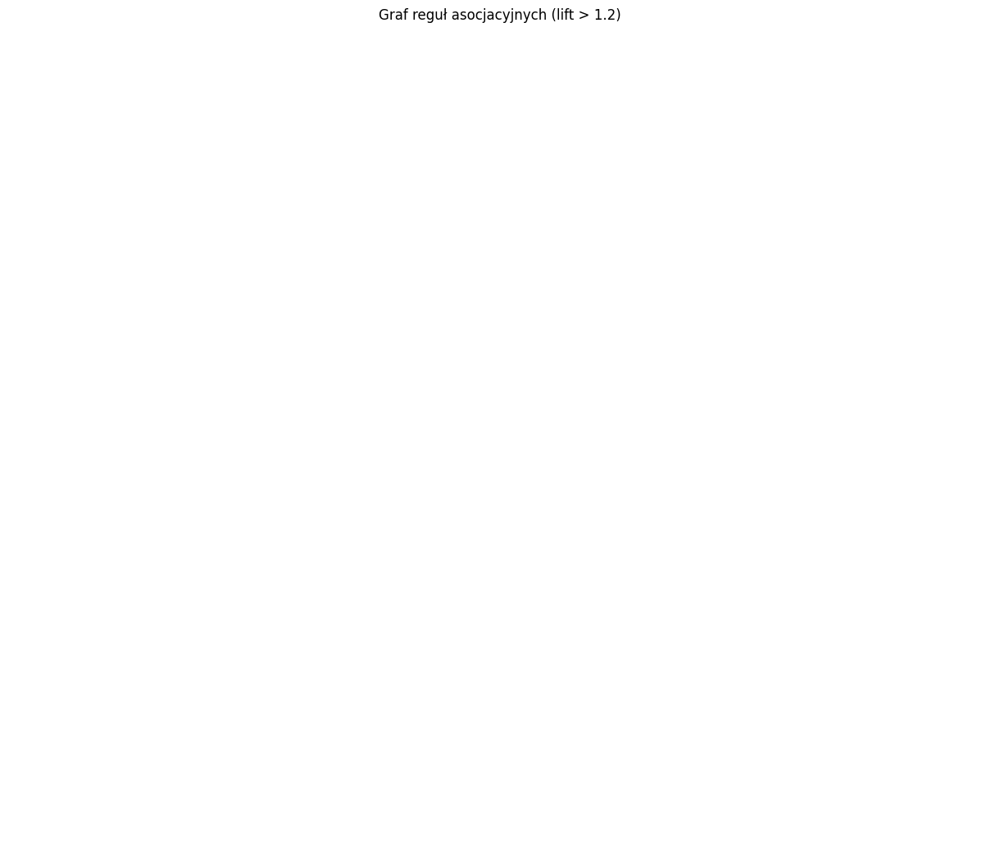

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\1 10 200 500 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 11.838662263799762
R² score: 0.9998343455015387


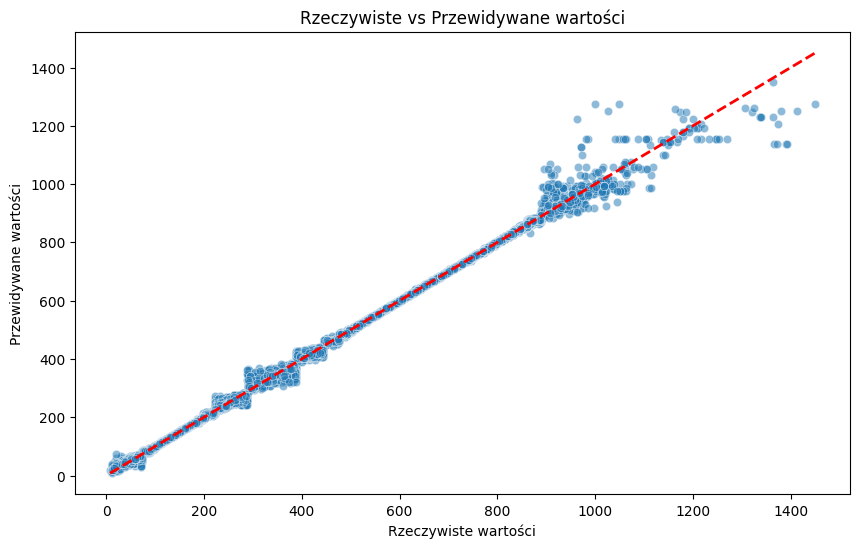

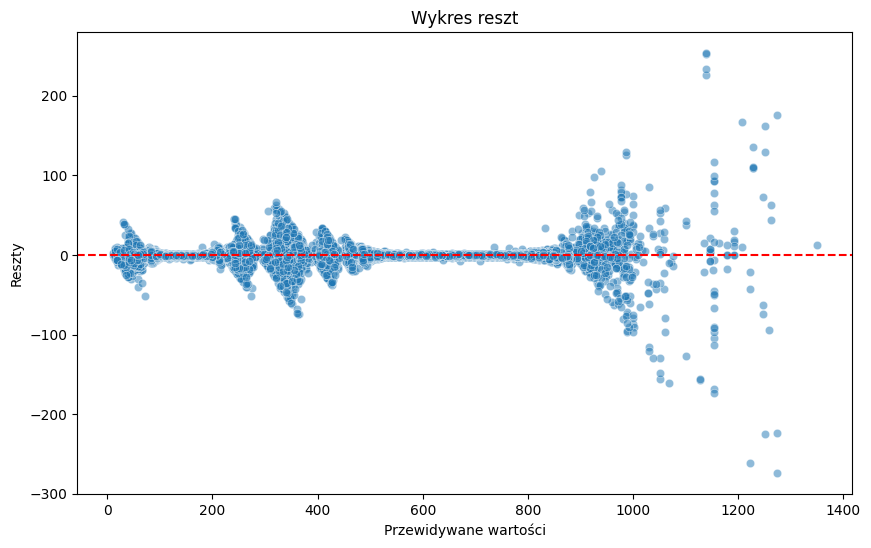

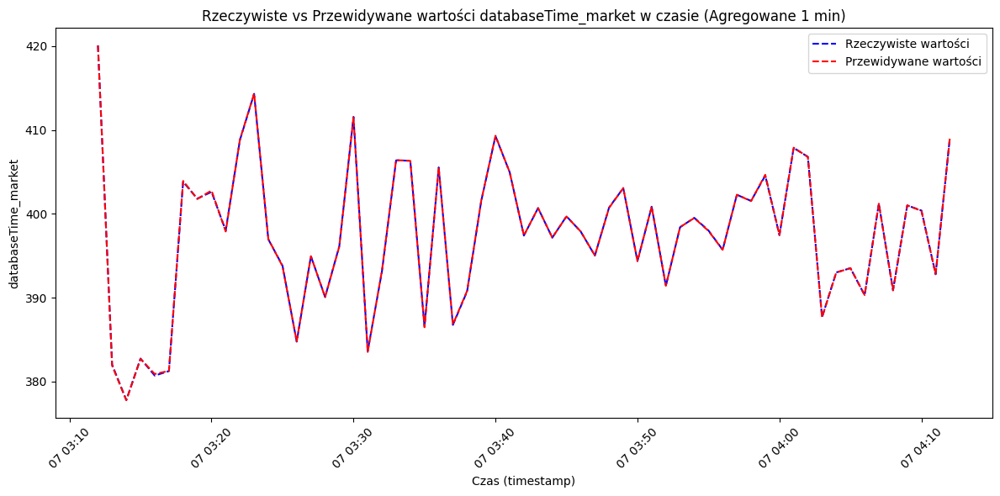

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\1 10 200 500 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.052213295355973466
R² score: 0.9938718967552305


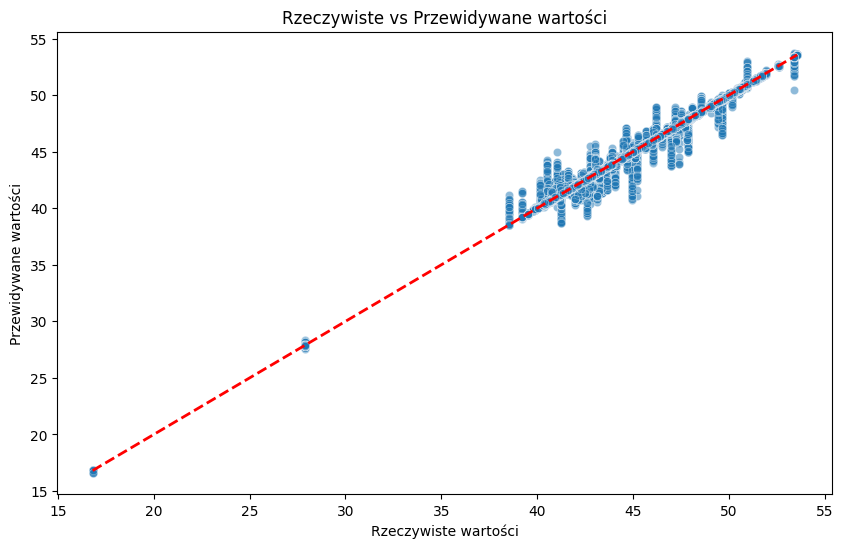

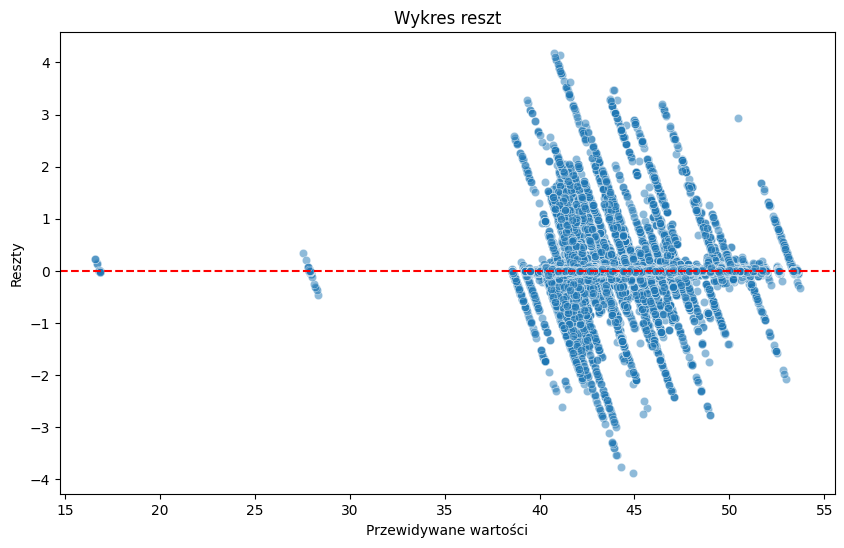

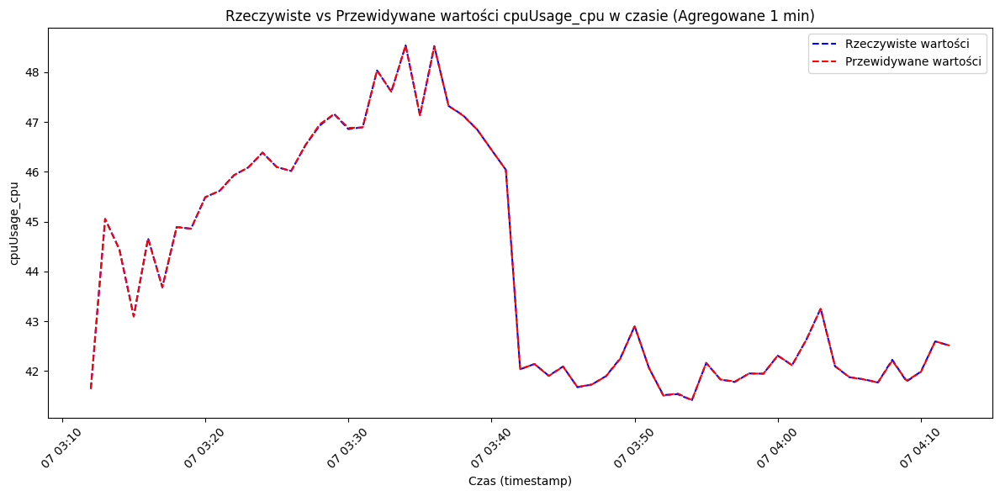

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 6 zapisane w pliku: trade_replica6_cpu.csv
Dane dla repliki 10 zapisane w pliku: trade_replica10_cpu.csv
Dane dla repliki 9 zapisane w pliku: trade_replica9_cpu.csv
Dane dla repliki 5 zapisane w pliku: trade_replica5_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 8 zapisane w pliku: trade_replica8_cpu.csv
Dane dla repliki 7 zapisane w pliku: trade_replica7_cpu.csv


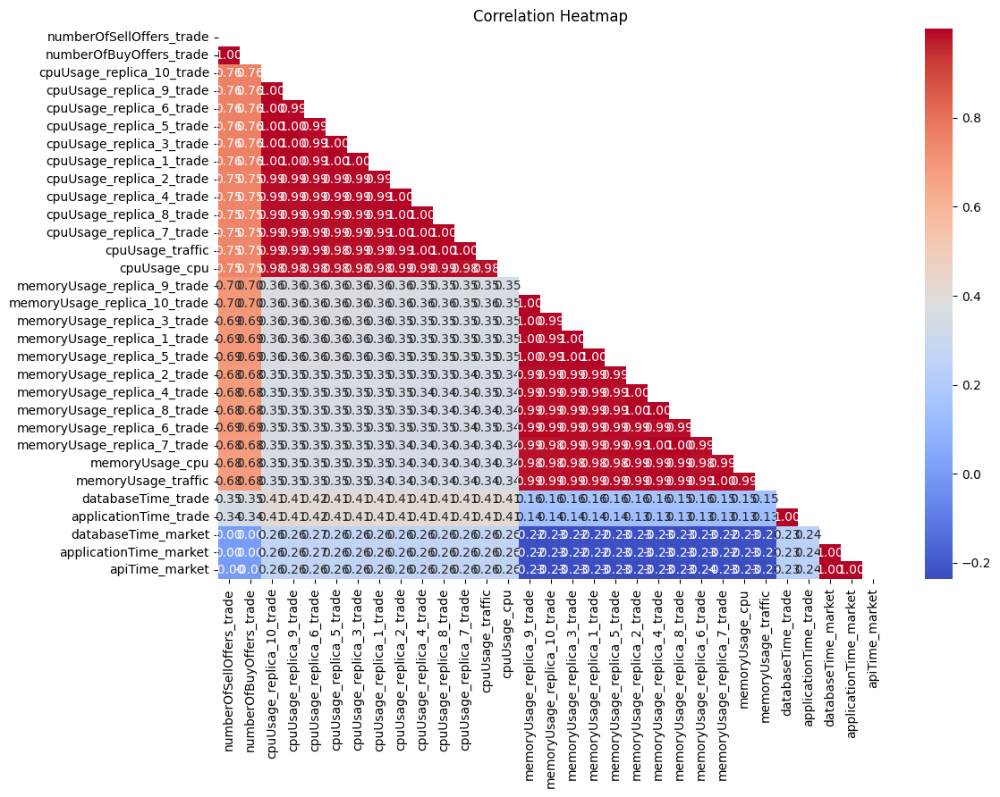

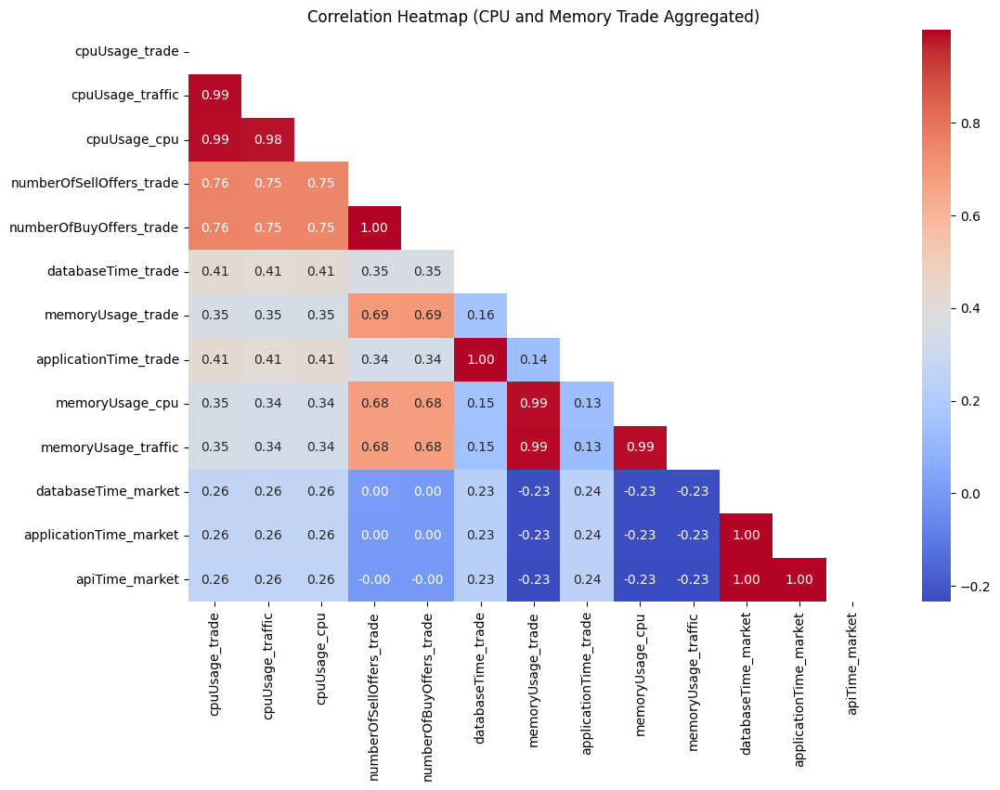

,antecedents,consequents,support,confidence,lift
10,high_cpuUsage_traffic,high_cpuUsage_market,0.79020,0.98636,1.22767
11,high_cpuUsage_market,high_cpuUsage_traffic,0.79020,0.98352,1.22767
21,"sell_offer_processed, high_cpuUsage_traffic",high_cpuUsage_market,0.10854,0.98847,1.23030
22,"sell_offer_processed, high_cpuUsage_market",high_cpuUsage_traffic,0.10854,0.98471,1.22916
30,"buy_offer_processed, high_cpuUsage_traffic",high_cpuUsage_market,0.10851,0.98843,1.23025
31,"buy_offer_processed, high_cpuUsage_market",high_cpuUsage_traffic,0.10851,0.98473,1.22919
42,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.79020,0.98636,1.22767
43,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.79020,0.98352,1.22767
46,high_cpuUsage_traffic,"high_memoryUsage, high_cpuUsage_market",0.79020,0.98636,1.22767
47,high_cpuUsage_market,"high_memoryUsage, high_cpuUsage_traffic",0.79020,0.98352,1.22767


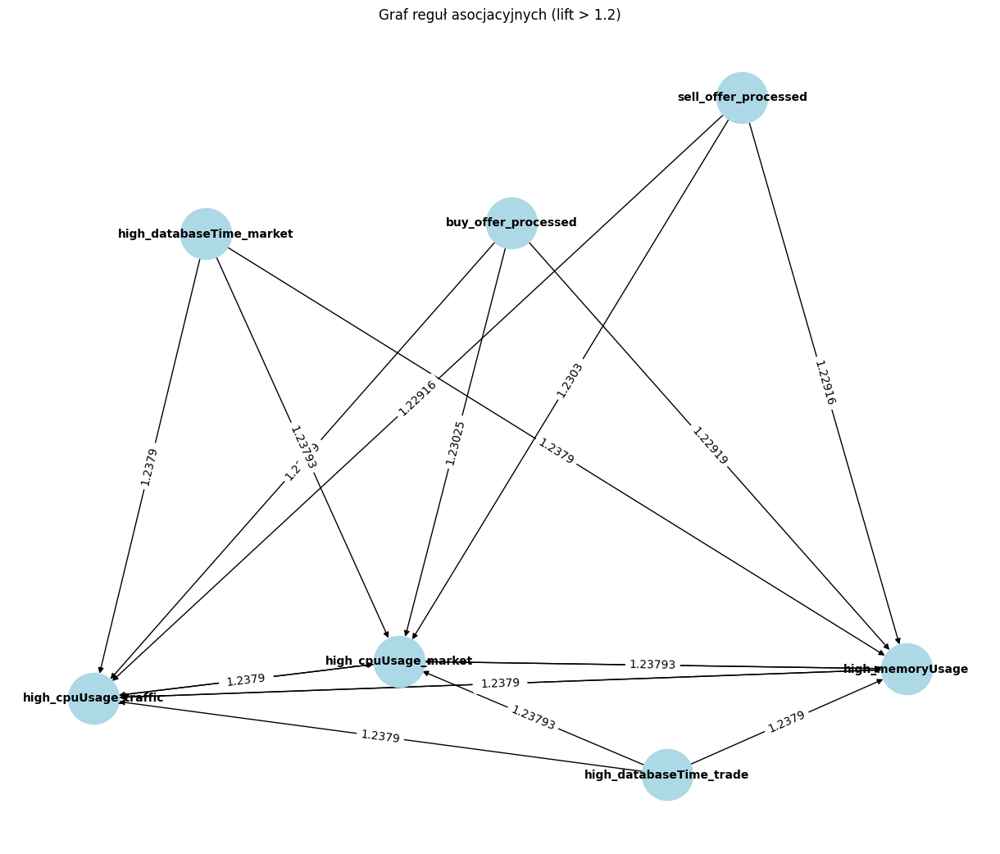

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\10 1 200 500 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 3100.439631033115
R² score: 0.9951712090136556


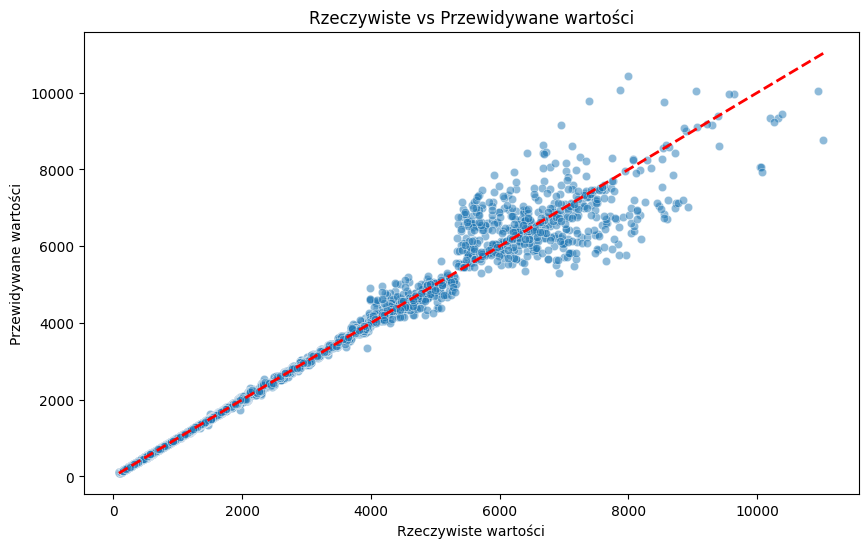

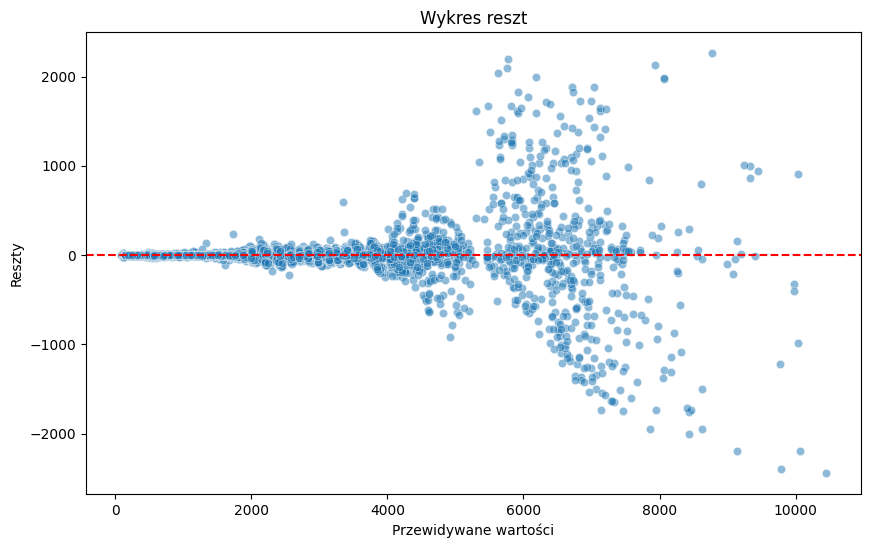

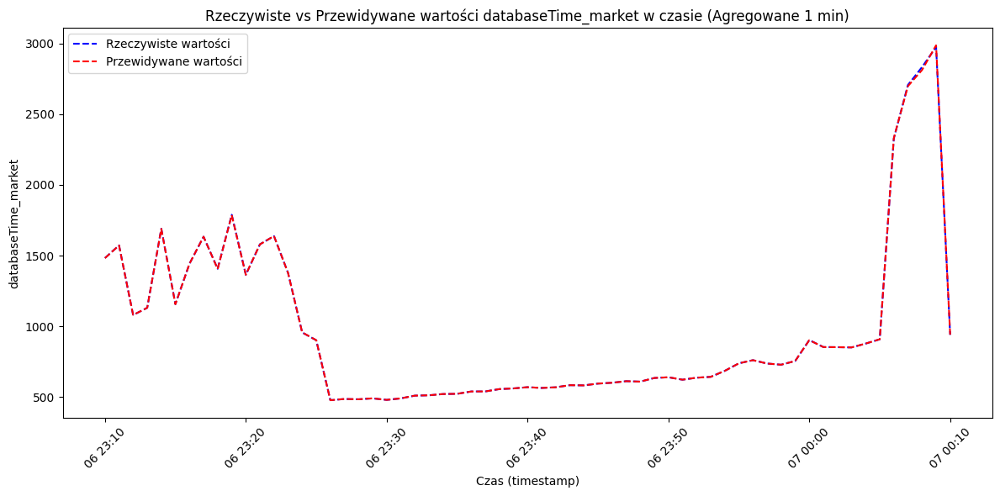

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\10 1 200 500 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.03892410820819301
R² score: 0.9995101341734983


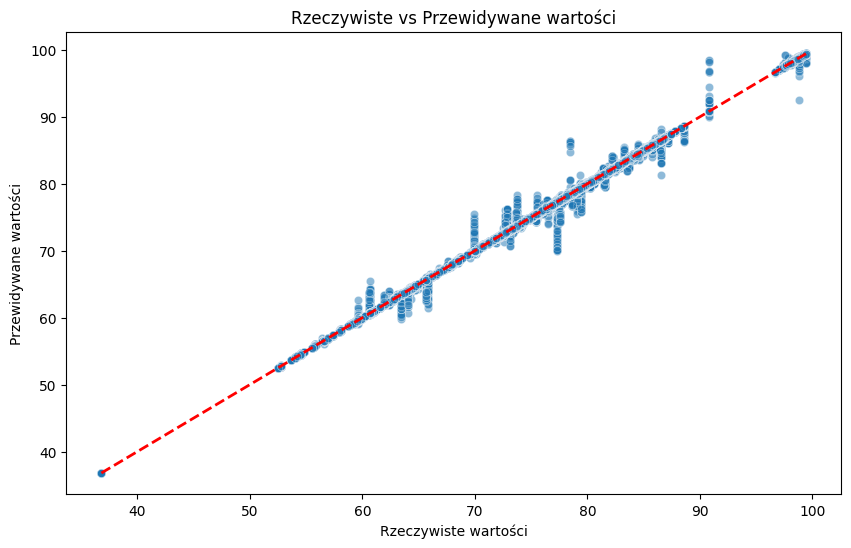

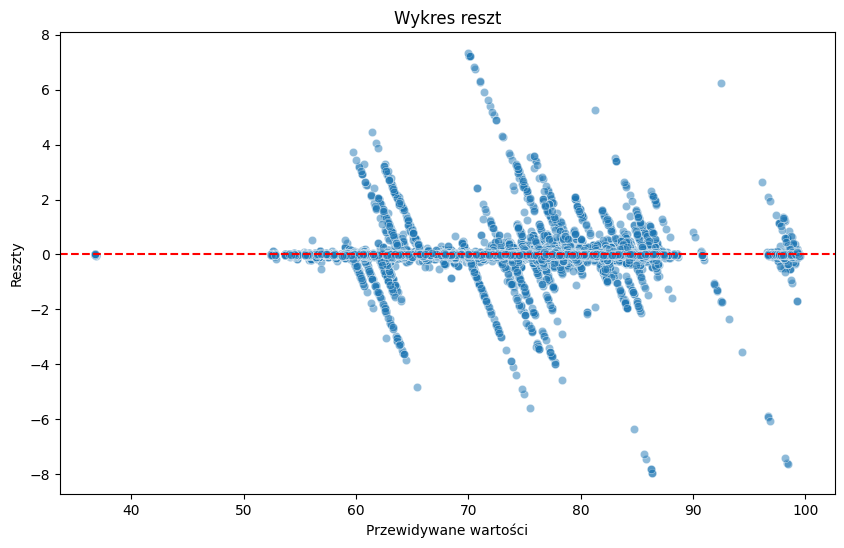

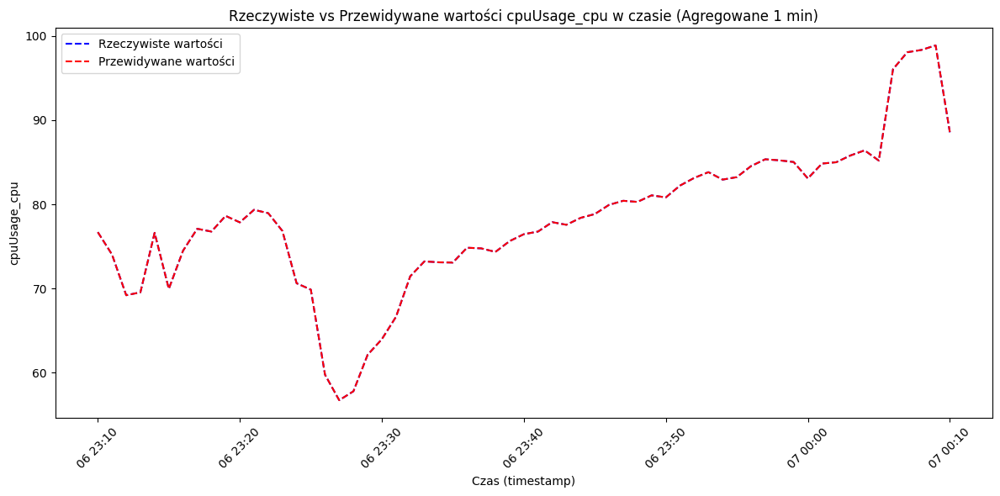

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv


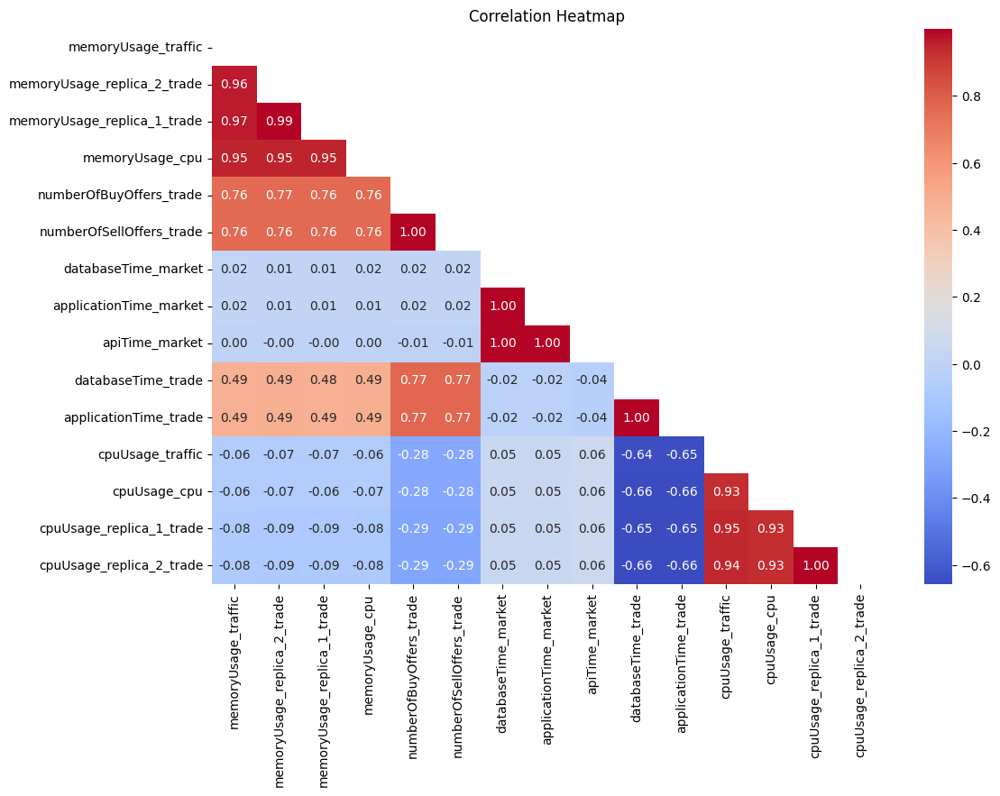

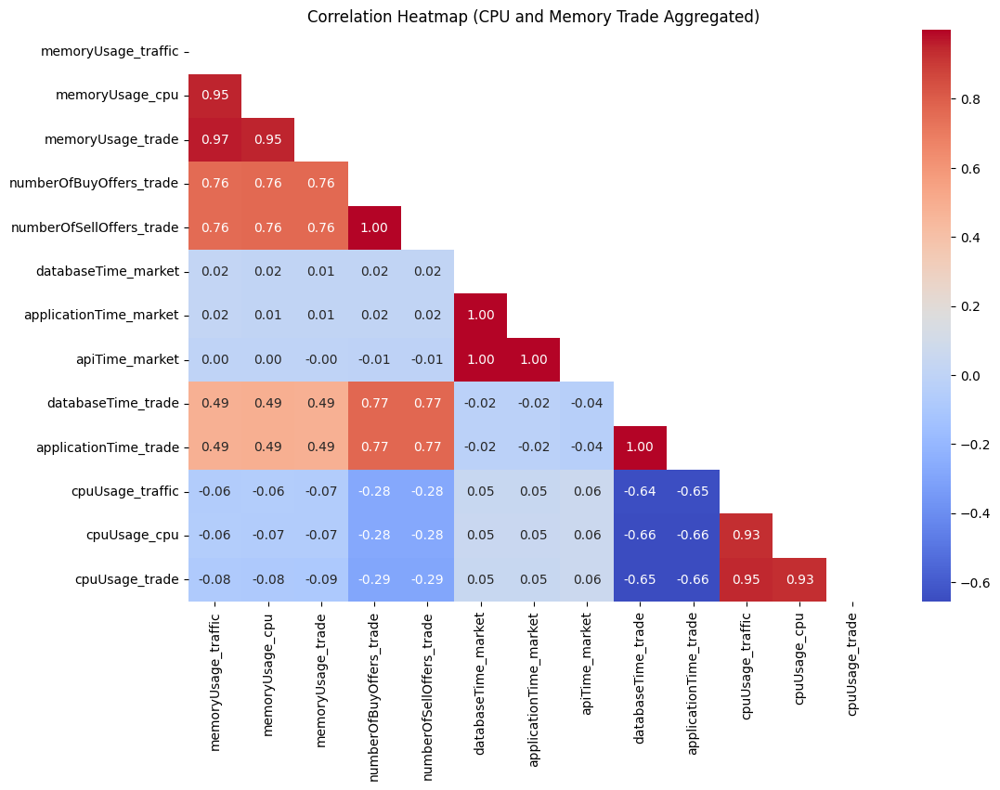

,antecedents,consequents,support,confidence,lift


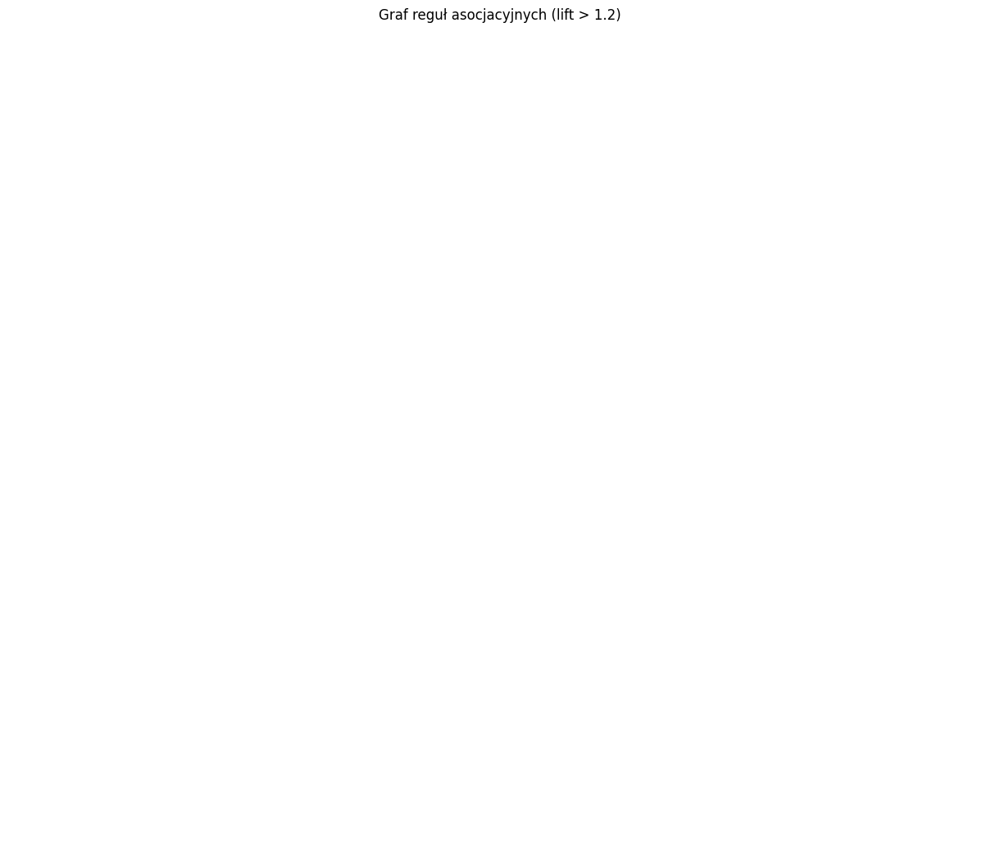

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\2 5 200 500 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 20.60725049703109
R² score: 0.9997581620518465


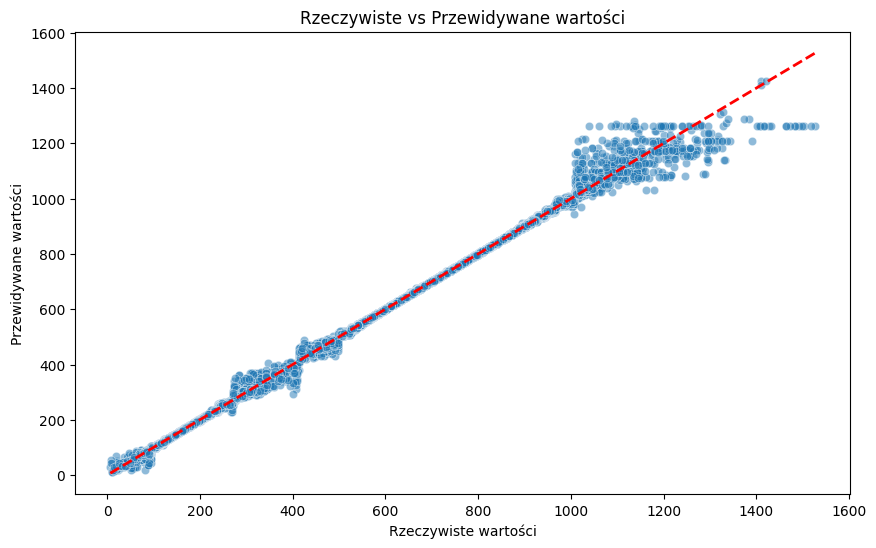

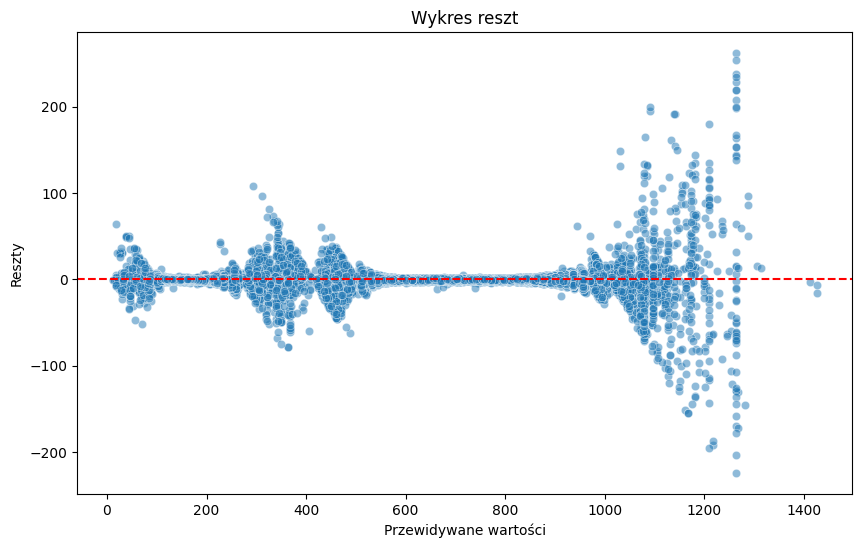

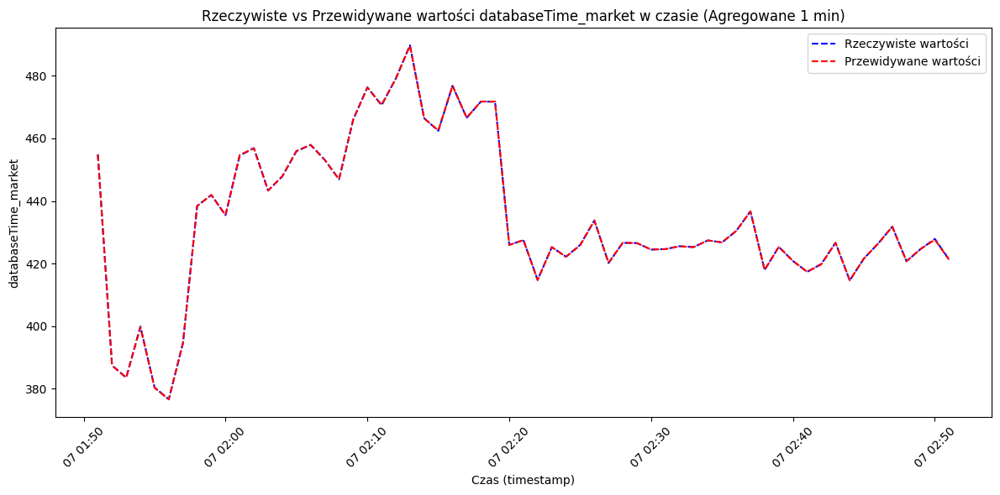

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\2 5 200 500 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.03029566907629253
R² score: 0.9980509957887619


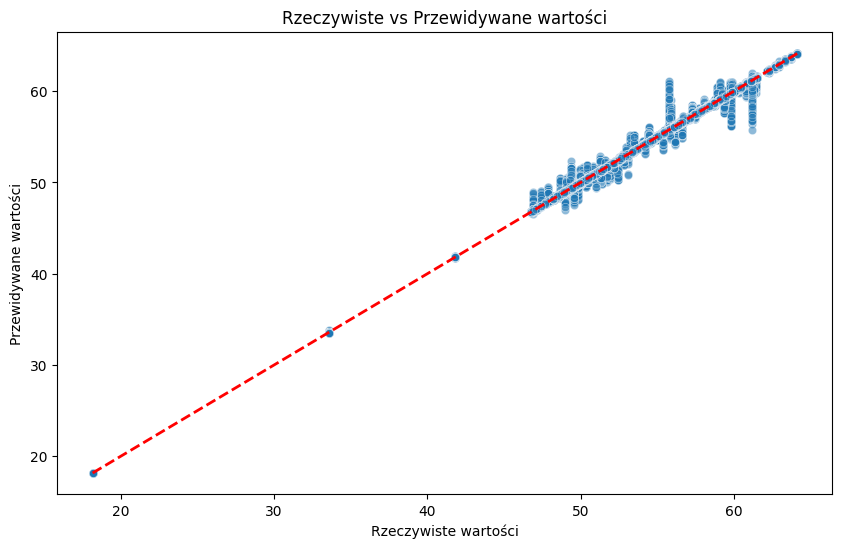

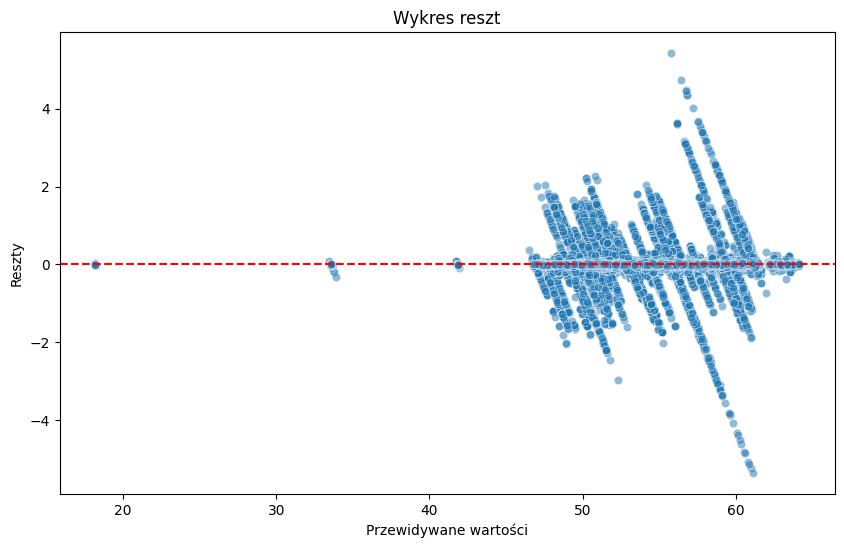

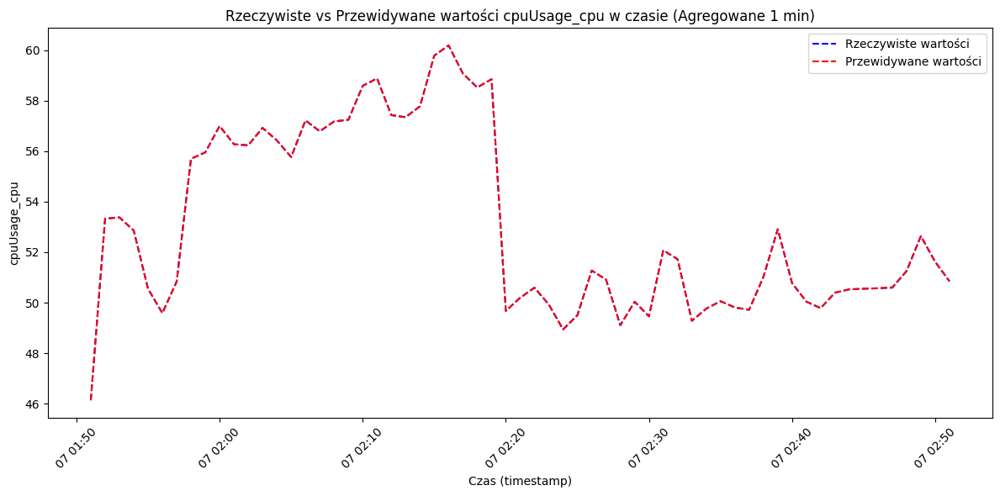

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 5 zapisane w pliku: trade_replica5_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv


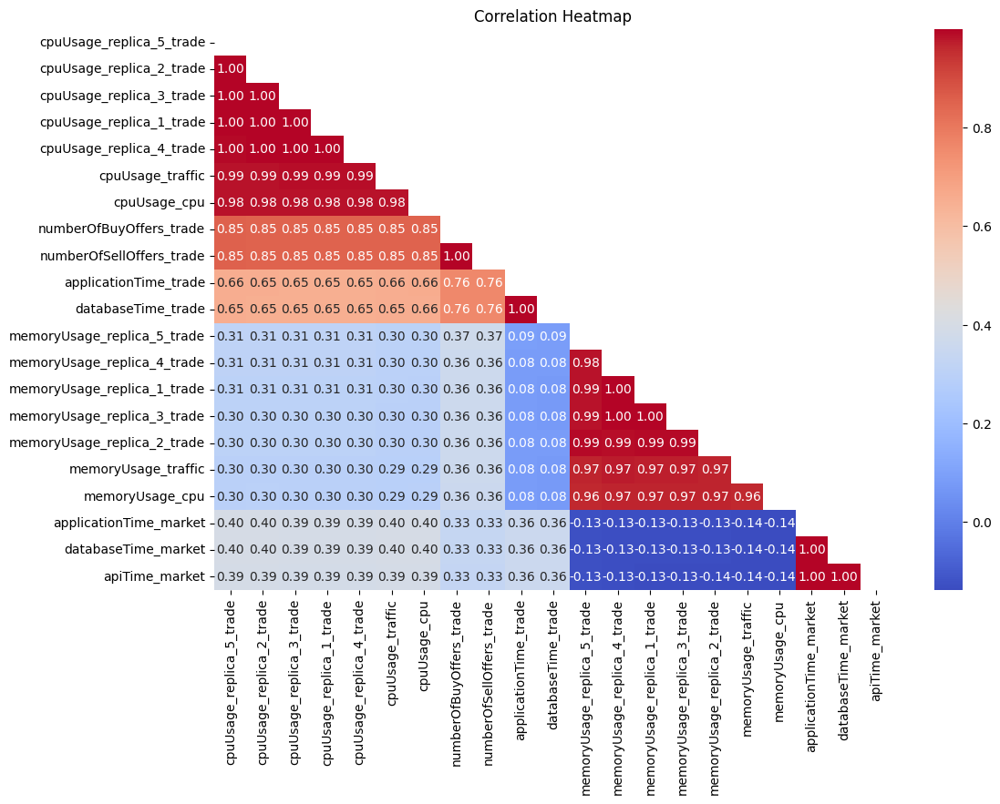

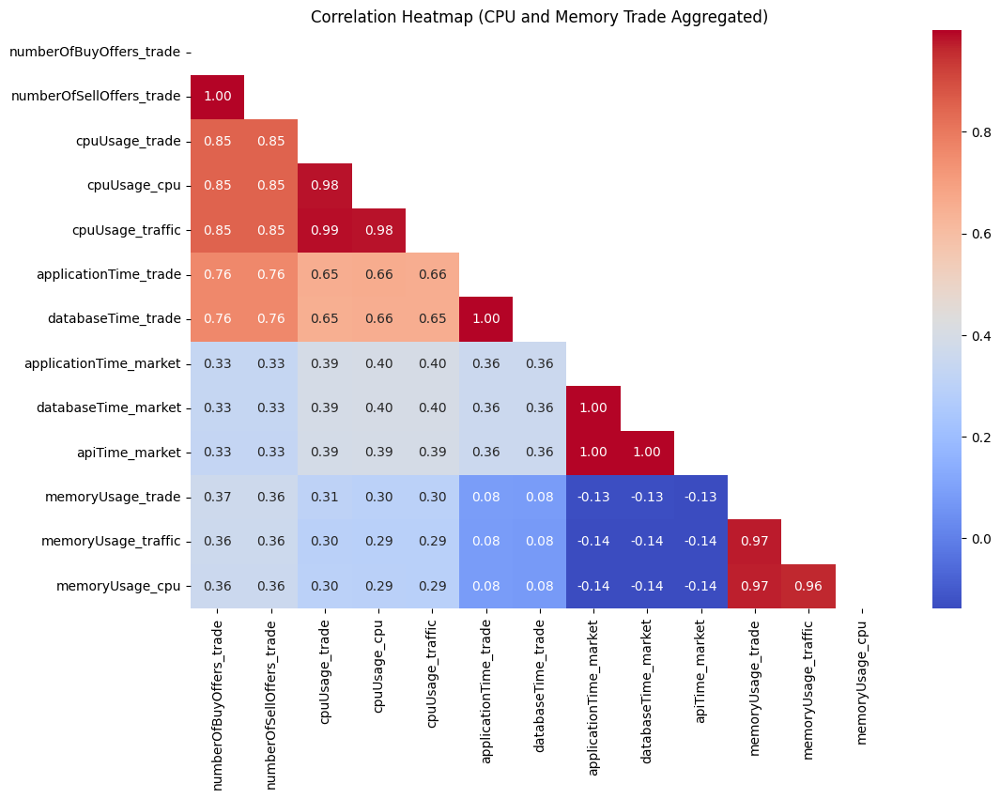

,antecedents,consequents,support,confidence,lift
5,high_databaseTime_trade,high_cpuUsage_market,0.47156,0.96318,1.30065
6,high_cpuUsage_traffic,high_cpuUsage_market,0.72493,0.97589,1.31782
7,high_cpuUsage_market,high_cpuUsage_traffic,0.72493,0.97893,1.31782
13,high_databaseTime_trade,high_cpuUsage_traffic,0.47258,0.96526,1.29941
17,"high_memoryUsage, high_databaseTime_trade",high_cpuUsage_market,0.46290,0.96539,1.30364
19,high_databaseTime_trade,"high_memoryUsage, high_cpuUsage_market",0.46290,0.94549,1.29188
20,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.71627,0.97561,1.31744
21,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.71627,0.97868,1.31748
24,high_cpuUsage_traffic,"high_memoryUsage, high_cpuUsage_market",0.71627,0.96423,1.31748
25,high_cpuUsage_market,"high_memoryUsage, high_cpuUsage_traffic",0.71627,0.96723,1.31744


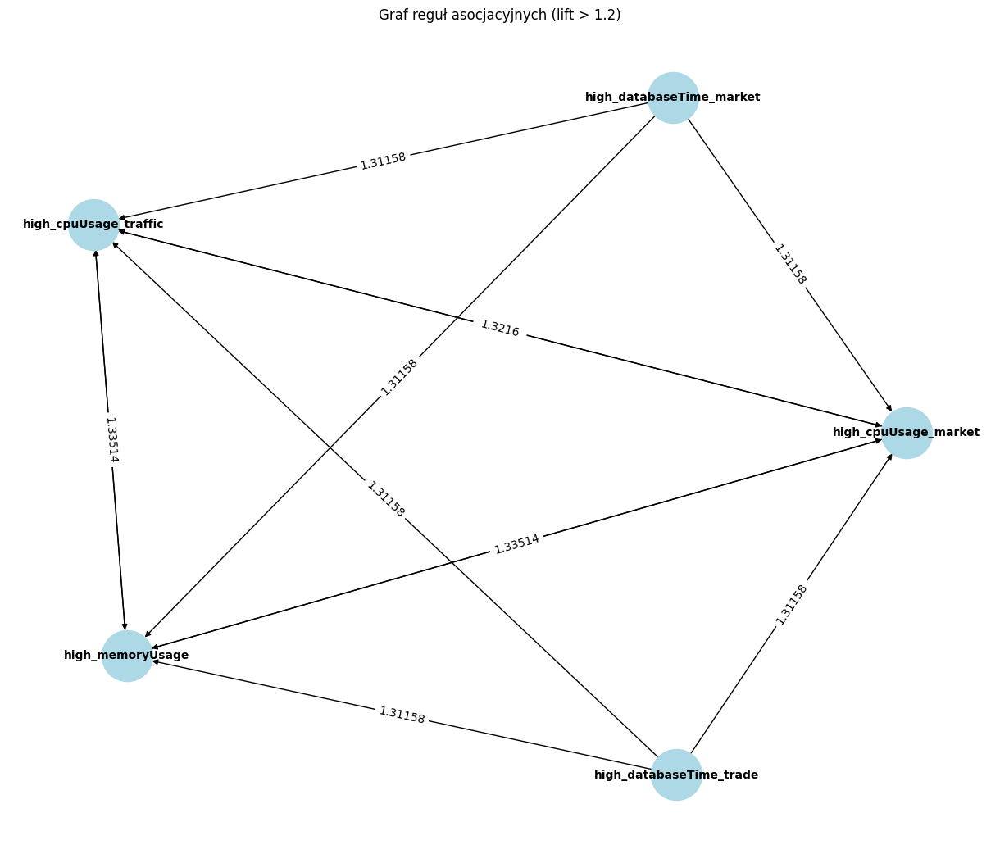

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\5 2 200 500 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 213.01311232597877
R² score: 0.9994984511493694


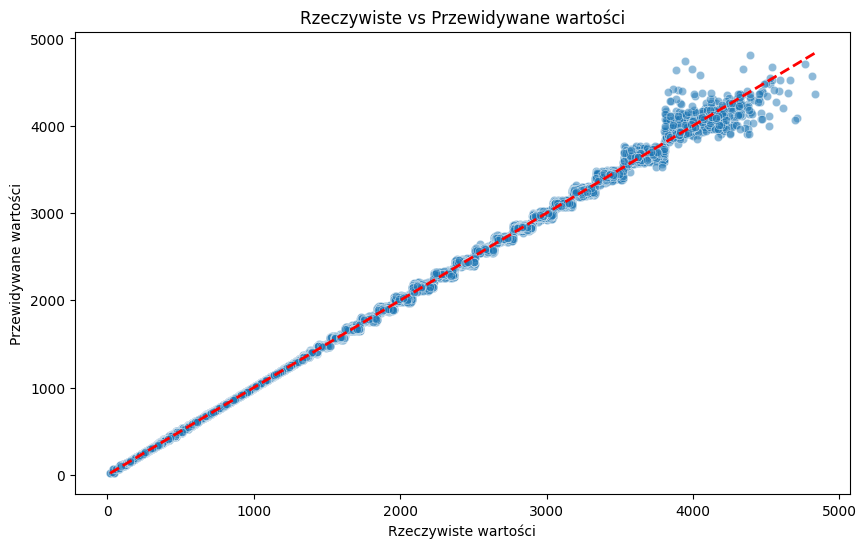

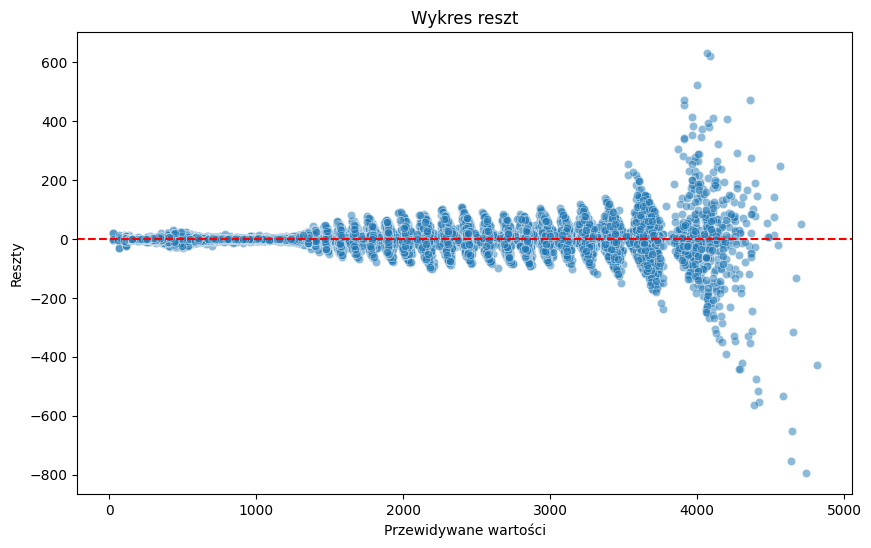

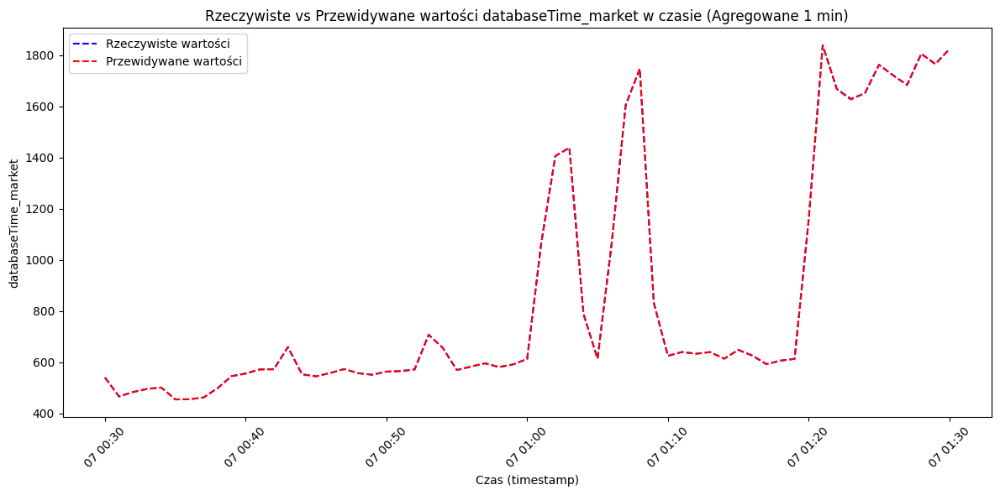

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test1\5 2 200 500 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.0900799863391397
R² score: 0.9993420690742328


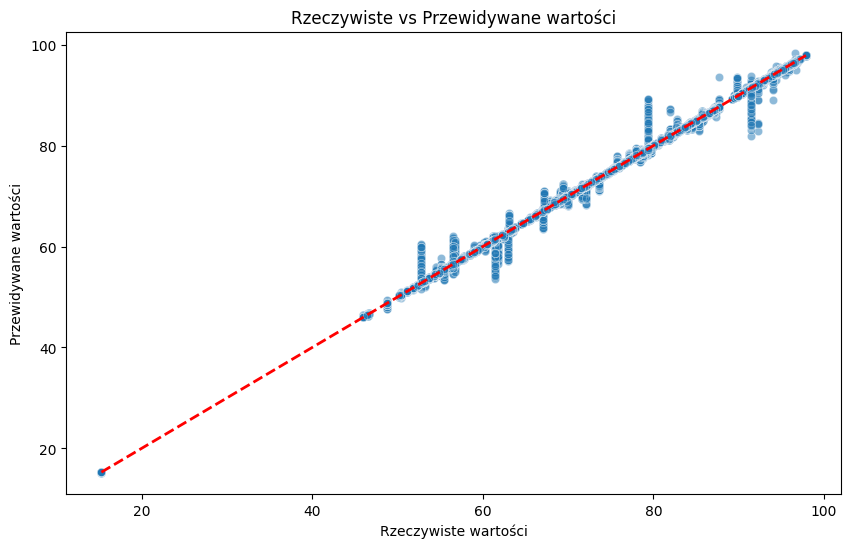

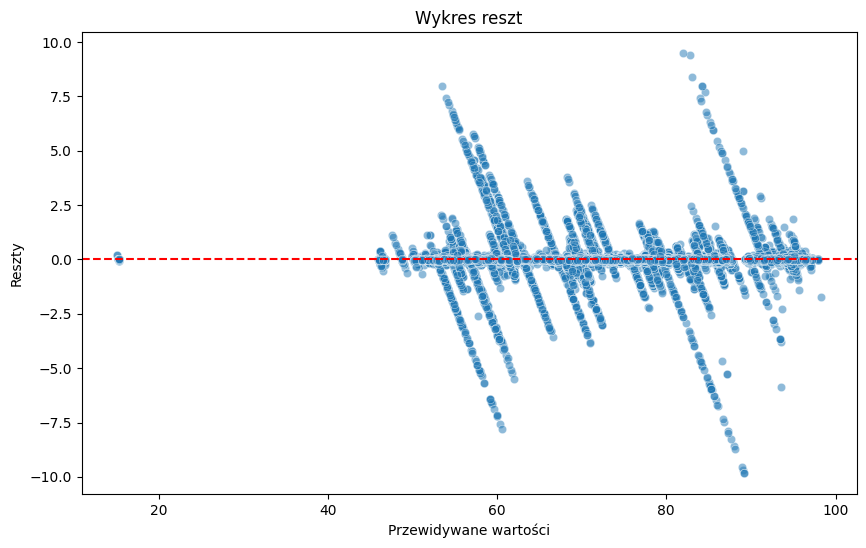

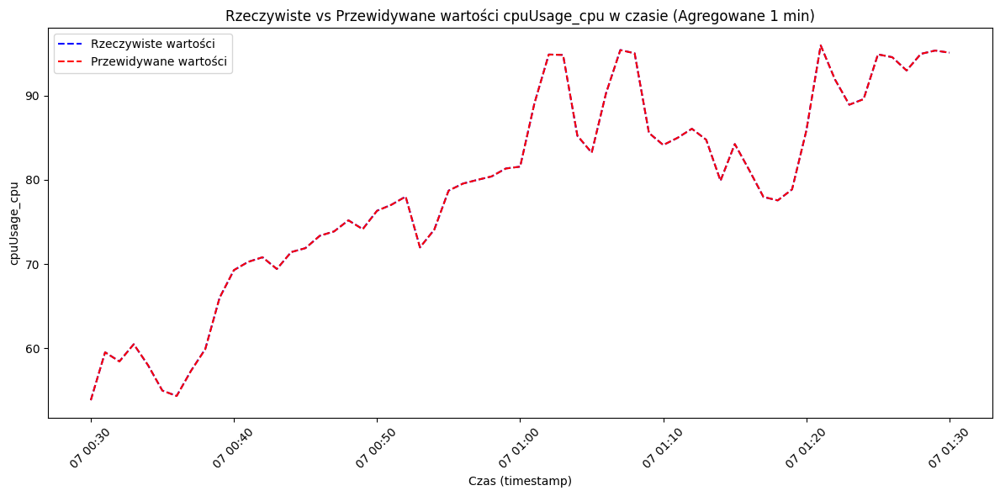

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv


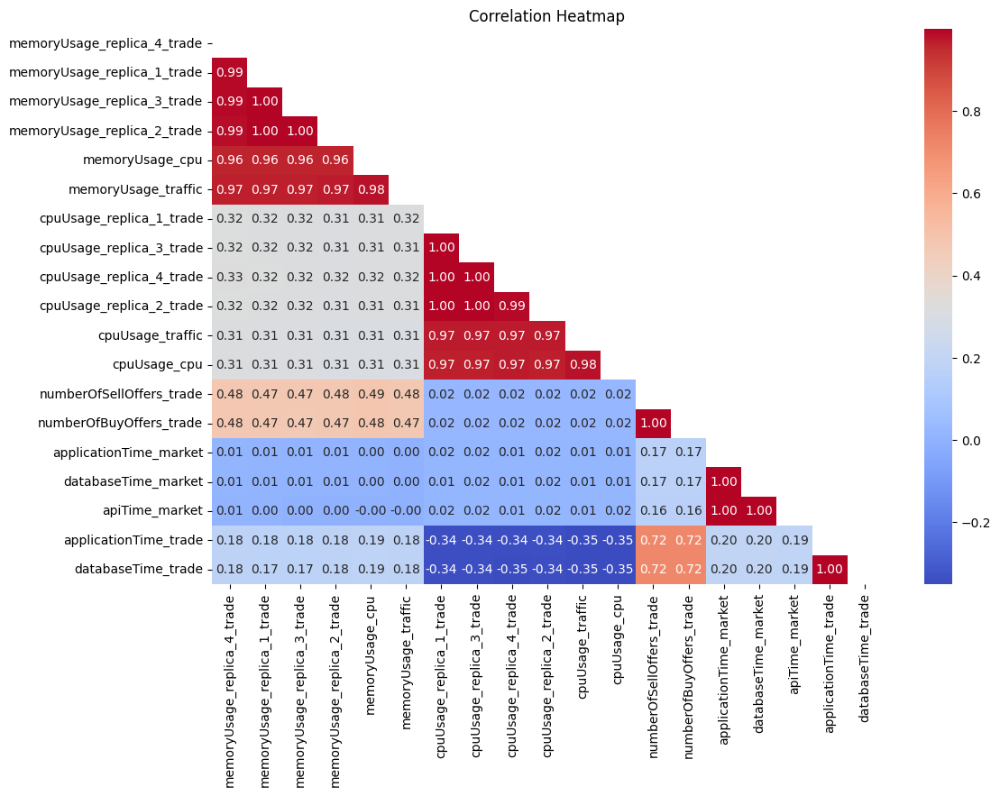

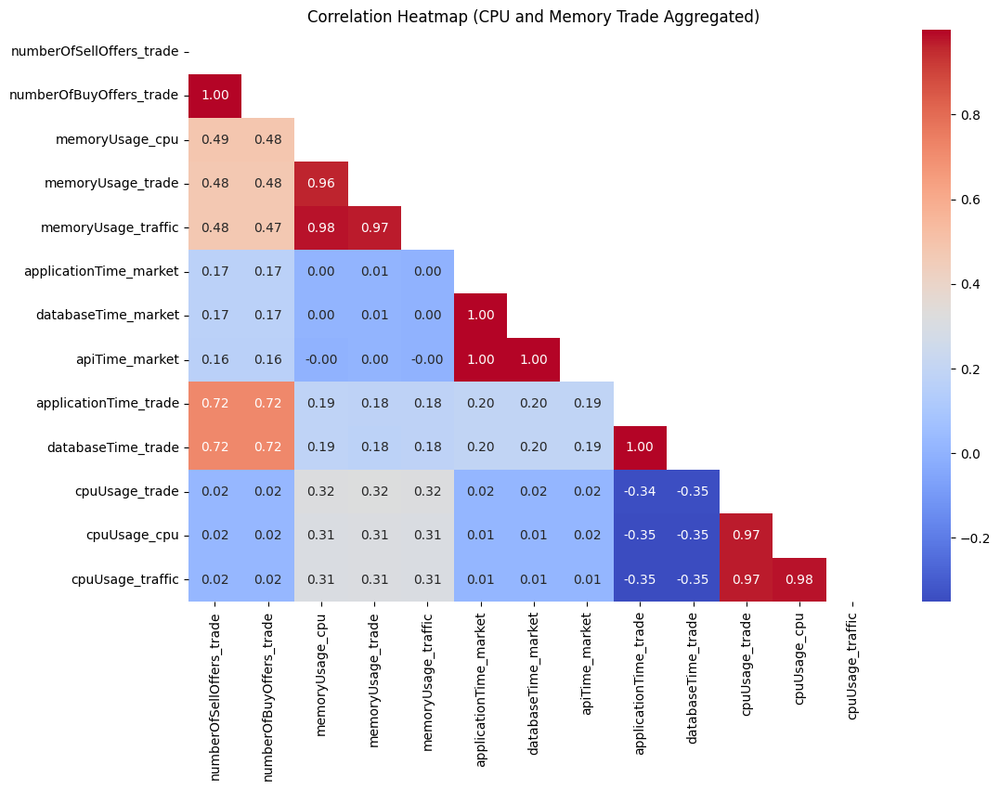

,antecedents,consequents,support,confidence,lift
0,high_cpuUsage_traffic,high_cpuUsage_market,0.21918,0.97408,4.25092
1,high_cpuUsage_market,high_cpuUsage_traffic,0.21918,0.95651,4.25092
2,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.12155,0.98100,4.28112
3,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.12155,0.95949,4.26418
4,"high_databaseTime_market, high_cpuUsage_traffic",high_cpuUsage_market,0.11685,0.97697,4.26352
5,"high_databaseTime_market, high_cpuUsage_market",high_cpuUsage_traffic,0.11685,0.96091,4.27046


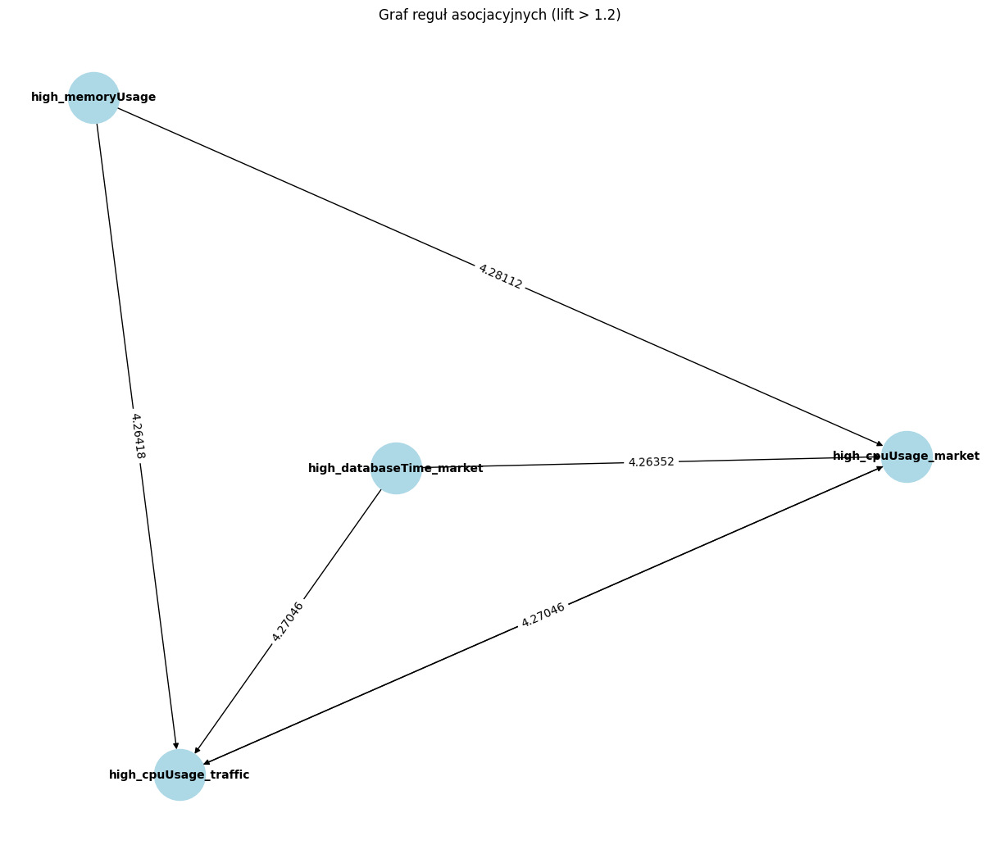

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 16 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 64.79017977491658
R² score: 0.9996801590043309


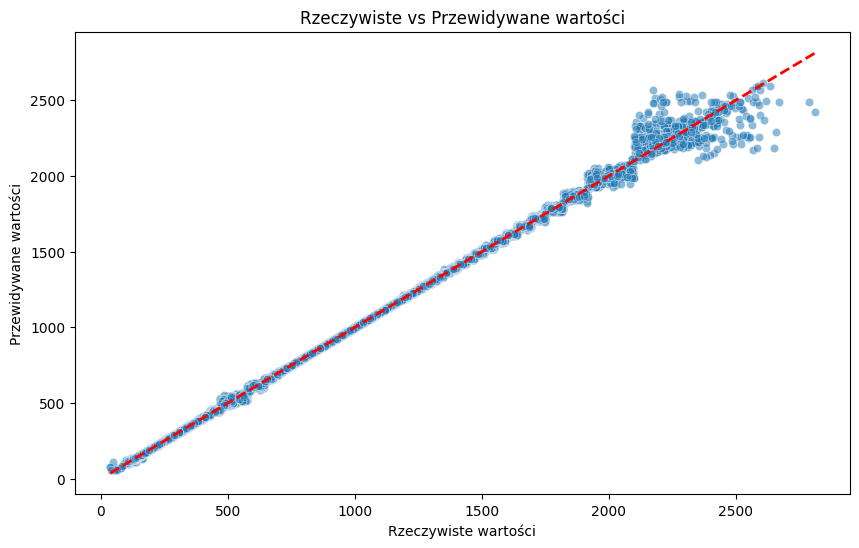

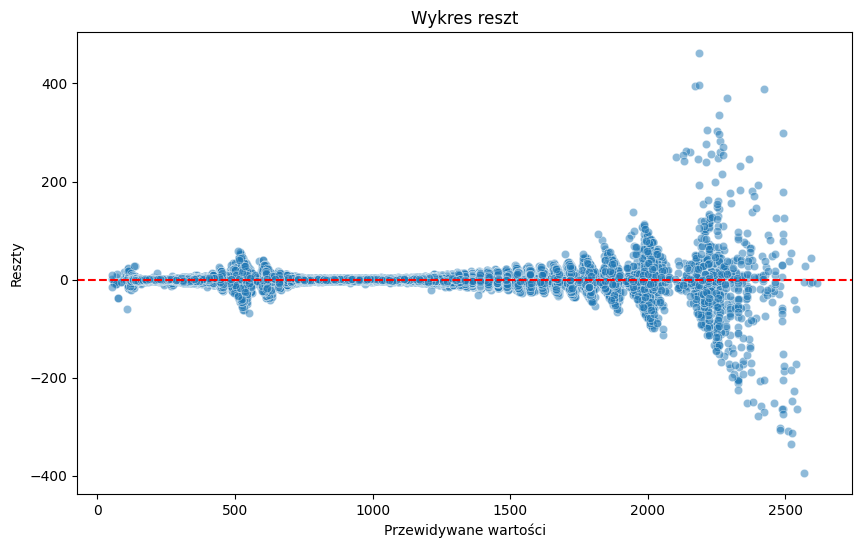

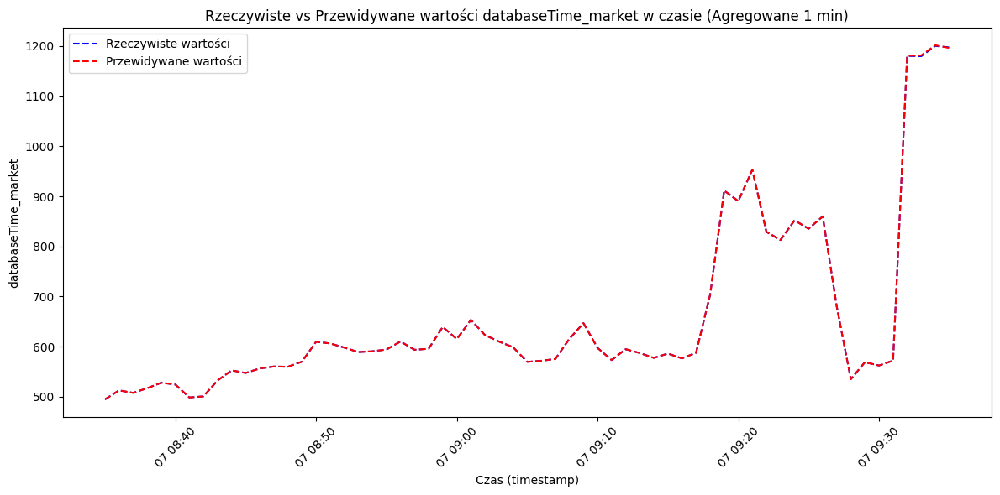

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 16 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.09817671481960684
R² score: 0.9988173376225408


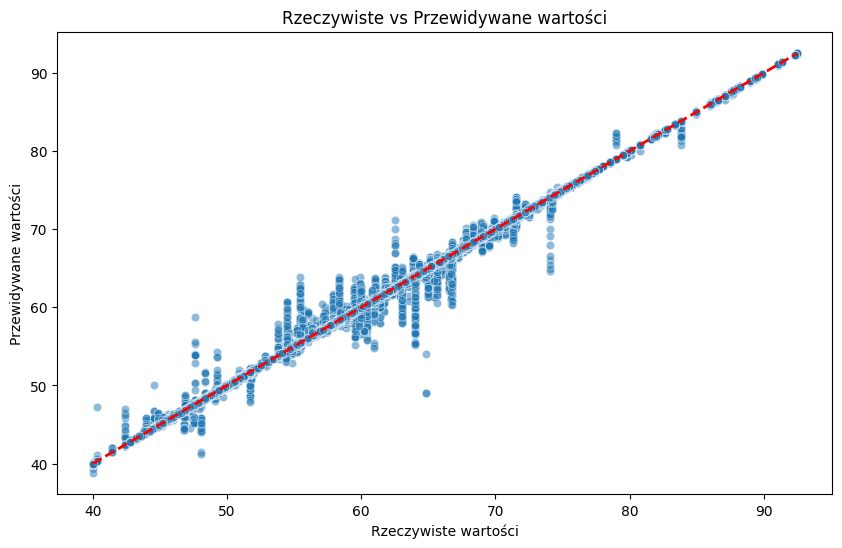

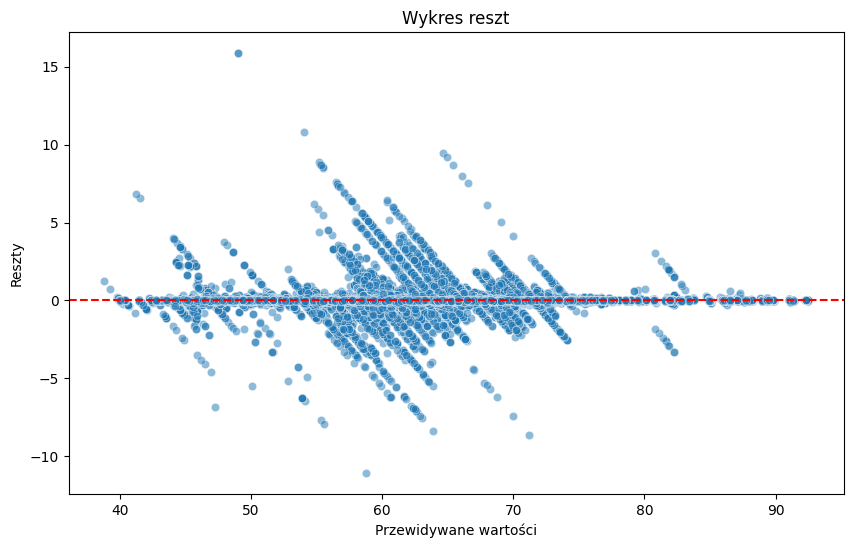

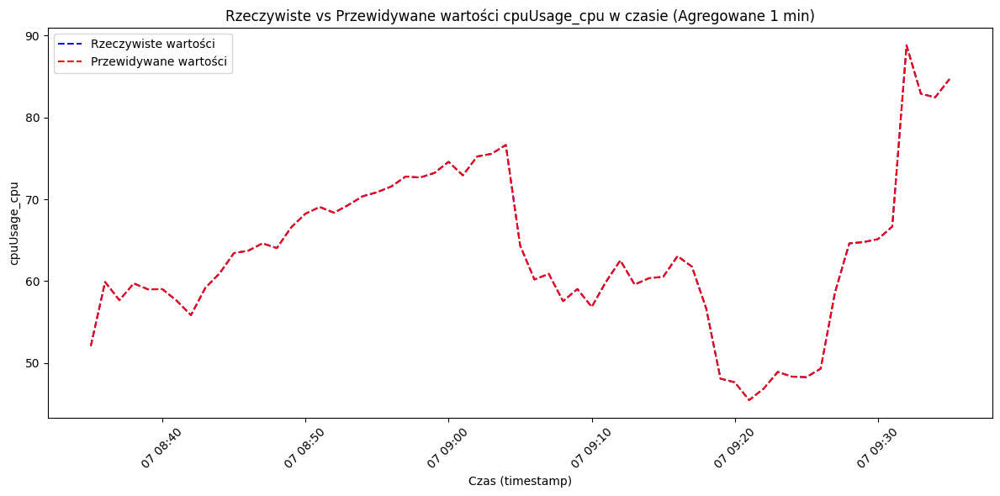

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv


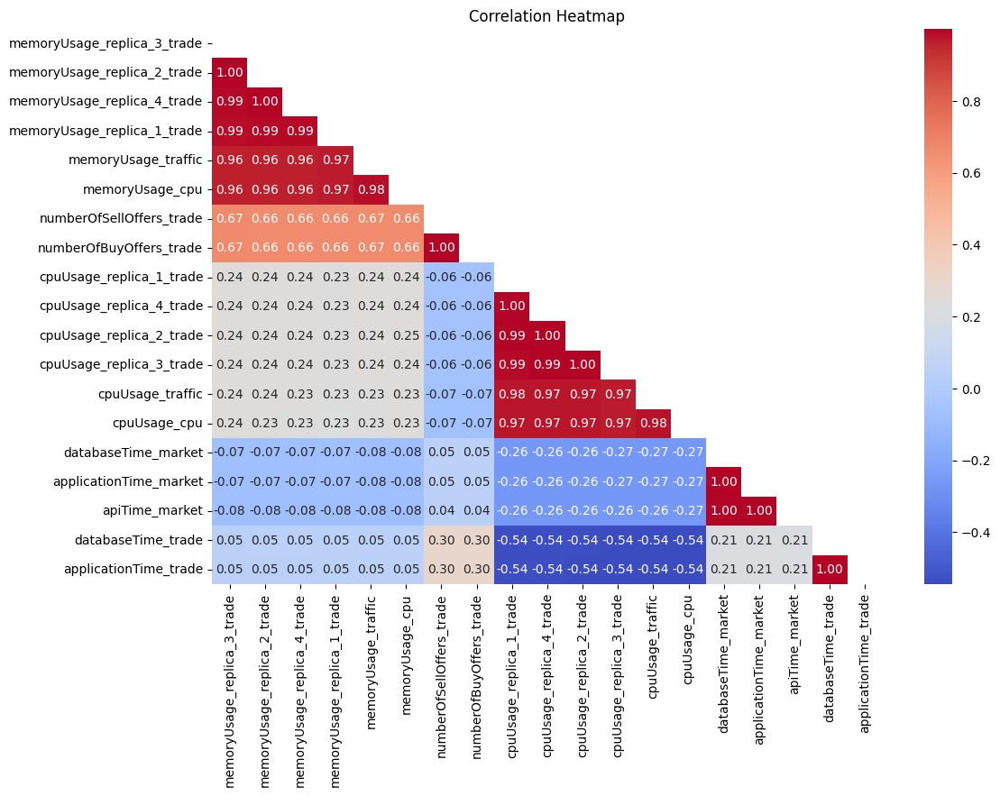

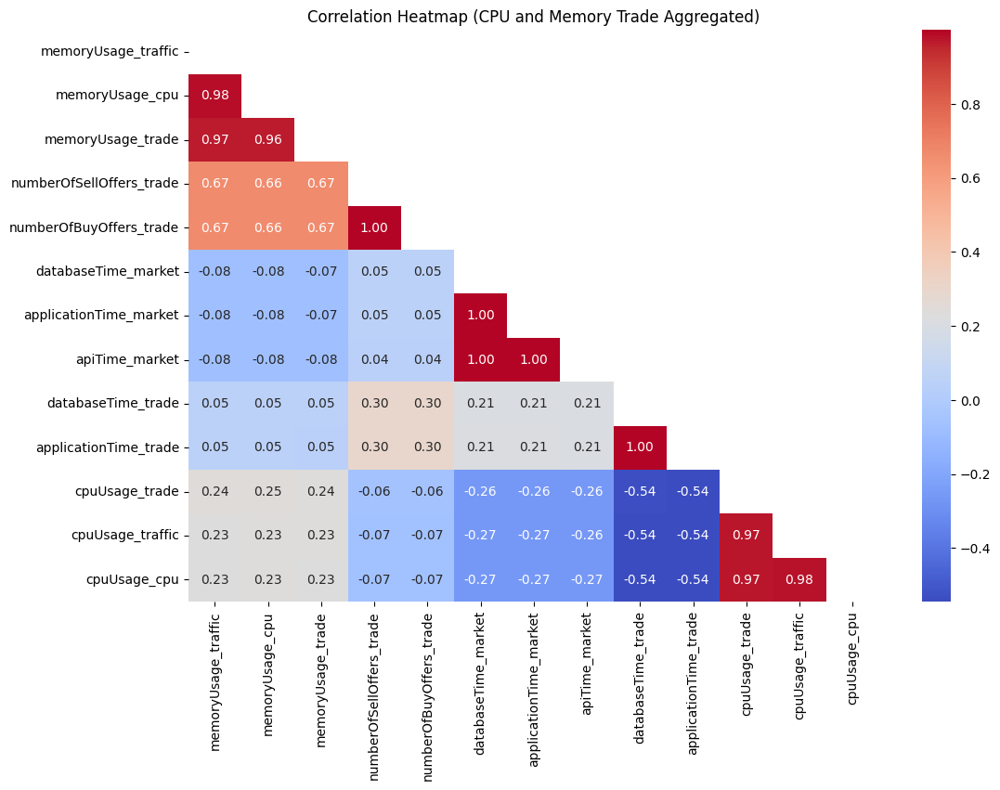

,antecedents,consequents,support,confidence,lift


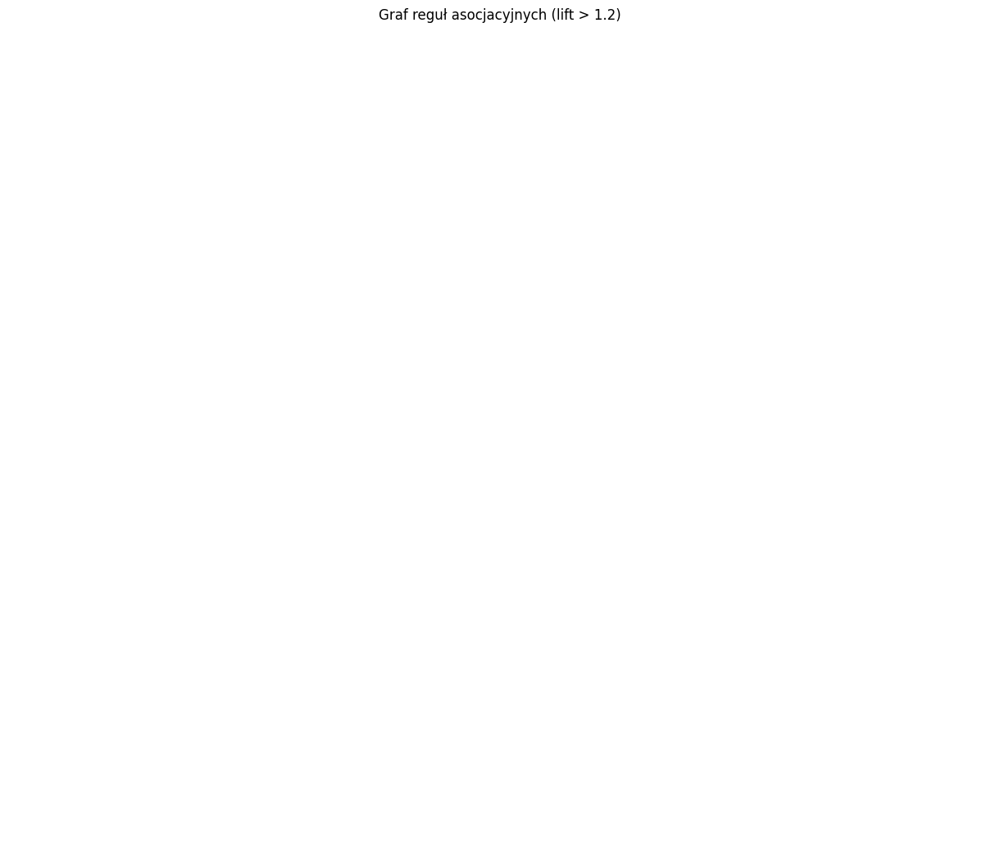

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 2 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 20.879445207564185
R² score: 0.9998574105744112


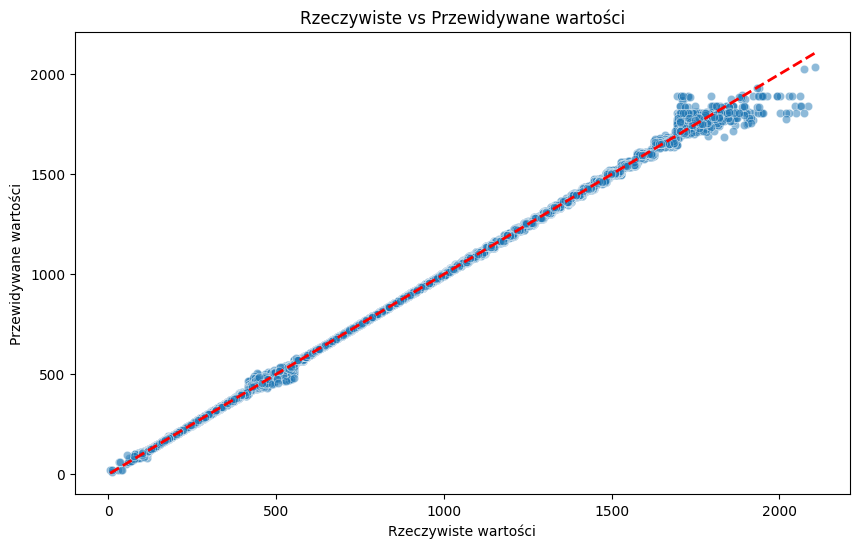

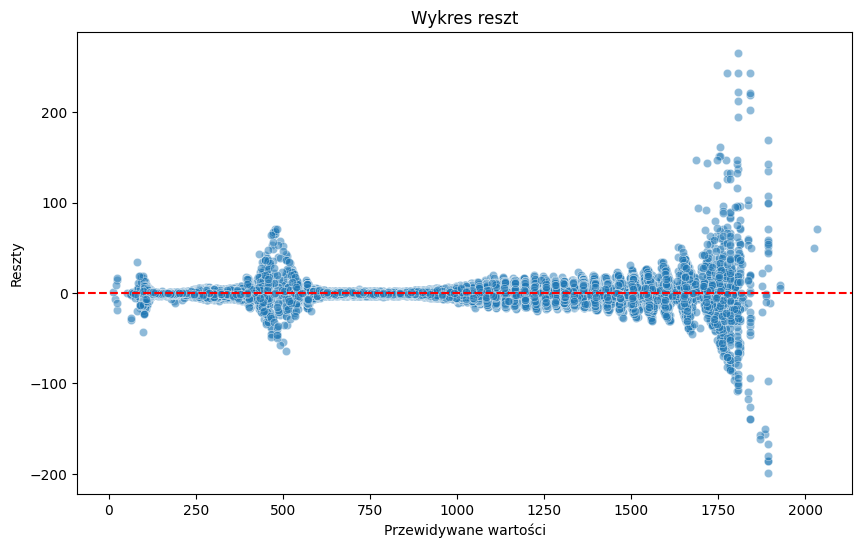

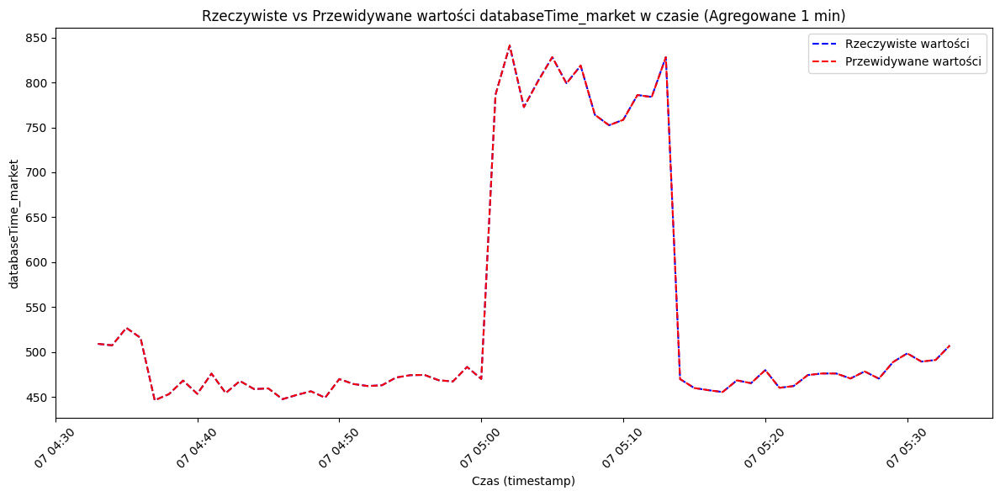

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 2 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.02207488959688738
R² score: 0.9993609087172625


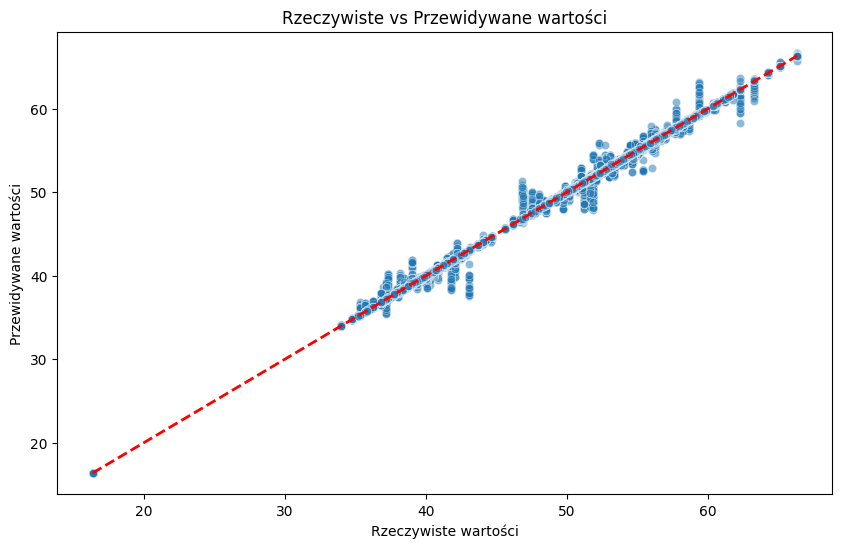

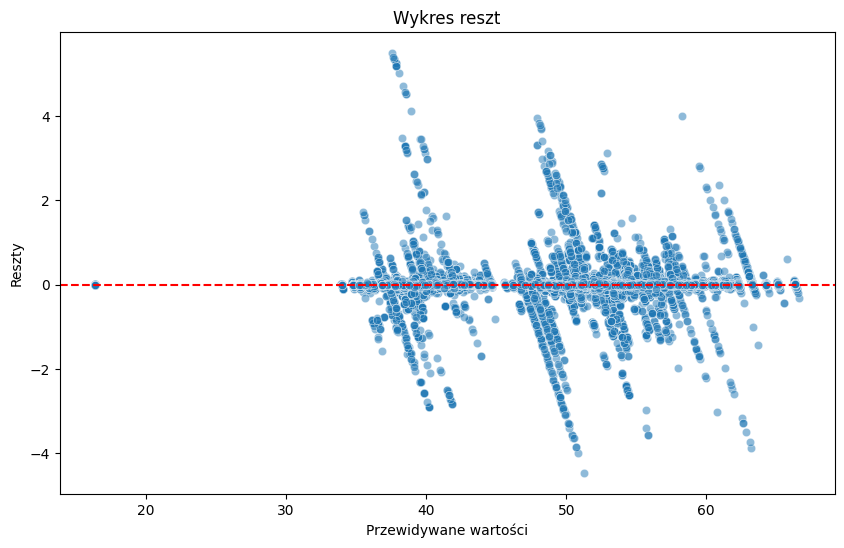

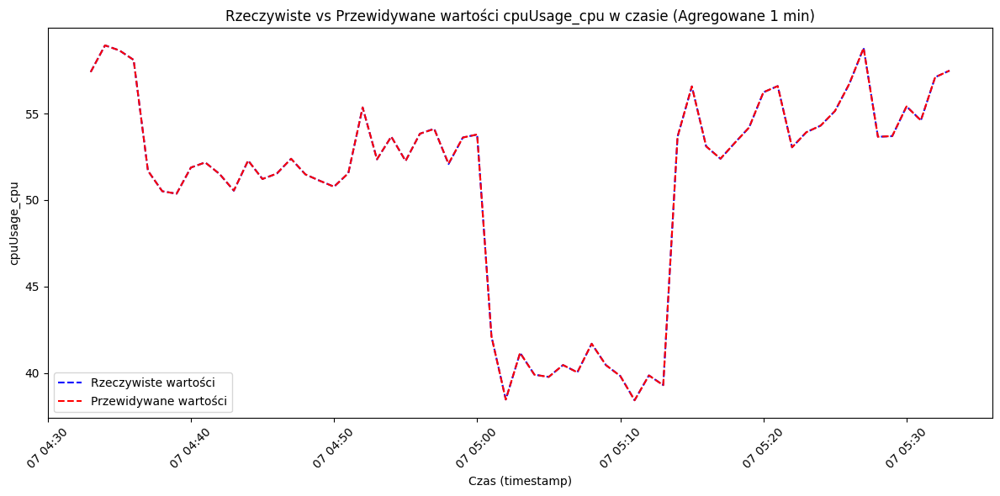

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv


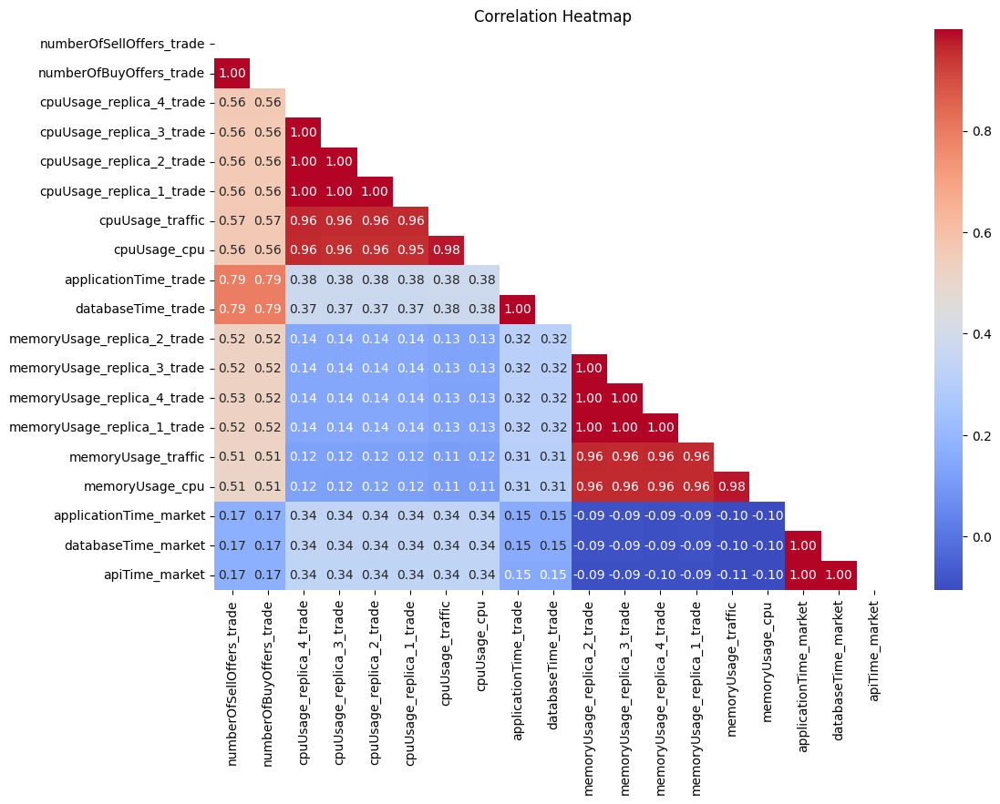

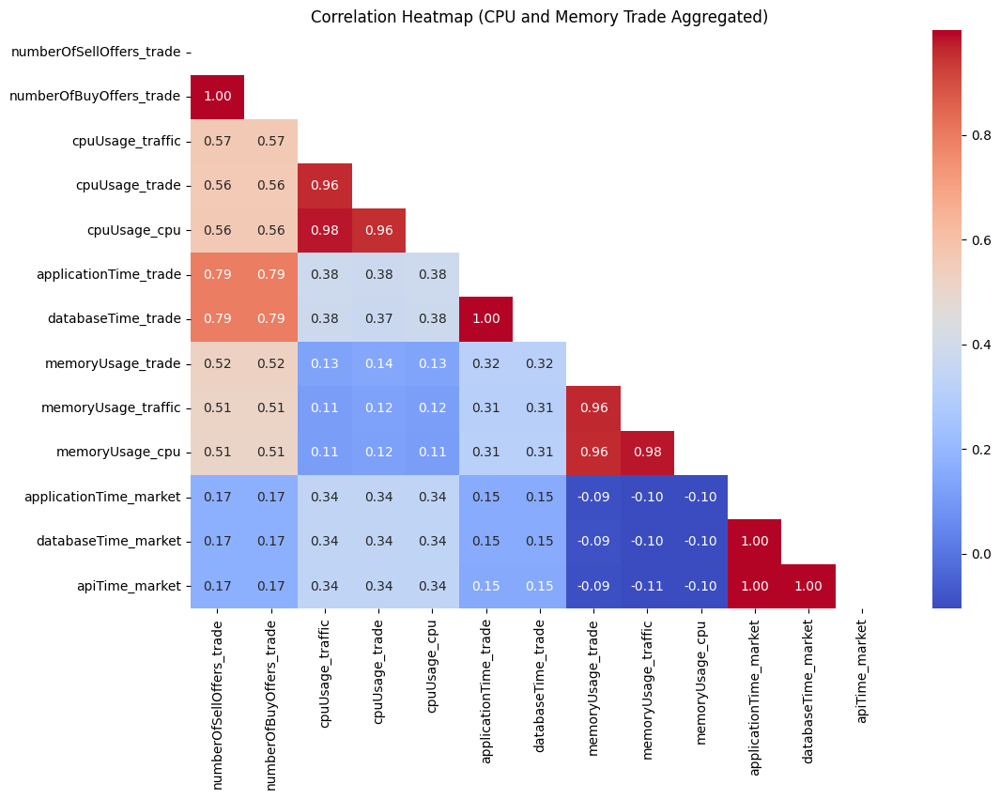

,antecedents,consequents,support,confidence,lift
0,high_cpuUsage_traffic,high_cpuUsage_market,0.41626,0.96933,2.27193
1,high_cpuUsage_market,high_cpuUsage_traffic,0.41626,0.97565,2.27193
2,high_memoryUsage,high_databaseTime_trade,0.35306,0.73916,1.48169
3,high_databaseTime_trade,high_memoryUsage,0.35306,0.70772,1.48169
4,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.19270,0.96740,2.26741
5,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.19270,0.96716,2.25216
6,"high_databaseTime_market, high_cpuUsage_traffic",high_cpuUsage_market,0.22576,0.97303,2.28061
7,"high_databaseTime_market, high_cpuUsage_market",high_cpuUsage_traffic,0.22576,0.97876,2.27918
8,"high_databaseTime_trade, high_cpuUsage_traffic",high_cpuUsage_market,0.20539,0.96076,2.25185
9,"high_databaseTime_trade, high_cpuUsage_market",high_cpuUsage_traffic,0.20539,0.96772,2.25348


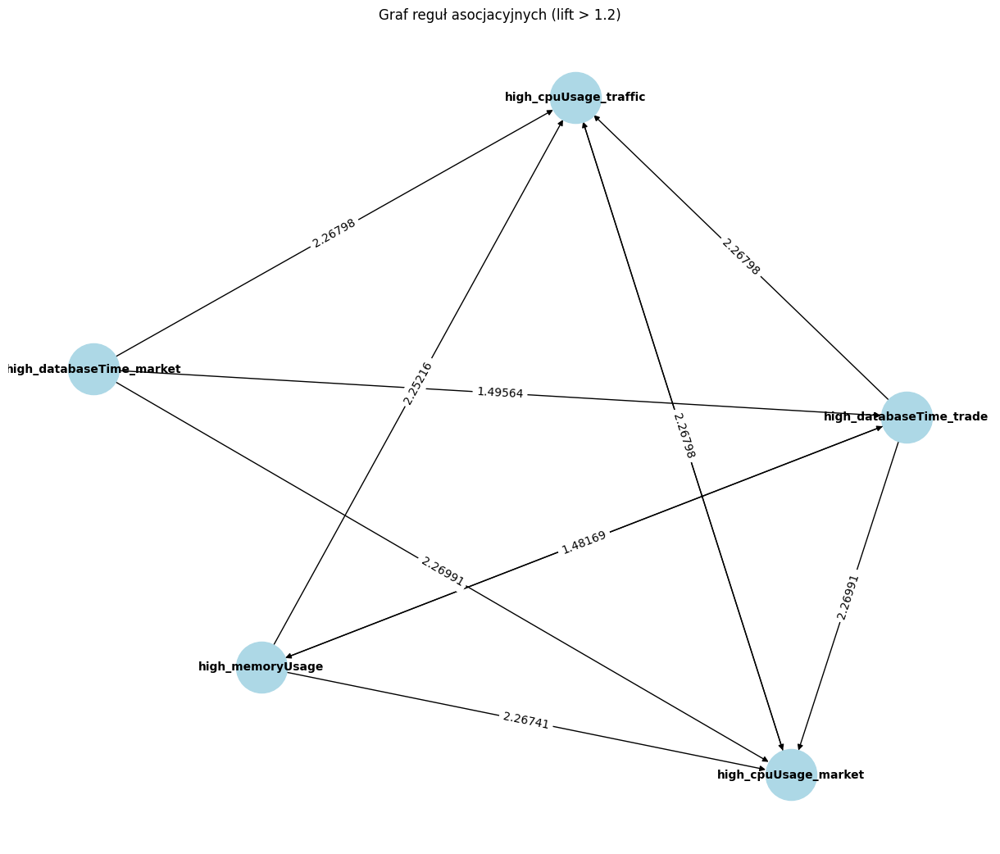

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 79.03757020948618
R² score: 0.9996477773839082


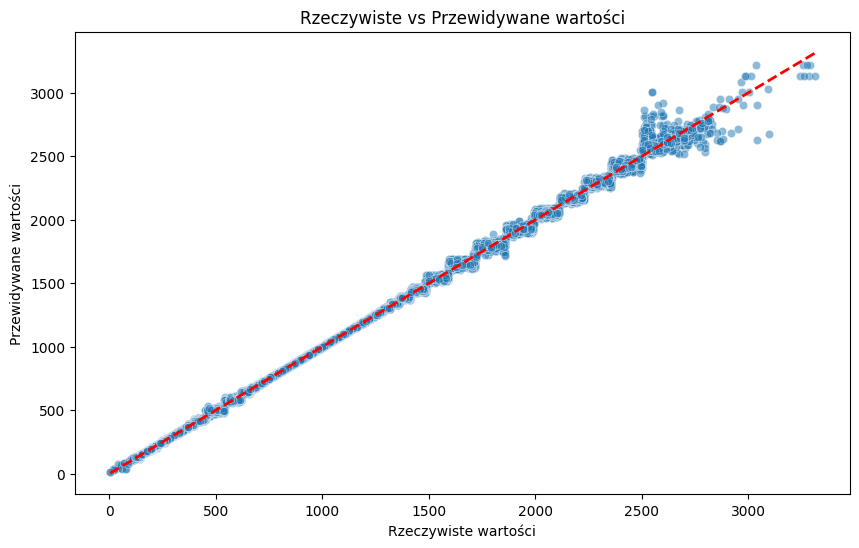

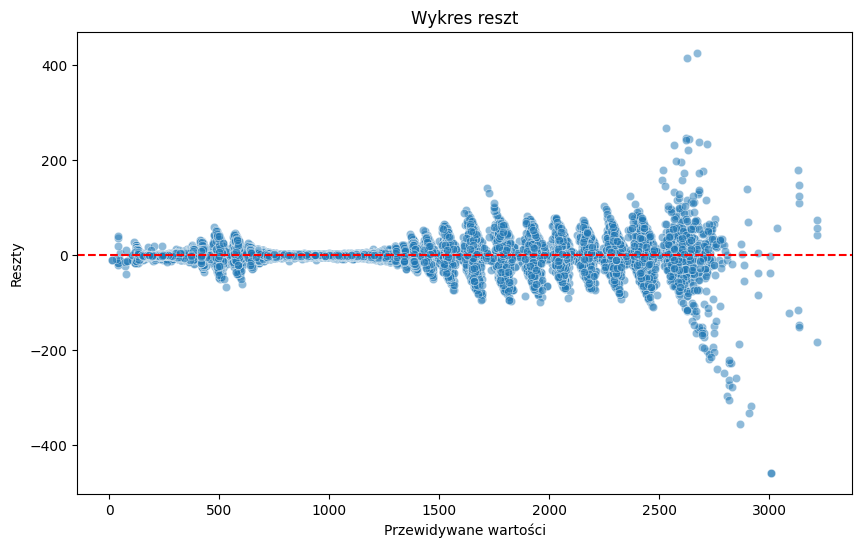

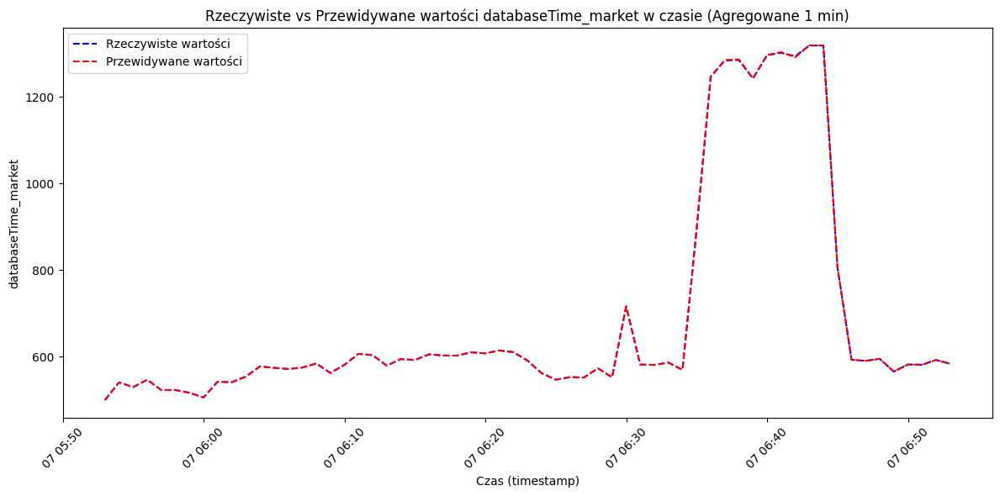

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.04194018894895708
R² score: 0.9993403173445958


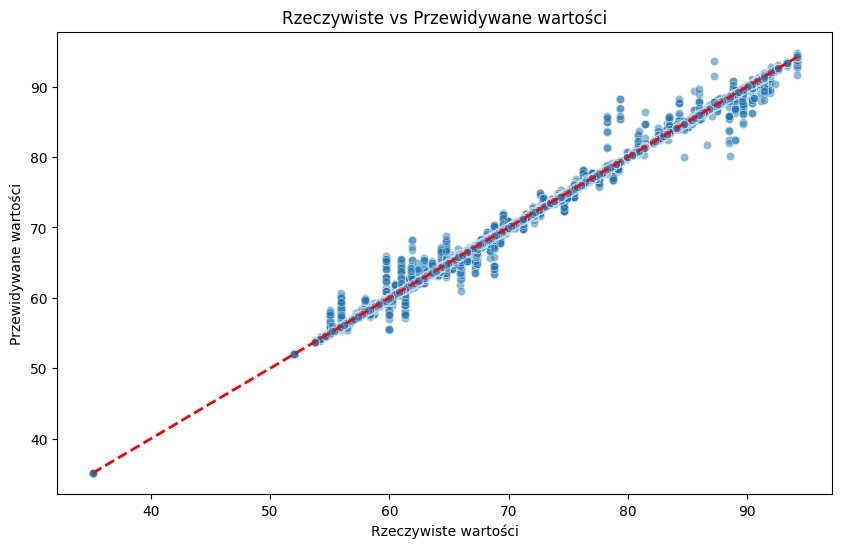

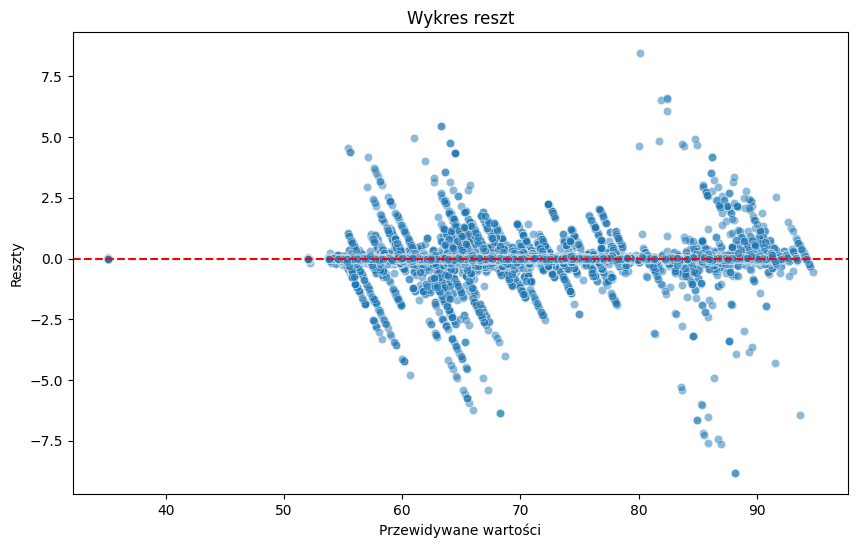

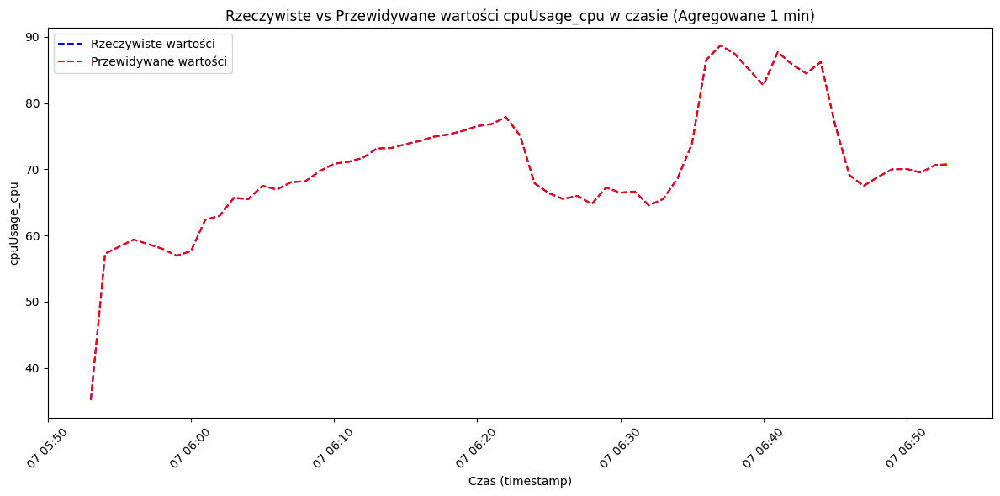

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv


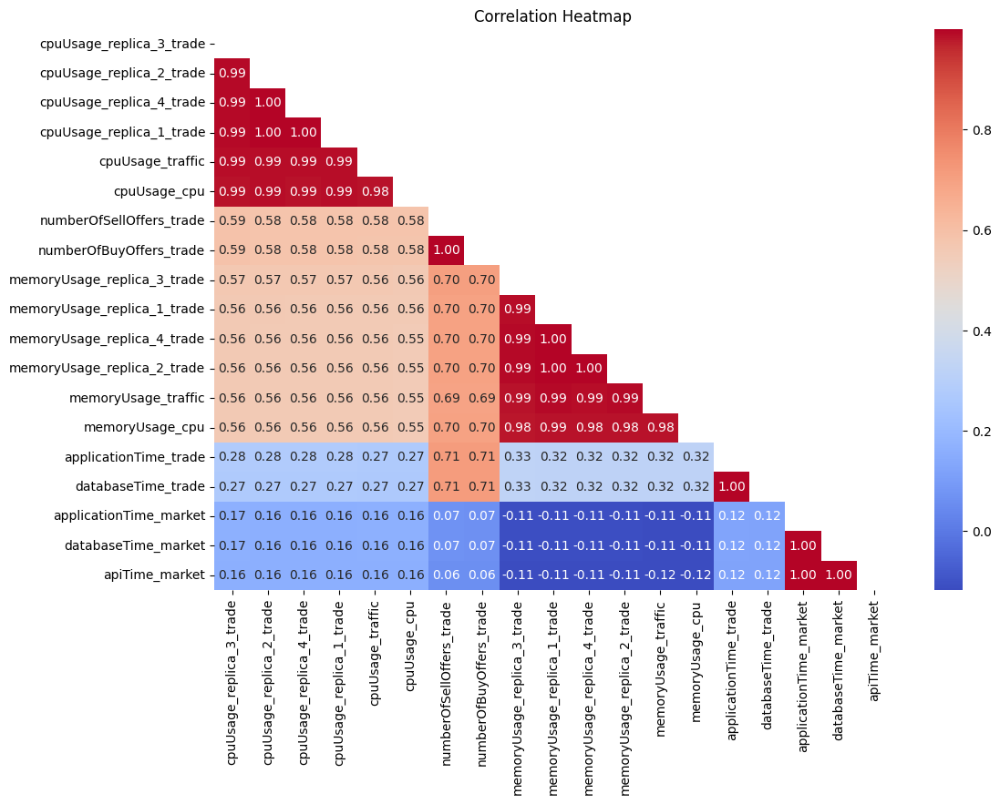

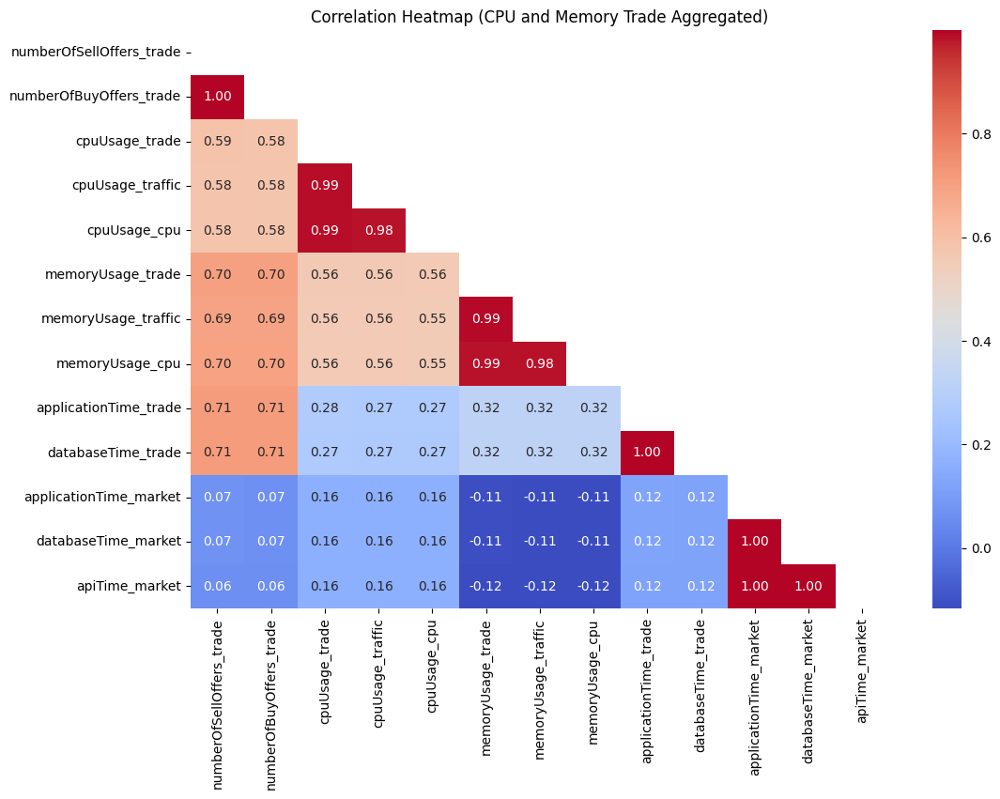

,antecedents,consequents,support,confidence,lift
1,high_databaseTime_trade,high_cpuUsage_market,0.36238,0.73324,1.23009
2,high_cpuUsage_traffic,high_cpuUsage_market,0.56594,0.95568,1.60326
3,high_cpuUsage_market,high_cpuUsage_traffic,0.56594,0.94944,1.60326
4,high_memoryUsage,high_databaseTime_trade,0.30420,0.76339,1.54464
6,high_databaseTime_trade,high_cpuUsage_traffic,0.35782,0.72401,1.22258
7,"high_memoryUsage, high_databaseTime_market",high_cpuUsage_market,0.14068,0.71694,1.20274
8,"high_memoryUsage, high_cpuUsage_market",high_databaseTime_trade,0.21028,0.73970,1.49671
9,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.26530,0.93865,1.57470
10,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.26530,0.93324,1.57591
11,"high_databaseTime_trade, high_databaseTime_market",high_cpuUsage_market,0.19156,0.74202,1.24482


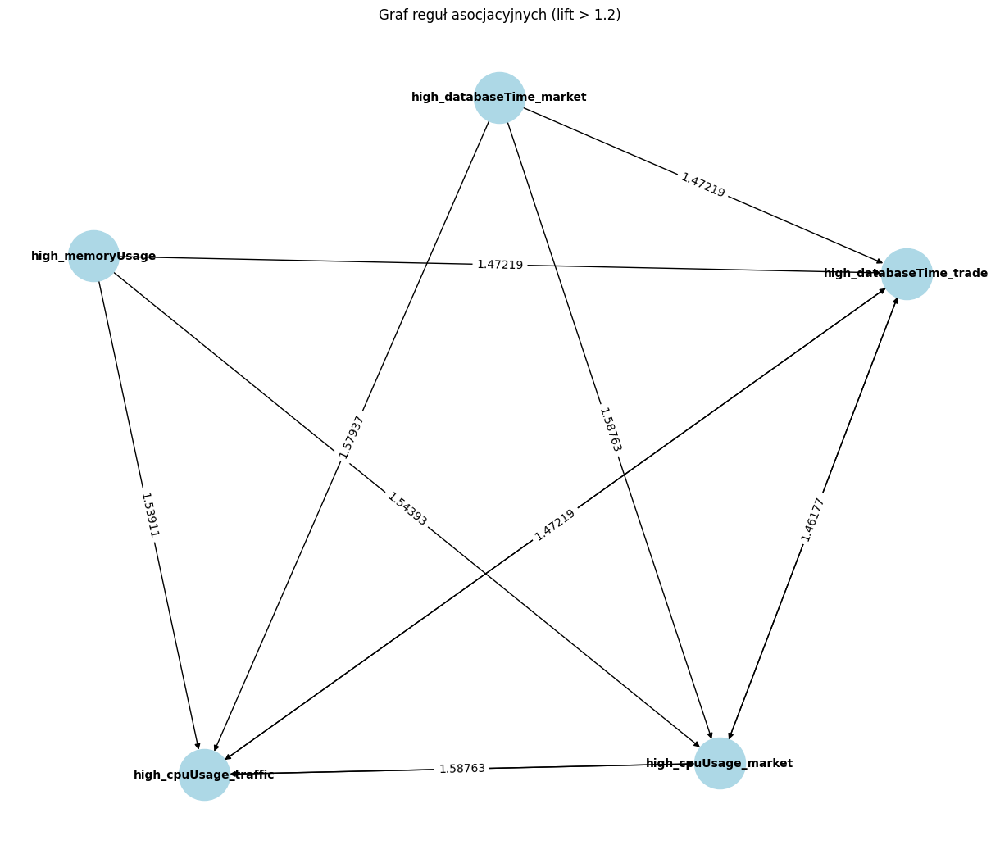

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 8 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 72.16733958156846
R² score: 0.999727339697618


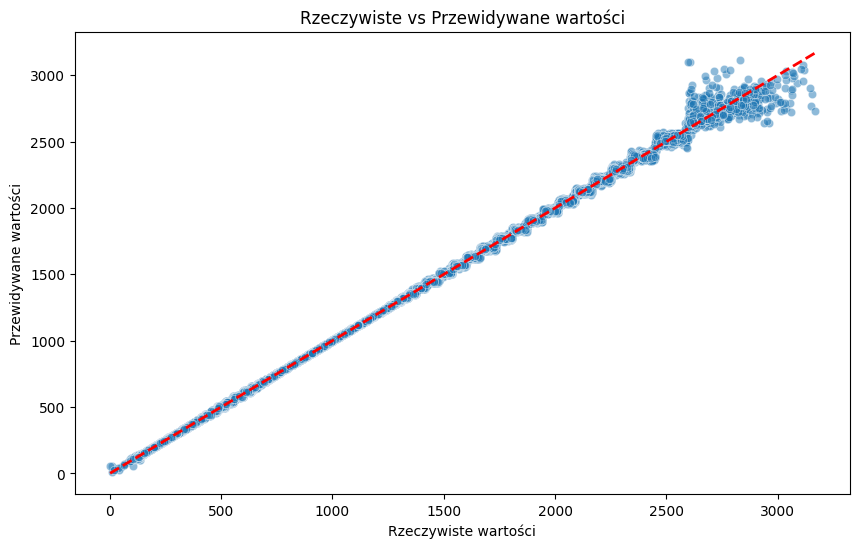

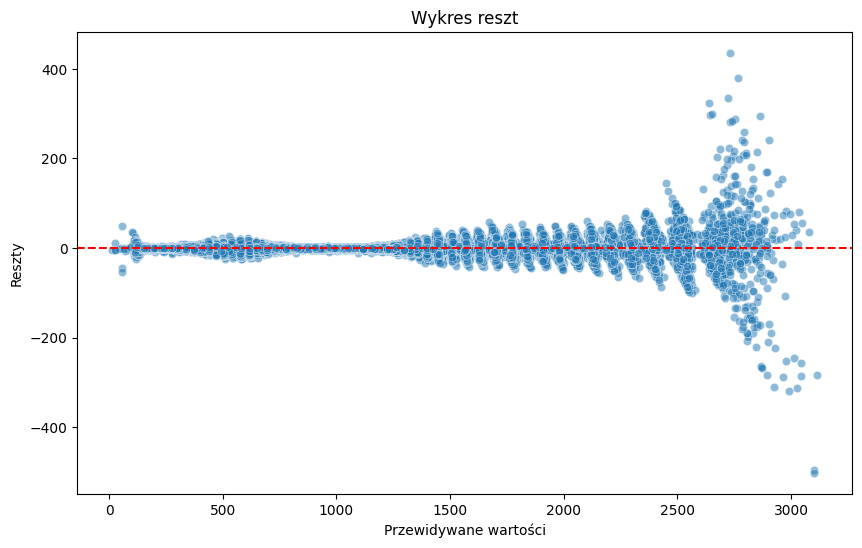

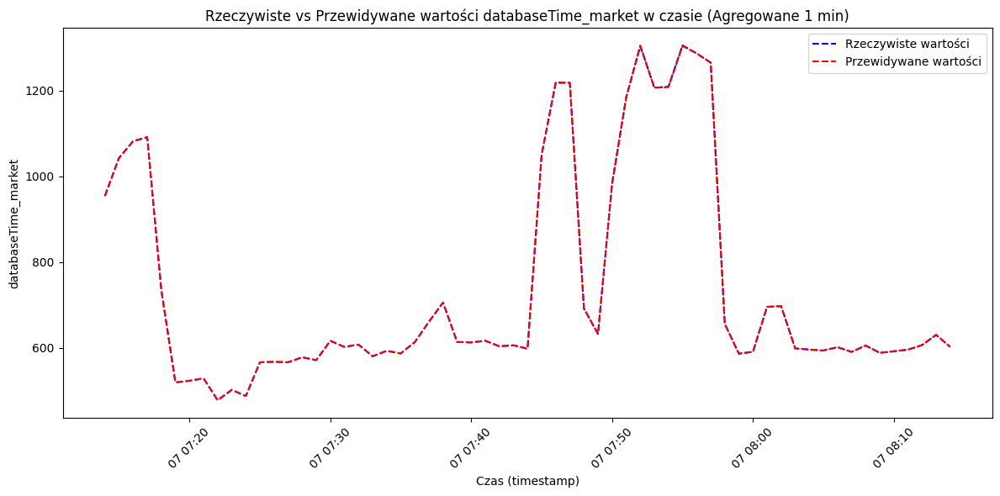

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test2\4 3 200 500 8 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.04423698332956079
R² score: 0.9996679282578383


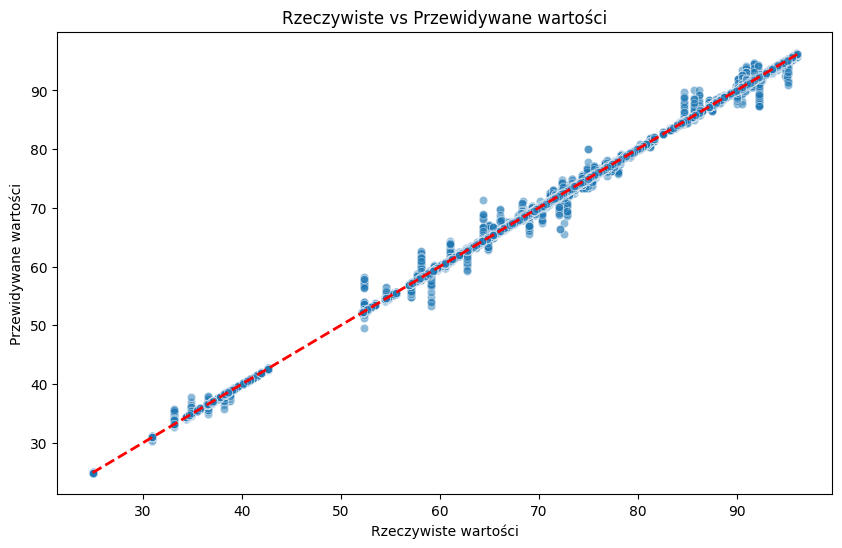

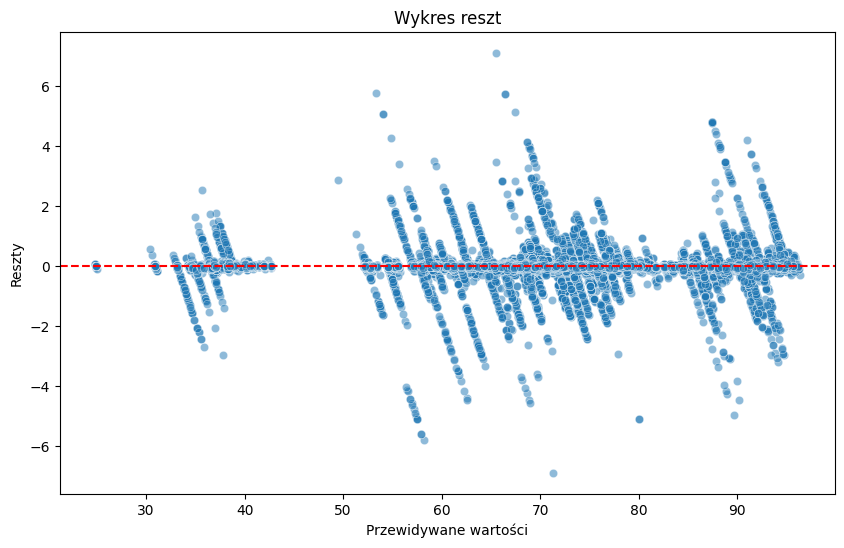

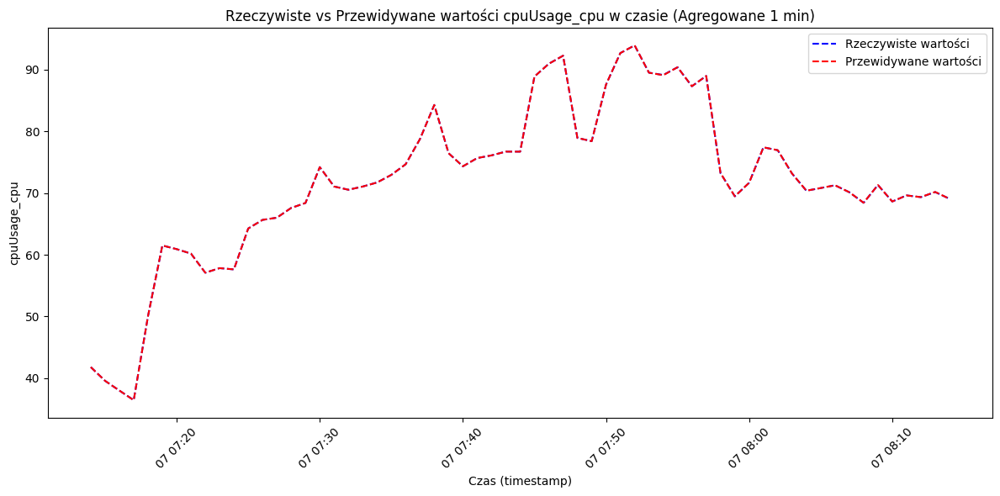

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv


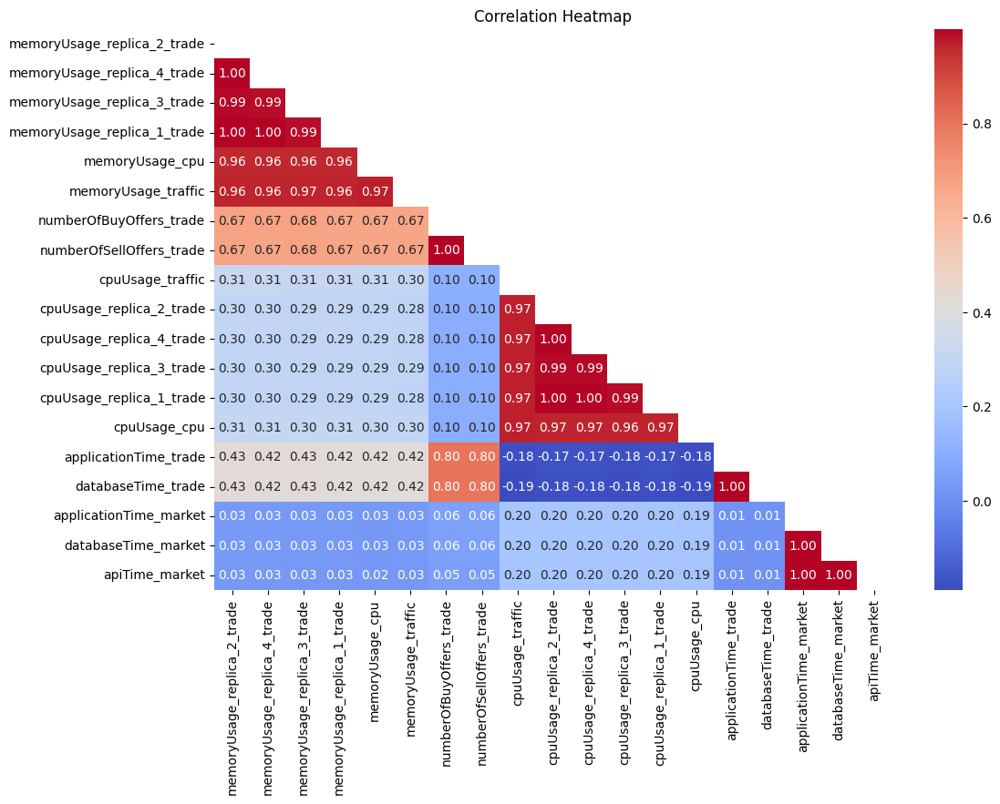

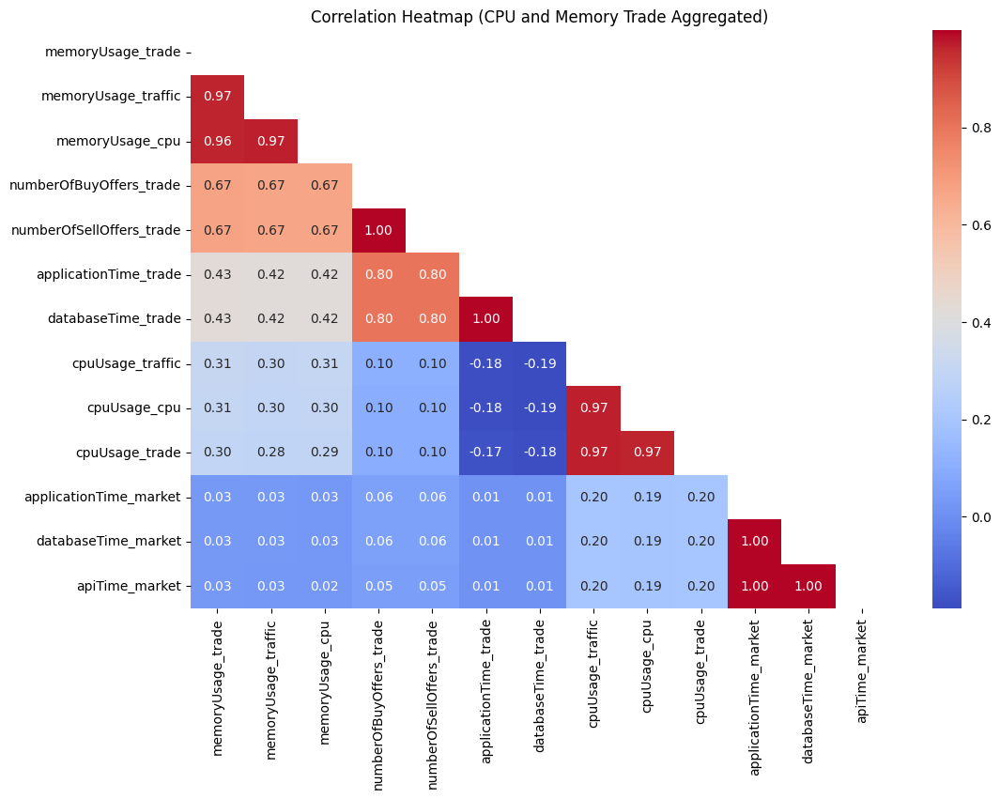

,antecedents,consequents,support,confidence,lift
1,high_cpuUsage_traffic,high_cpuUsage_market,0.29389,0.93201,2.94753
2,high_cpuUsage_market,high_cpuUsage_traffic,0.29389,0.92945,2.94753
3,high_databaseTime_trade,high_memoryUsage,0.41935,0.84003,1.31491
6,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.22101,0.93477,2.95628
7,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.22101,0.93697,2.97137
9,high_cpuUsage_traffic,"high_memoryUsage, high_cpuUsage_market",0.22101,0.70088,2.97137
10,"high_databaseTime_market, high_cpuUsage_traffic",high_cpuUsage_market,0.15491,0.93643,2.96153
11,"high_databaseTime_market, high_cpuUsage_market",high_cpuUsage_traffic,0.15491,0.93445,2.96338
12,"high_databaseTime_trade, high_databaseTime_market",high_memoryUsage,0.20858,0.82645,1.29366
14,"high_memoryUsage, high_databaseTime_market, hi...",high_cpuUsage_market,0.11185,0.93674,2.96251


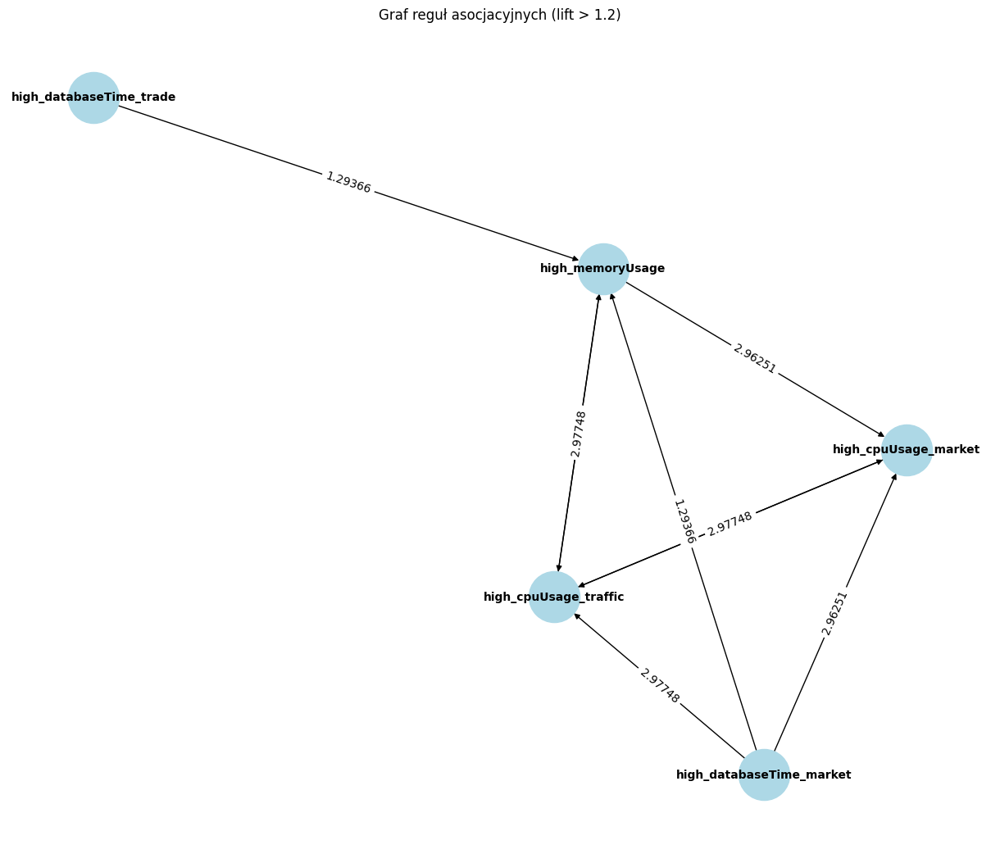

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 1000 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 144.40266000800722
R² score: 0.9992418728731707


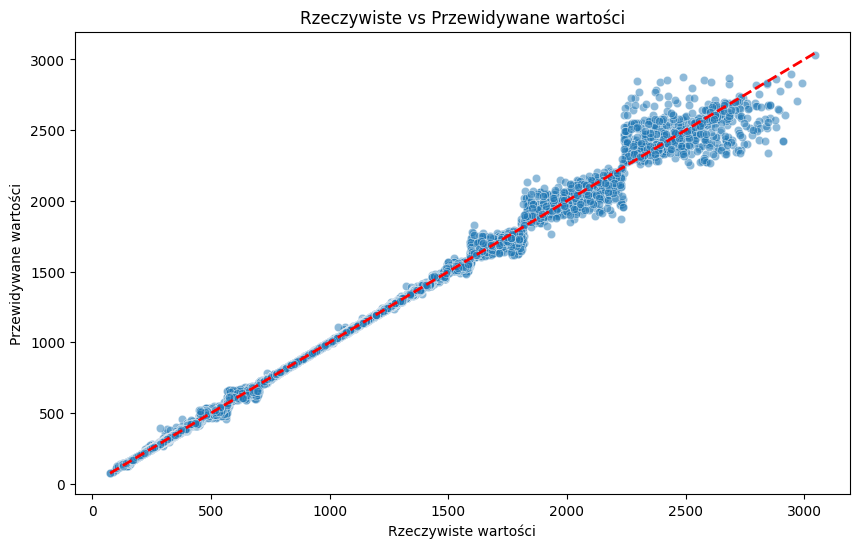

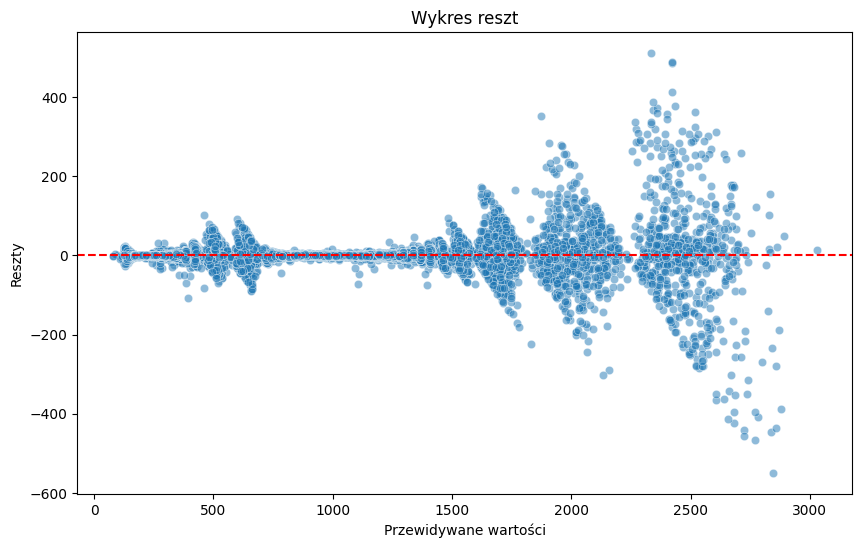

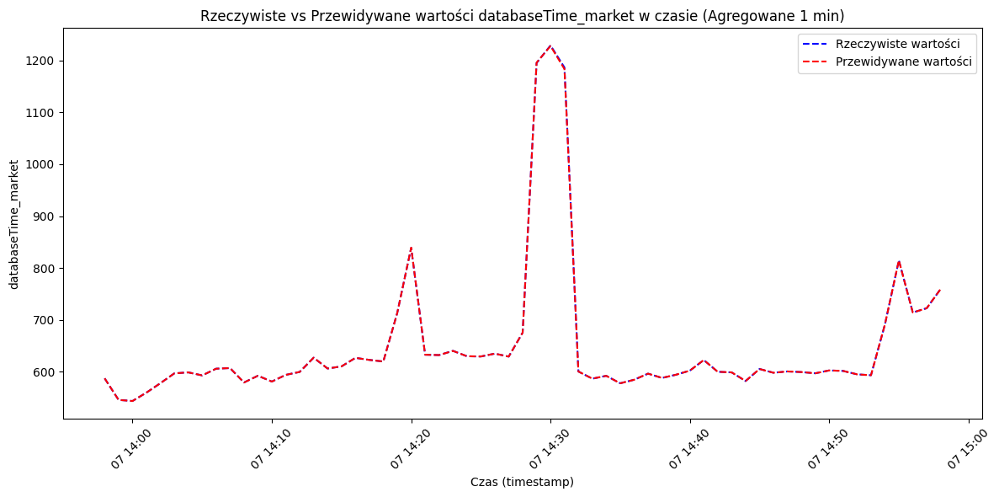

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 1000 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.0548112486967266
R² score: 0.9990497827638353


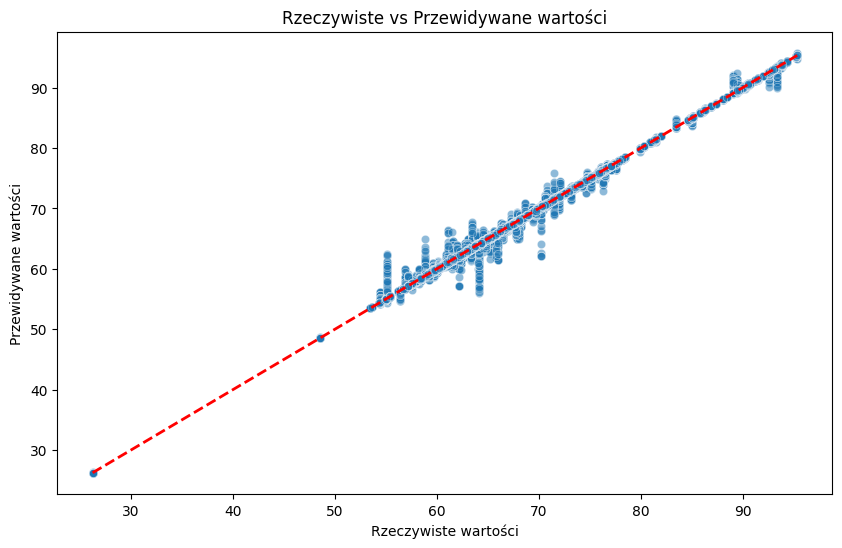

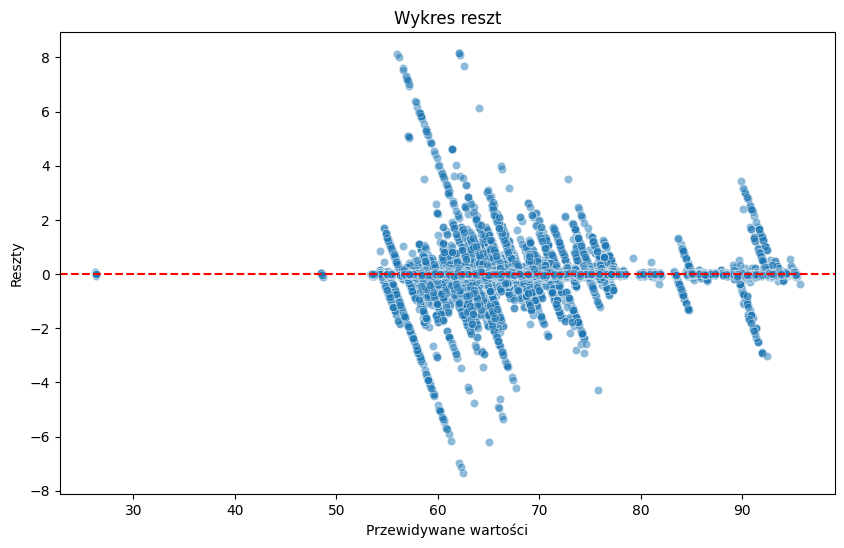

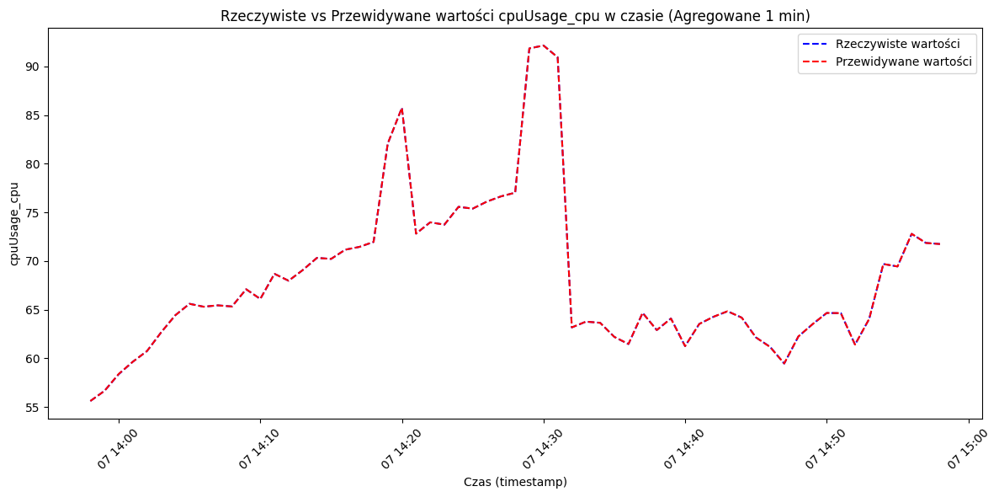

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv


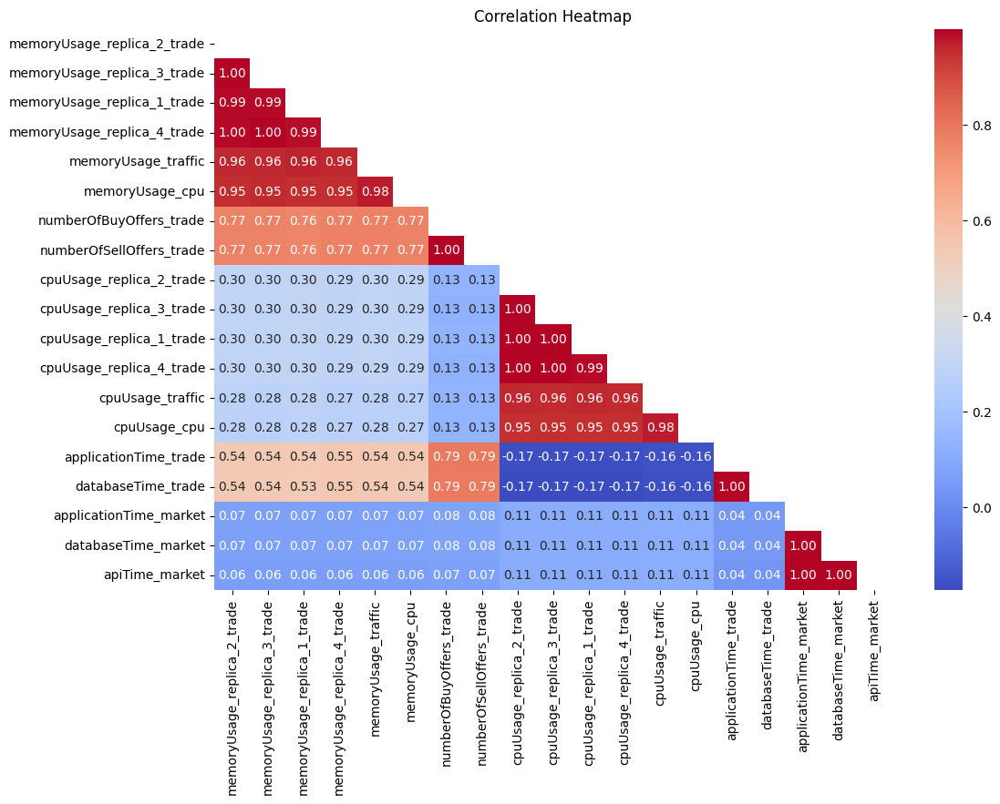

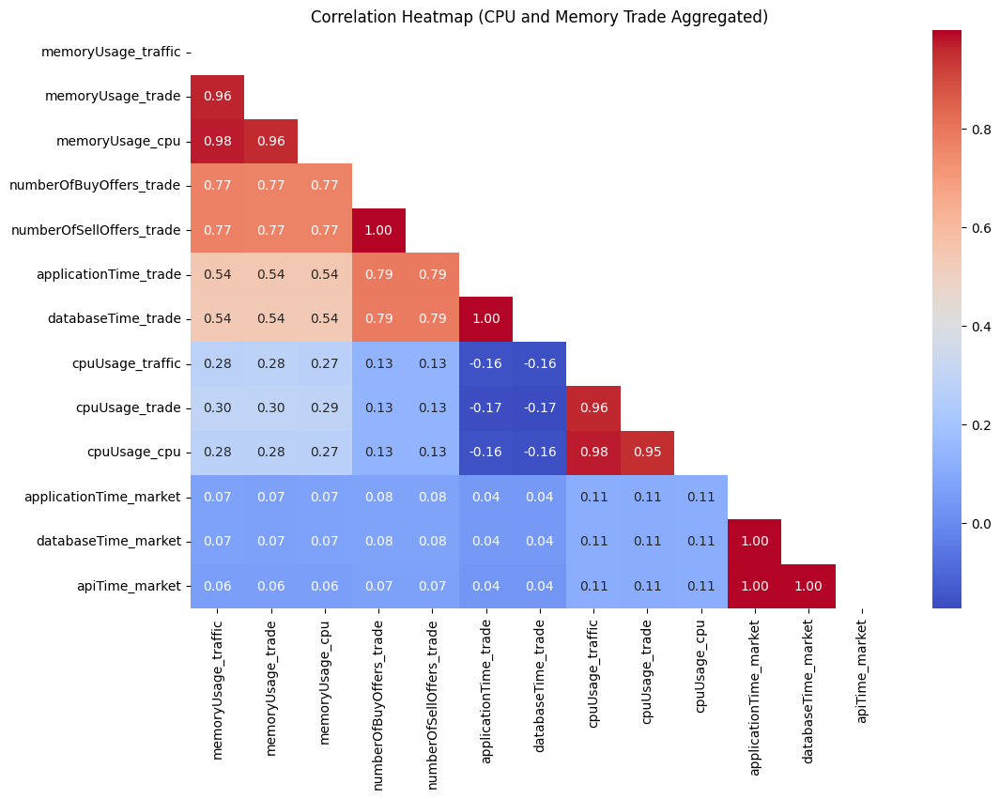

,antecedents,consequents,support,confidence,lift
0,high_cpuUsage_traffic,high_cpuUsage_market,0.24211,0.96781,3.82717
1,high_cpuUsage_market,high_cpuUsage_traffic,0.24211,0.95740,3.82717
2,high_memoryUsage,high_databaseTime_trade,0.45038,0.72869,1.46360
3,high_databaseTime_trade,high_memoryUsage,0.45038,0.90459,1.46360
4,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.15972,0.97098,3.83971
5,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.15972,0.96426,3.85459
6,"high_databaseTime_market, high_cpuUsage_traffic",high_cpuUsage_market,0.12384,0.96915,3.83246
7,"high_databaseTime_market, high_cpuUsage_market",high_cpuUsage_traffic,0.12384,0.95896,3.83342
8,"high_memoryUsage, high_databaseTime_market",high_databaseTime_trade,0.22847,0.72546,1.45711
9,"high_databaseTime_trade, high_databaseTime_market",high_memoryUsage,0.22847,0.90605,1.46595


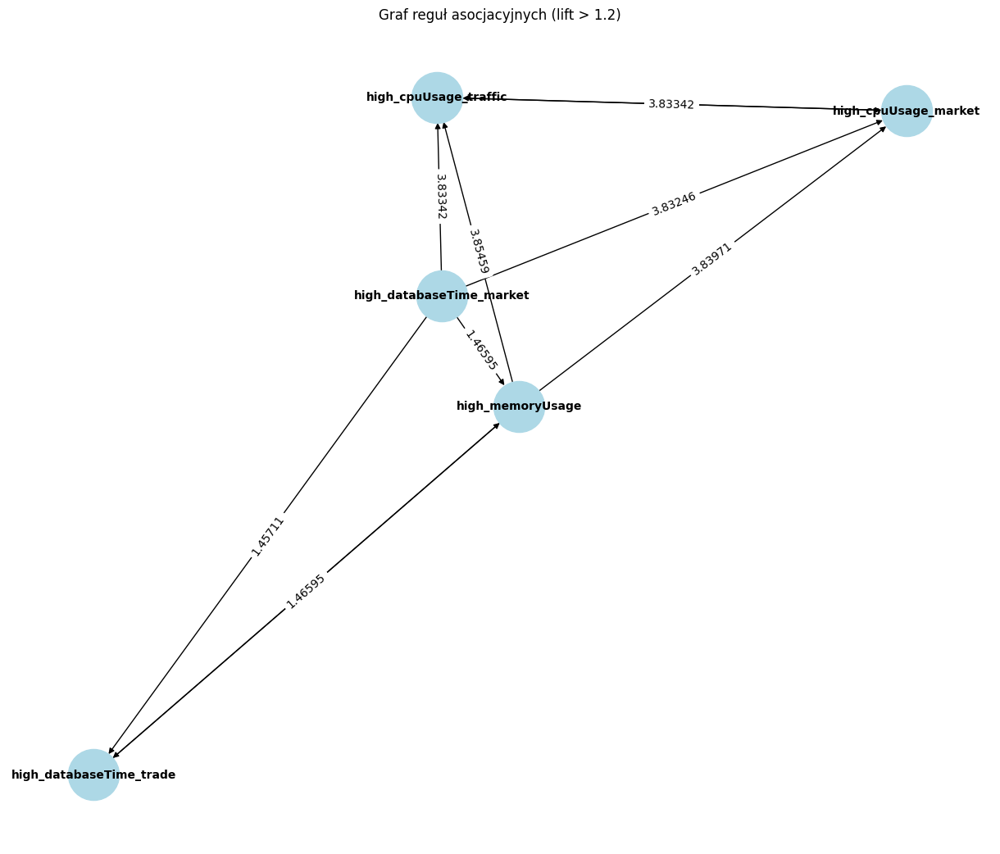

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 250 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 74.85019904280387
R² score: 0.9995322735362696


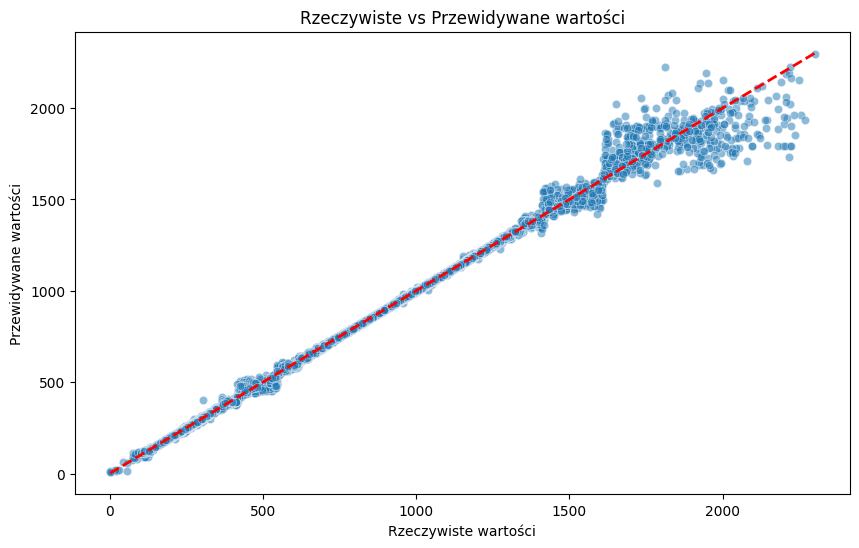

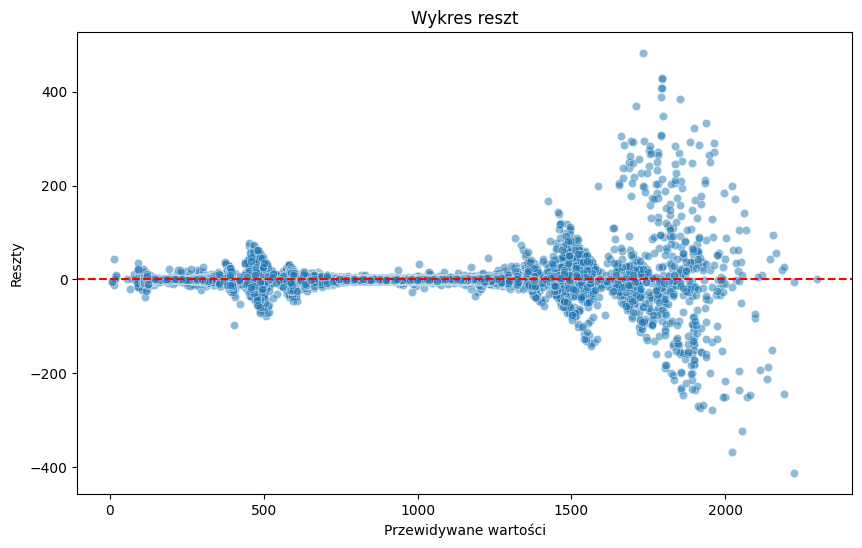

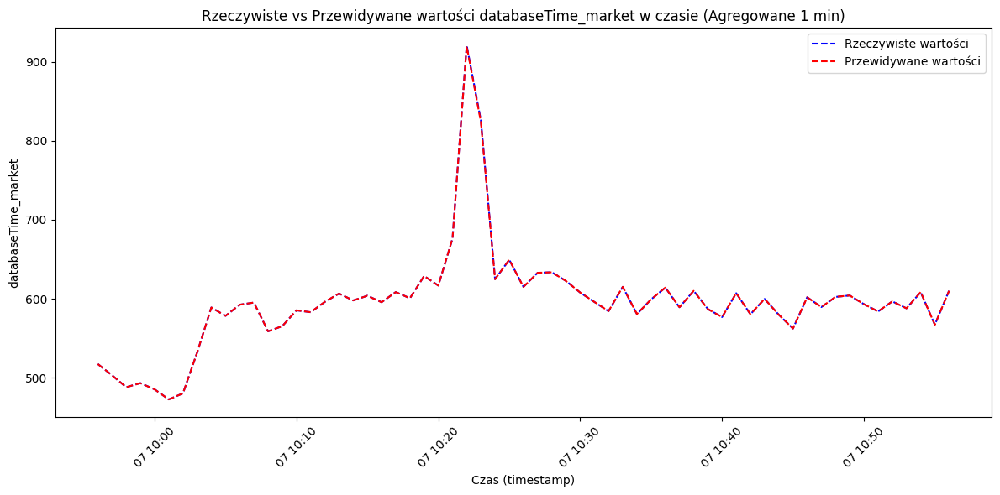

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 250 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.05438076554984817
R² score: 0.9991145090469983


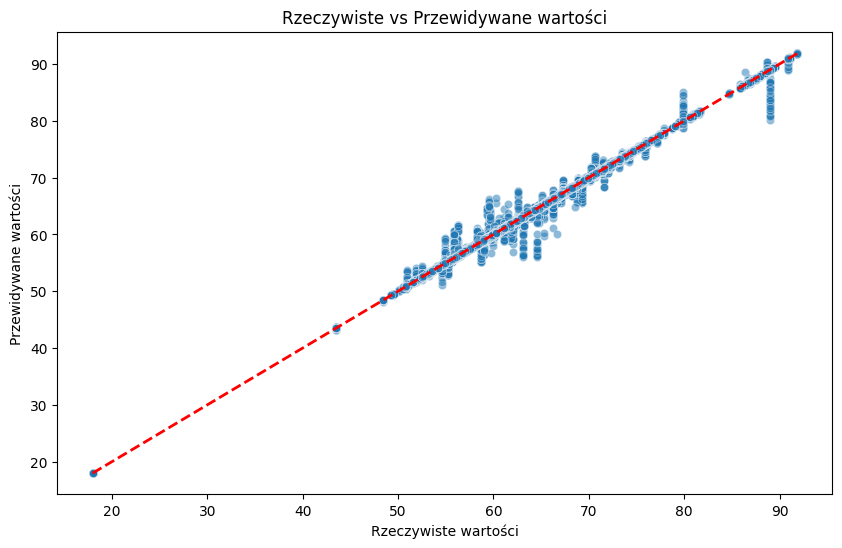

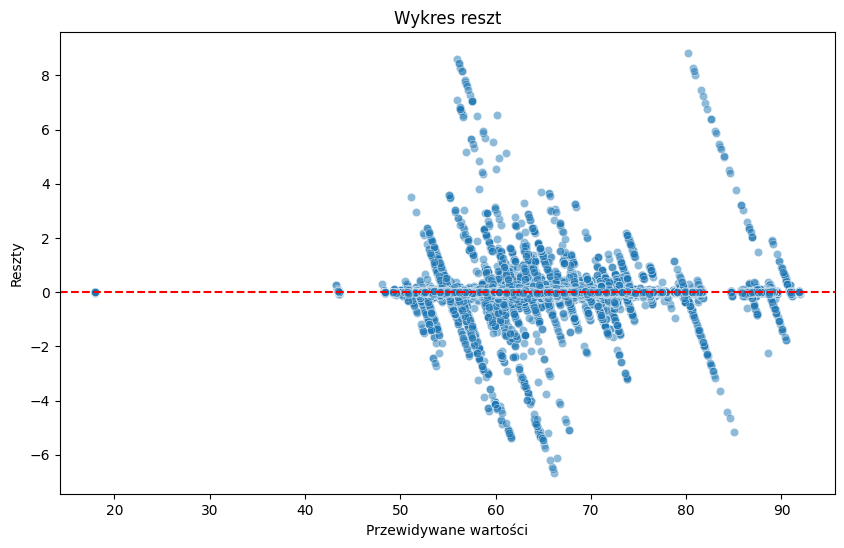

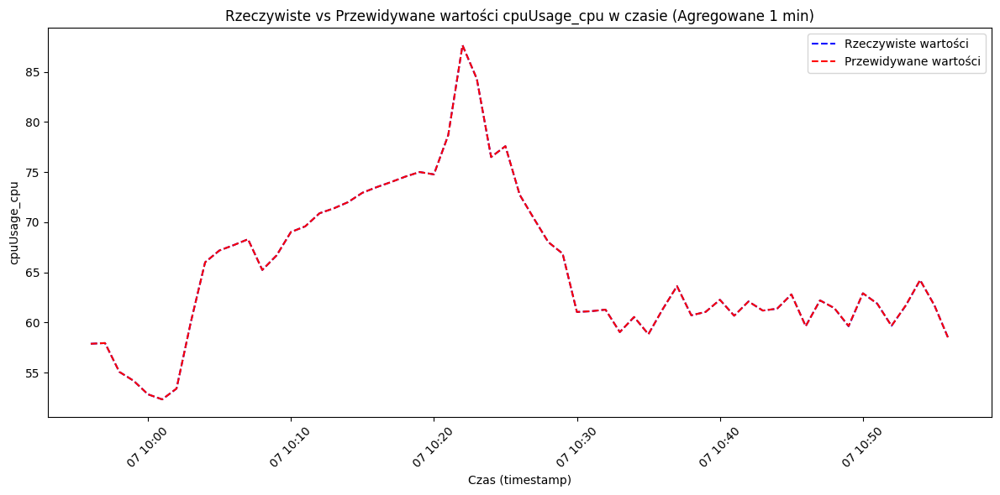

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv


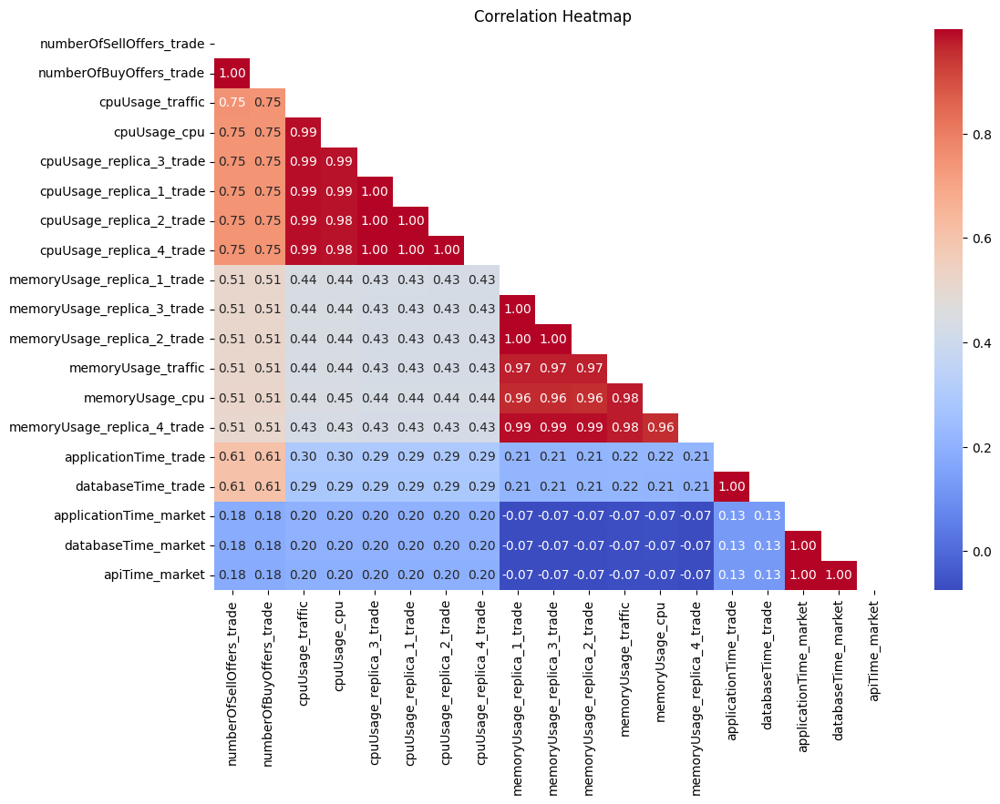

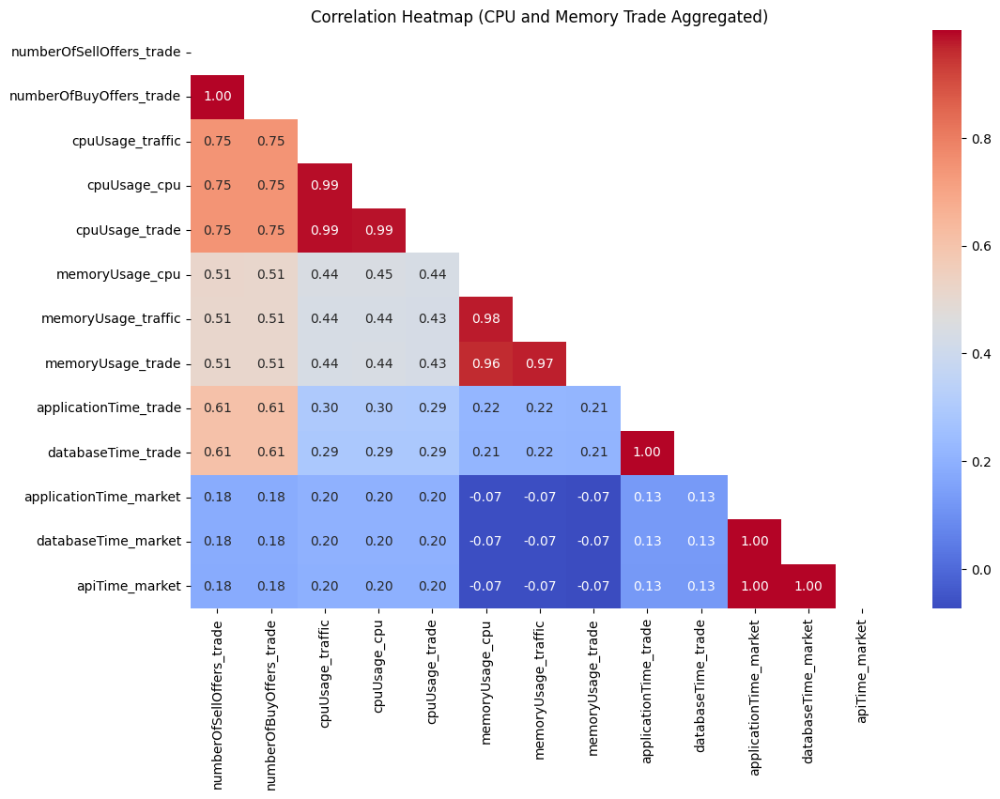

,antecedents,consequents,support,confidence,lift
0,high_memoryUsage,high_cpuUsage_market,0.44006,0.91743,1.35627
2,high_databaseTime_trade,high_cpuUsage_market,0.42302,0.86847,1.28389
3,high_cpuUsage_traffic,high_cpuUsage_market,0.66693,0.98886,1.46186
4,high_cpuUsage_market,high_cpuUsage_traffic,0.66693,0.98594,1.46186
5,high_memoryUsage,high_cpuUsage_traffic,0.43990,0.91709,1.35977
7,high_databaseTime_trade,high_cpuUsage_traffic,0.42416,0.87080,1.29114
8,"high_memoryUsage, high_databaseTime_market",high_cpuUsage_market,0.21149,0.92114,1.36175
9,"high_memoryUsage, high_databaseTime_trade",high_cpuUsage_market,0.28680,0.94418,1.39581
10,"high_memoryUsage, high_cpuUsage_traffic",high_cpuUsage_market,0.43518,0.98928,1.46248
11,"high_memoryUsage, high_cpuUsage_market",high_cpuUsage_traffic,0.43518,0.98891,1.46626


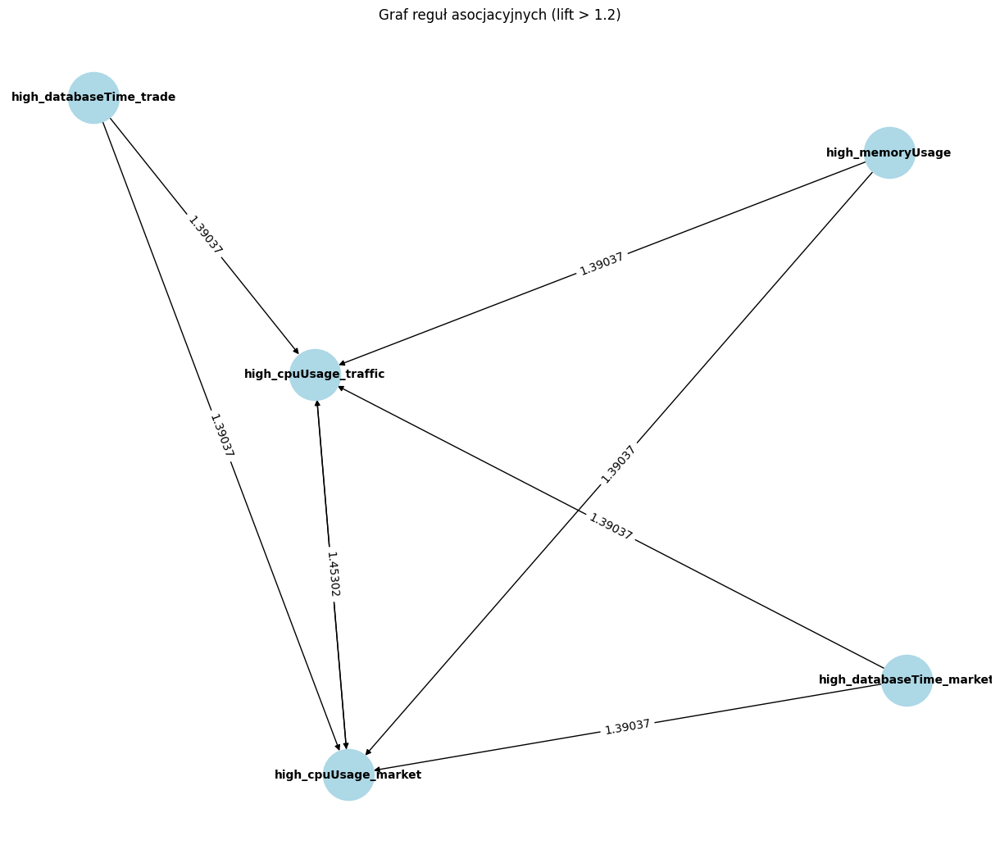

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 500 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 127.38080069470675
R² score: 0.9995365547944861


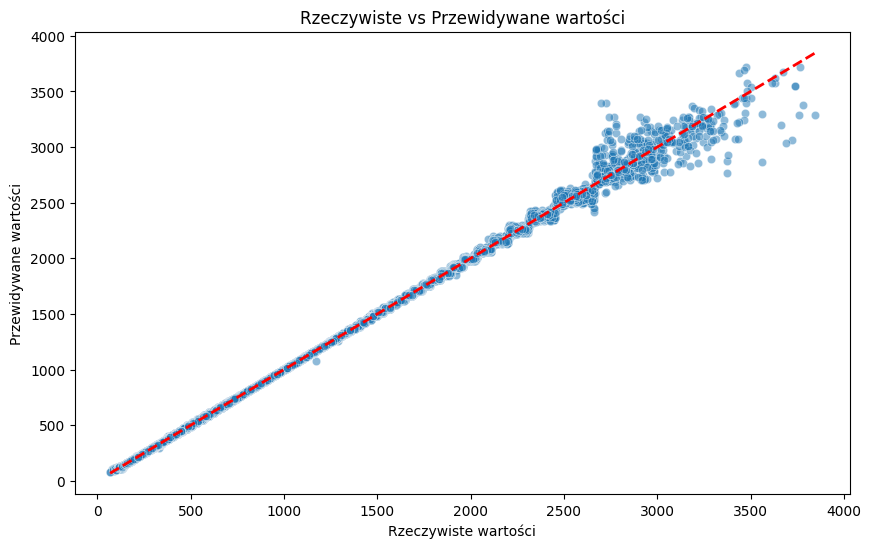

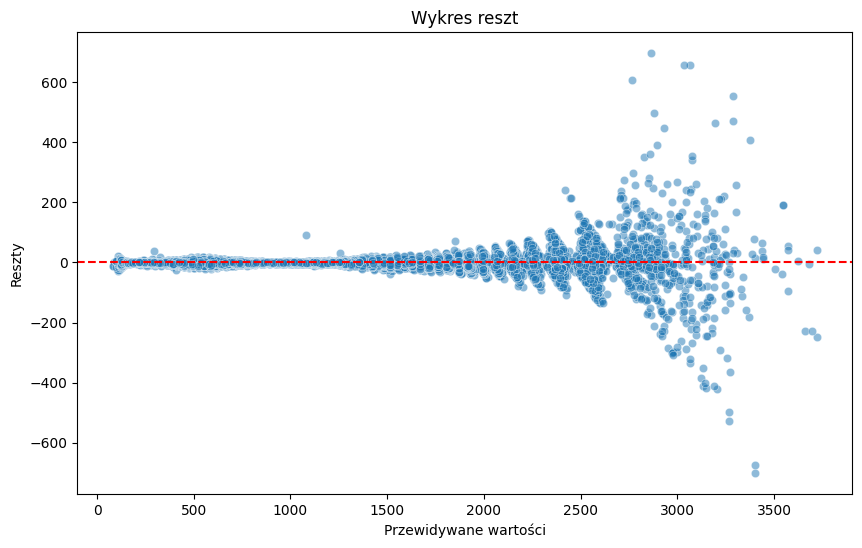

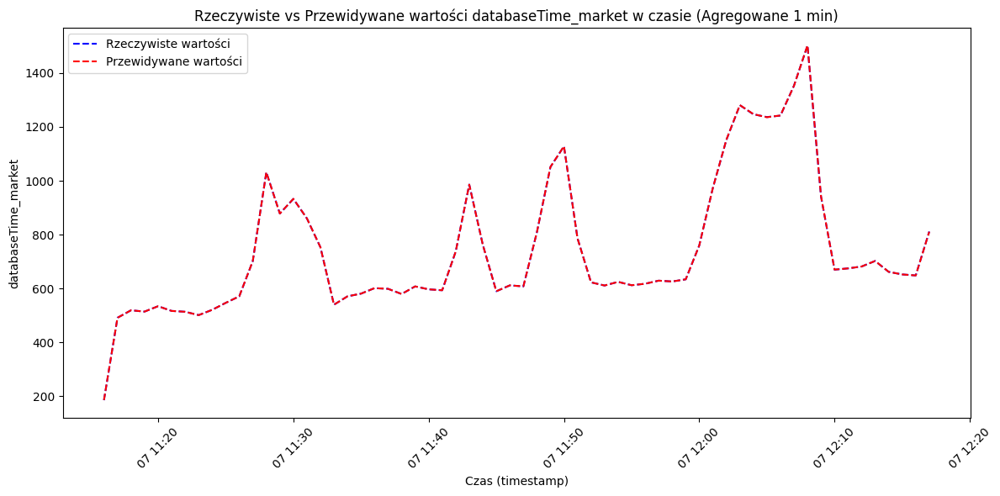

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 500 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.04287913803124204
R² score: 0.9997301511208585


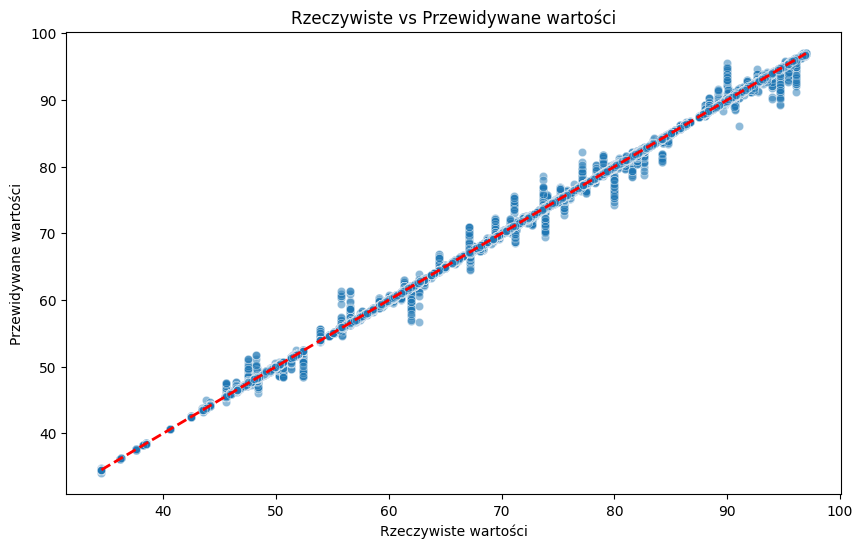

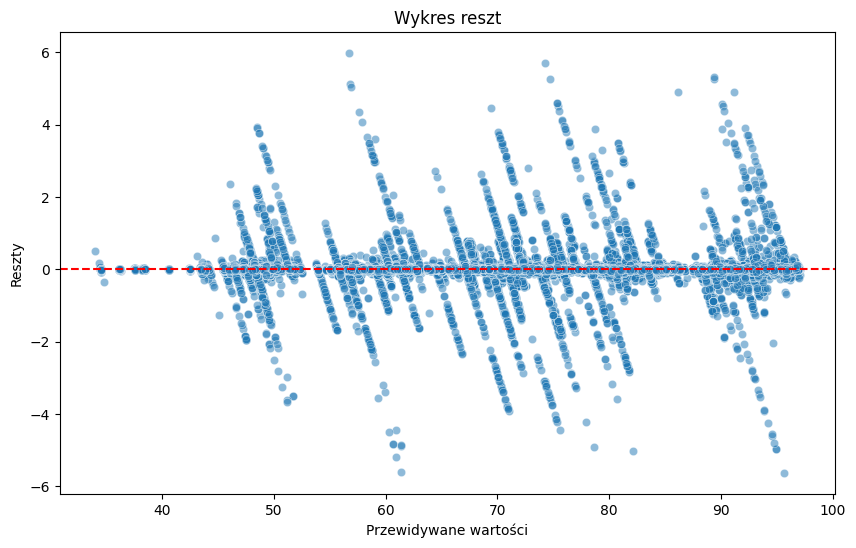

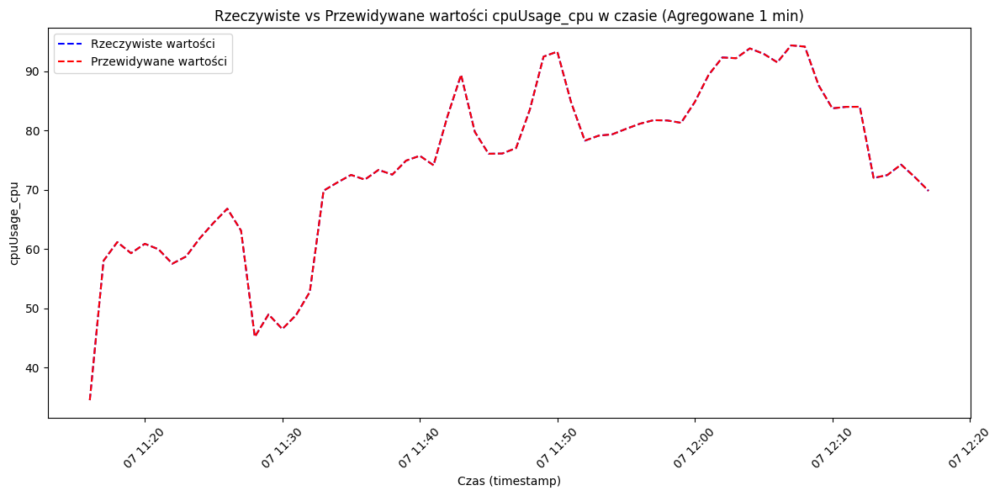

C:\Users\luki_\AppData\Local\Temp\ipykernel_64916\4273400733.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  trade_cpu_pivot_interpolated = trade_cpu_pivot_interpolated.fillna(method='bfill').fillna(method='ffill')


Dane dla repliki 4 zapisane w pliku: trade_replica4_cpu.csv
Dane dla repliki 1 zapisane w pliku: trade_replica1_cpu.csv
Dane dla repliki 3 zapisane w pliku: trade_replica3_cpu.csv
Dane dla repliki 2 zapisane w pliku: trade_replica2_cpu.csv


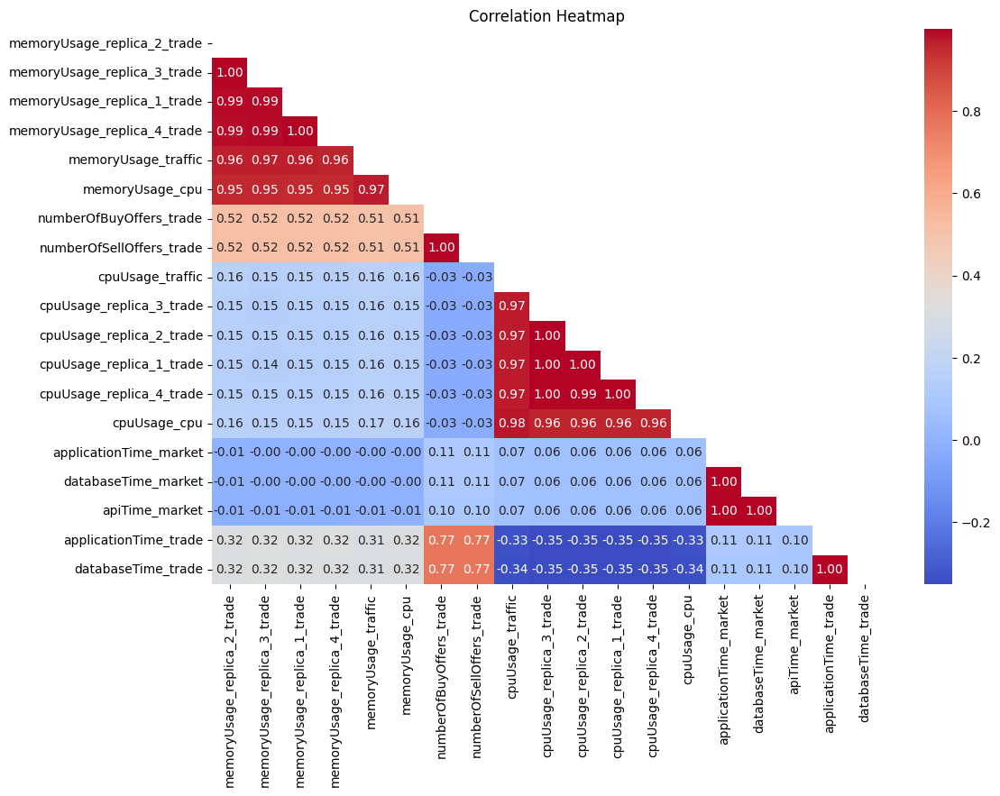

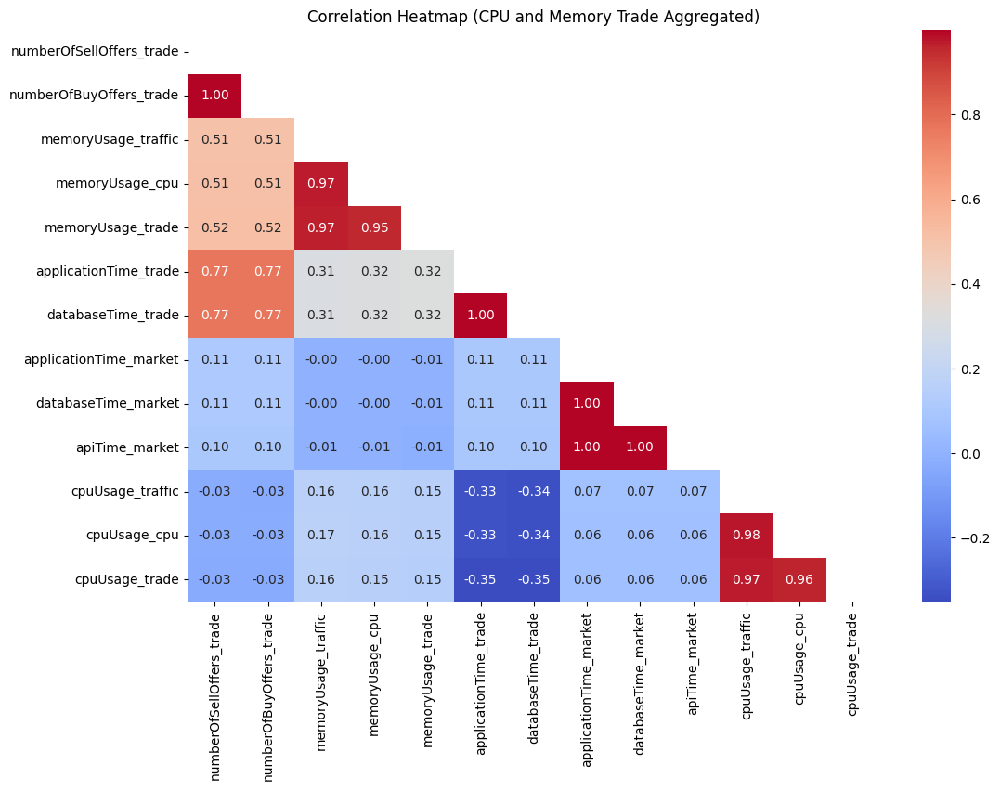

,antecedents,consequents,support,confidence,lift
0,high_cpuUsage_traffic,high_cpuUsage_market,0.26104,0.94399,3.45713
1,high_cpuUsage_market,high_cpuUsage_traffic,0.26104,0.95600,3.45713
2,high_memoryUsage,high_databaseTime_trade,0.25897,0.74001,1.48472
3,"high_databaseTime_market, high_cpuUsage_traffic",high_cpuUsage_market,0.13520,0.94788,3.47135
4,"high_databaseTime_market, high_cpuUsage_market",high_cpuUsage_traffic,0.13520,0.95790,3.46398
5,"high_memoryUsage, high_databaseTime_market",high_databaseTime_trade,0.12864,0.74342,1.49156


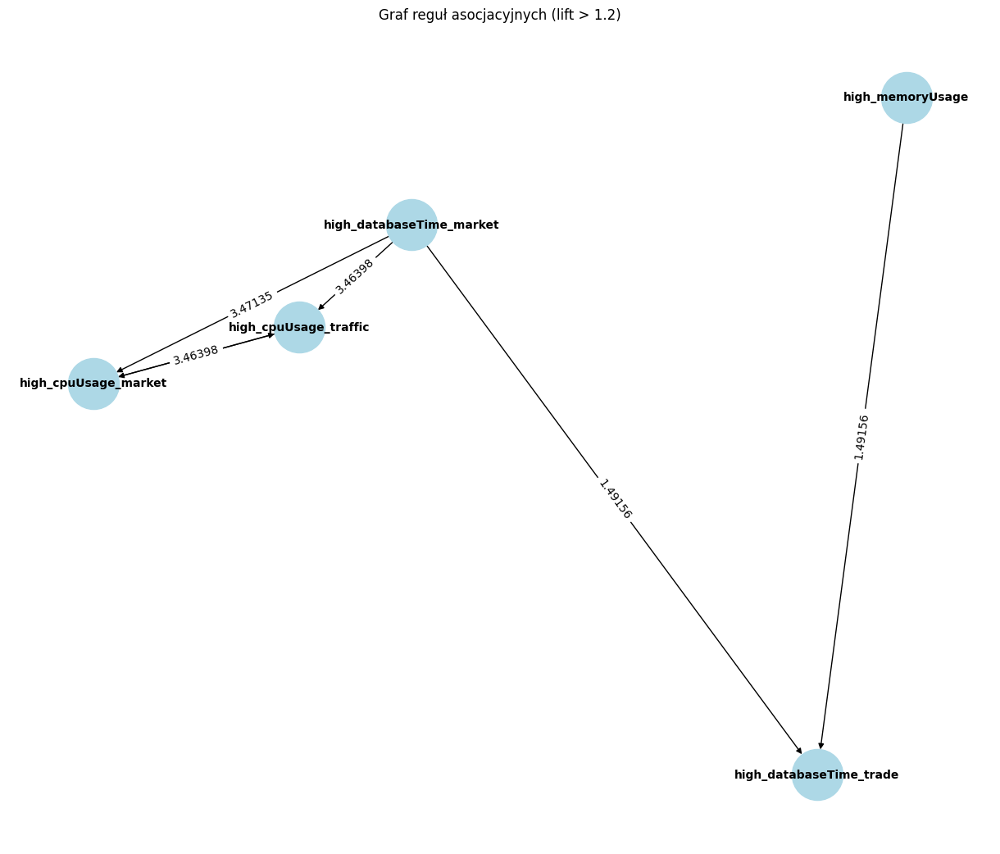

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 750 4 500 100/xgboost_gpu_model_databaseTime_market.pkl
Mean Squared Error: 120.8260458438123
R² score: 0.9994151906291415


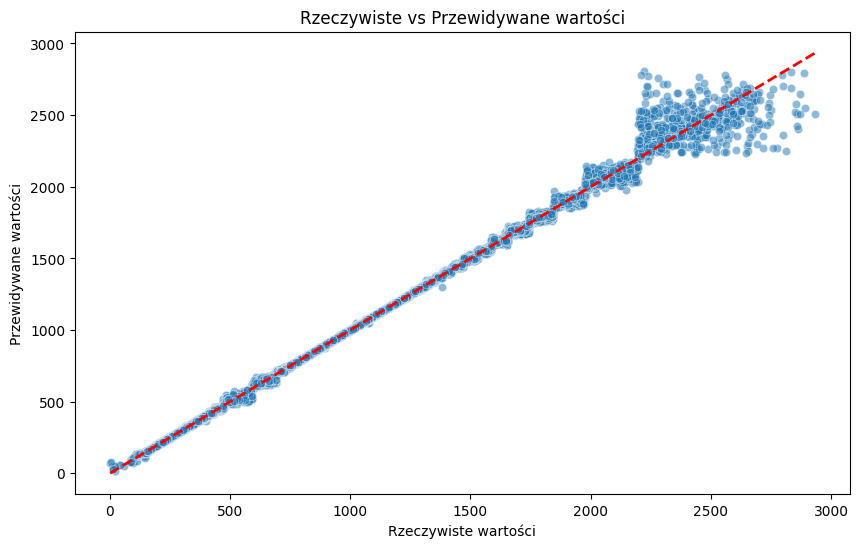

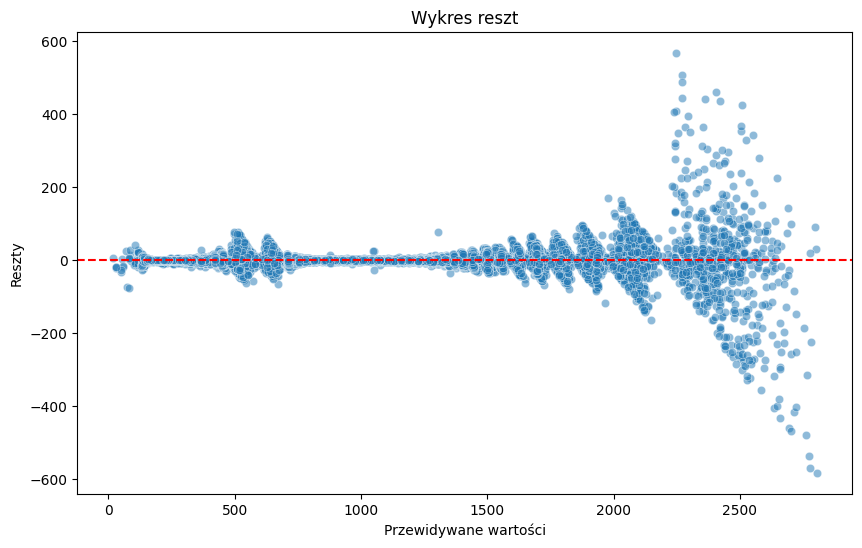

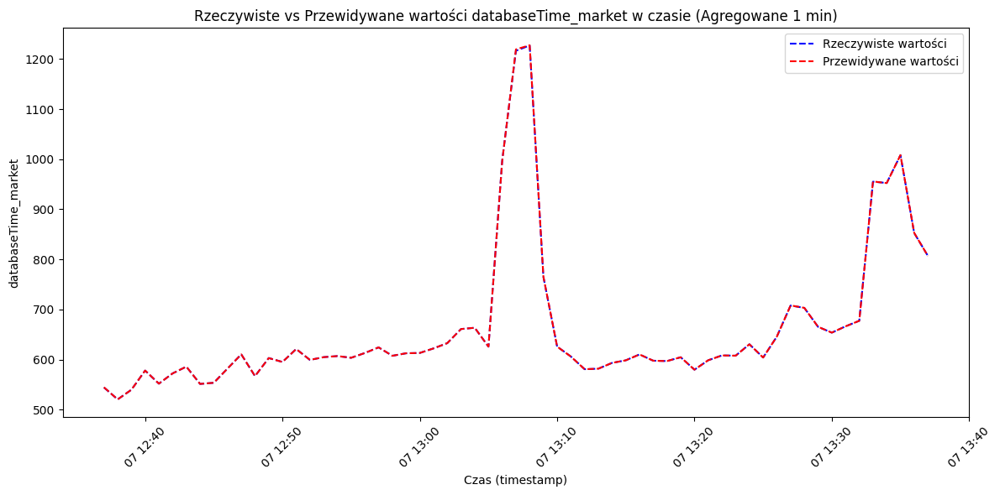

Trenowanie nowego modelu...
Model zapisany do c:\Users\luki_\Desktop\logs\test3\4 3 200 750 4 500 100/xgboost_gpu_model_cpuUsage_cpu.pkl
Mean Squared Error: 0.07421640899033571
R² score: 0.9988912169220538


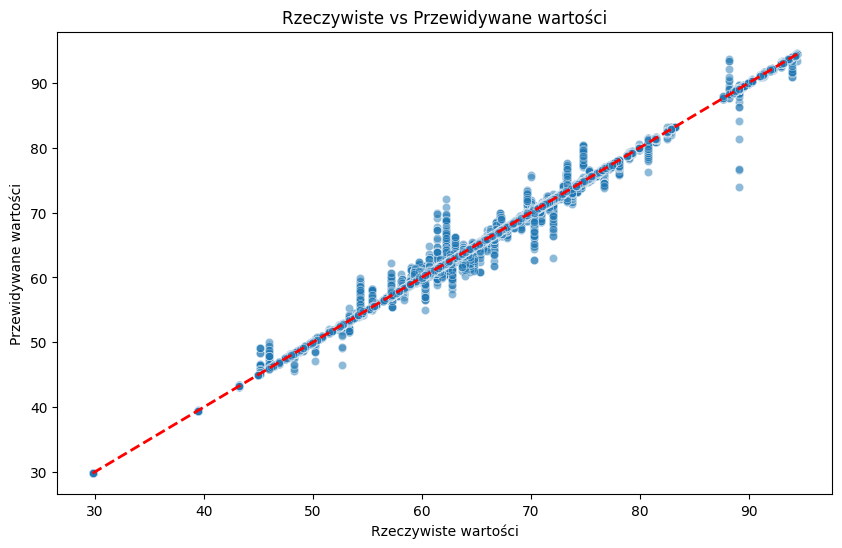

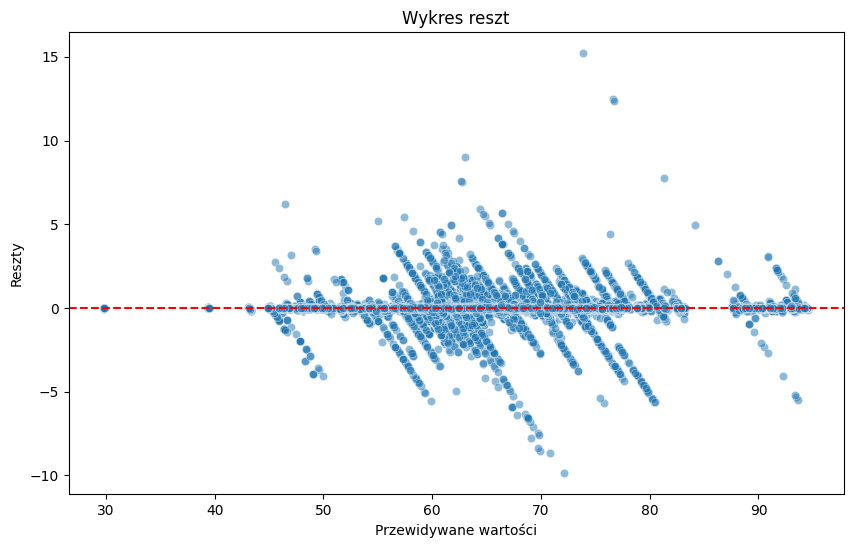

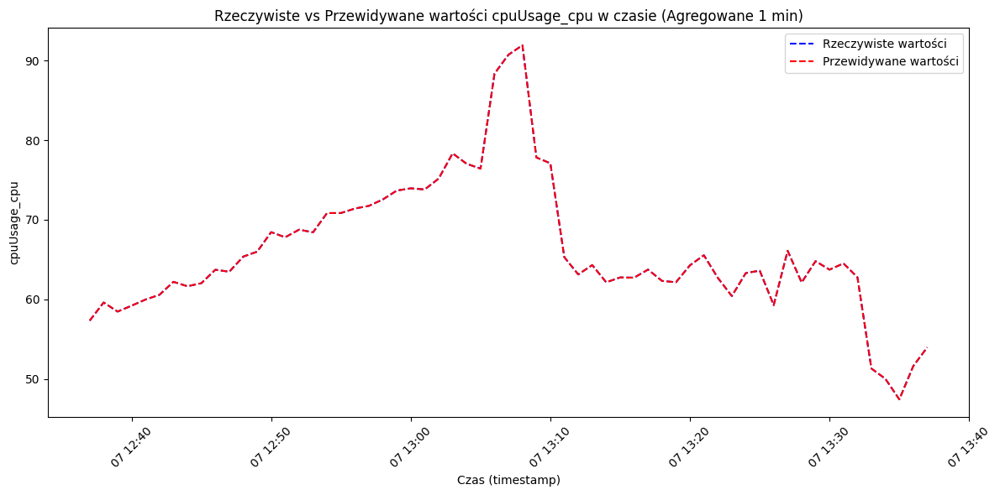

In [9]:
def has_csv_files(directory):
    # Sprawdza, czy w katalogu są jakiekolwiek pliki CSV
    for file in os.listdir(directory):
        if file.endswith('.csv'):
            return True
    return False

def analyzeLogs():
    # Pobieramy bieżący katalog, w którym znajduje się skrypt
    current_dir = os.getcwd()
    
    # Iterujemy przez katalogi test1, test2, test3
    for test_dir in ['test1', 'test2', 'test3']:
        test_dir_path = os.path.join(current_dir, test_dir)
        
        # Przechodzimy przez wszystkie podkatalogi w test1, test2, test3
        for root, dirs, files in os.walk(test_dir_path):
            # Sprawdzamy, czy w podkatalogu znajdują się wymagane pliki CSV
            if has_csv_files(root):
              sepReplicas(root)
              mergeData(root)
              bigCorrelation(root)
              smallCorrelation(root)
              association(root)
              xgbTree(root, 'databaseTime_market')
              xgbTree(root, 'cpuUsage_cpu')

analyzeLogs()